In [2]:
import random
import time
import os
import sys
# Automatically find and add the project root directory to sys.path
project_root = os.path.abspath(os.path.join(os.getcwd(), '..'))
if project_root not in sys.path:
    sys.path.insert(0, project_root)
from tsai.all import *
from fastai.vision.all import *
from sklearn.model_selection import train_test_split
from fastai.callback.tracker import EarlyStoppingCallback
from fastai.vision.all import *
from torch.utils.data.dataset import ConcatDataset
from tsai.utils import set_seed
from sklearn.preprocessing import MinMaxScaler
from scipy.interpolate import interp1d
# from aeon.datasets import load_classification
# from sktime.datasets import load_UCR_UEA_dataset
from lomatce.explainer import LomatceExplainer
import lomatce.perturbation as perturbation 
import lomatce.utils.test_dataloader as test_loader




set_seed(1024)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
# device = "cpu"
print(f"device: {device}")
my_setup()

device: cuda
os              : Windows-10-10.0.26200-SP0
python          : 3.11.13
tsai            : 0.3.9
fastai          : 2.7.14
fastcore        : 1.5.29
torch           : 2.2.2+cu118
device          : 1 gpu (['NVIDIA GeForce RTX 4050 Laptop GPU'])
cpu cores       : 14
threads per cpu : 1
RAM             : 15.68 GB
GPU memory      : [6.0] GB


In [3]:
# Set a random seed to ensure that the results are reproducible
random_seed = 45

torch.manual_seed(random_seed)
random.seed(random_seed)
np.random.seed(random_seed)

In [4]:
# List of univariate datasets from UCR archive
print(get_UCR_univariate_list())

# List of multivariate datasets from UCR archieve
print(get_UCR_multivariate_list())

['ACSF1', 'Adiac', 'AllGestureWiimoteX', 'AllGestureWiimoteY', 'AllGestureWiimoteZ', 'ArrowHead', 'Beef', 'BeetleFly', 'BirdChicken', 'BME', 'Car', 'CBF', 'Chinatown', 'ChlorineConcentration', 'CinCECGTorso', 'Coffee', 'Computers', 'CricketX', 'CricketY', 'CricketZ', 'Crop', 'DiatomSizeReduction', 'DistalPhalanxOutlineAgeGroup', 'DistalPhalanxOutlineCorrect', 'DistalPhalanxTW', 'DodgerLoopDay', 'DodgerLoopGame', 'DodgerLoopWeekend', 'Earthquakes', 'ECG200', 'ECG5000', 'ECGFiveDays', 'ElectricDevices', 'EOGHorizontalSignal', 'EOGVerticalSignal', 'EthanolLevel', 'FaceAll', 'FaceFour', 'FacesUCR', 'FiftyWords', 'Fish', 'FordA', 'FordB', 'FreezerRegularTrain', 'FreezerSmallTrain', 'Fungi', 'GestureMidAirD1', 'GestureMidAirD2', 'GestureMidAirD3', 'GesturePebbleZ1', 'GesturePebbleZ2', 'GunPoint', 'GunPointAgeSpan', 'GunPointMaleVersusFemale', 'GunPointOldVersusYoung', 'Ham', 'HandOutlines', 'Haptics', 'Herring', 'HouseTwenty', 'InlineSkate', 'InsectEPGRegularTrain', 'InsectEPGSmallTrain', 'I

In [5]:
dsid = 'CBF'
dataset_name = dsid.lower()
model = 'tst'.lower()

cur_time = time.strftime('%Y-%m-%d_%H-%M-%S')
if 'cuda' in str(device):
    base_dir = f'../results/{dataset_name}/{model}--{cur_time}' 
else:
    base_dir = f'../results/{dataset_name}/{model}--2023-12-28_16-37-54' 
#Create the base directory if not exist
os.makedirs(base_dir, exist_ok=True)

In [6]:
dsid= 'CBF'
X, y, splits  = get_UCR_data(dsid, on_disk=True, return_split=False)

In [7]:
unique_classes, counts = np.unique(y, return_counts=True)
for cls, count in zip(unique_classes, counts):
    print(f"Class {cls}: {count} instances")

Class 1: 310 instances
Class 2: 310 instances
Class 3: 310 instances


### Load and preprocess data

In [8]:
def data_preparation(X, y, test_size=0.3, random_state=12):
    # Stratified split to maintain class distribution

    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, stratify=y, random_state=random_state)
    X_test, X_valid, y_test, y_valid = train_test_split(X_test, y_test, test_size=0.5, stratify=y_test, random_state=random_state)

    print(f'Shape of X_train :{X_train.shape}')
    print(f'Shape of y_train :{y_train.shape}')
    print(f'Shape of X_valid :{X_valid.shape}')
    print(f'Shape of X_test :{X_test.shape}')

    tfms  = [None, [Categorize()]]
    train_ds = TSDatasets(X_train, y_train, tfms=tfms)
    valid_ds = TSDatasets(X_valid, y_valid, tfms=tfms)


    dls = TSDataLoaders.from_dsets(train_ds, valid_ds, bs=[8, 32], batch_tfms=[TSStandardize()], num_workers=0,  device=device, shuffle=True )
    print(f' Number of classes : {dls.c}')
    return dls, X_train, X_test, y_test

In [9]:
lomatce_explainer = LomatceExplainer(base_dir=base_dir)
dls, X_train, X_test, y_test = data_preparation(X, y)

Shape of X_train :(651, 1, 128)
Shape of y_train :(651,)
Shape of X_valid :(140, 1, 128)
Shape of X_test :(139, 1, 128)
 Number of classes : 3


### Build learner and train model

In [10]:
def trainer (model, dls, epochs=100, learning_rate=1e-3, patience=15):
    kwargs = {}
    metrics=[accuracy]
    path = f'{base_dir}/export'
    os.makedirs(path, exist_ok=True)
    # Create model
    model = create_model(model, dls=dls, **kwargs)
    # Define early stopping criteria
    early_stopping = EarlyStoppingCallback(monitor='valid_loss', min_delta=0.001, patience=patience)

    # Define a call back to save the best model
    save_callback = SaveModelCallback(monitor='accuracy')
    # Train and evaluate model with early stopping
    # set_seed(42)
    cbs = [early_stopping, save_callback,ShowGraph()]
    learn = Learner(dls=dls, model=model, opt_func=Adam, metrics=metrics,cbs=cbs) #
    learn.fit_one_cycle(epochs, learning_rate)
    learn.save_all(path=path, dls_fname='dls', model_fname='model', learner_fname='learner')
    return learn

def validator(learn, X_test, y_test):
    dls = learn.dls
    valid_dl = dls.valid
    train_dl = dls.train
    # Labelled test data
    test_ds = valid_dl.dataset.add_test(X_test, y_test)# In this case I'll use X and y, but this would be your test data
    test_dl = valid_dl.new(test_ds)
    test_probas, test_targets, test_preds = learn.get_preds(dl=test_dl, with_decoded=True, save_preds=None, save_targs=None)
    # print(f'Test Accuracy: {skm.accuracy_score(test_targets, test_preds):10.6f}')
    valid_probas, valid_targets, valid_preds = learn.get_preds(dl=valid_dl, with_decoded=True)
    train_probas, train_targets, train_preds = learn.get_preds(dl=train_dl, with_decoded=True)
    
    valid_accuracy = (valid_targets == valid_preds).float().mean()
    test_accuracy = (test_targets == test_preds).float().mean()
    train_accuracy = (train_targets == train_preds).float().mean()

    print(f"Validation Accuracy :{valid_accuracy:.2f}")
    print(f"Test Accuracy :{test_accuracy:.2f}")
    print(f"Train Accuracy :{train_accuracy:.2f}")
    valid_dl.show_batch(sharey=True)
    test_dl.show_batch(sharey=True)
    learn.show_results(max_n=9)

    return train_accuracy, valid_accuracy, test_accuracy, test_preds, valid_preds

Shape of X_train :(651, 1, 128)
Shape of y_train :(651,)
Shape of X_valid :(140, 1, 128)
Shape of X_test :(139, 1, 128)
 Number of classes : 3
Start training...


epoch,train_loss,valid_loss,accuracy,time
0,0.440559,0.263940,0.935714,00:01
1,0.214044,0.121458,0.985714,00:01
2,0.104315,0.049738,1.000000,00:04
3,0.049349,0.020203,1.000000,00:05
4,0.023094,0.011105,1.000000,00:05
5,0.009151,0.005732,1.000000,00:05
6,0.007105,0.003704,1.000000,00:05
7,0.004337,0.002125,1.000000,00:06
8,0.001475,0.002493,1.000000,00:06
9,0.000912,0.021587,0.992857,00:06


Better model found at epoch 0 with accuracy value: 0.9357143044471741.


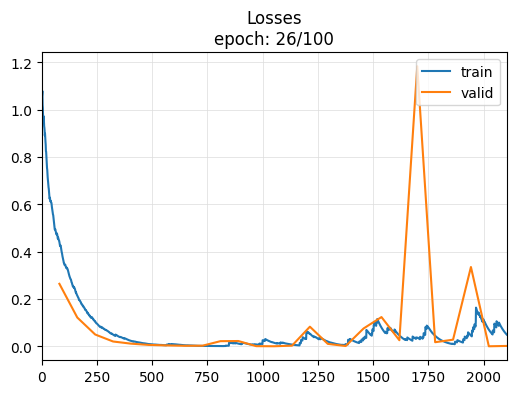

Better model found at epoch 1 with accuracy value: 0.9857142567634583.
Better model found at epoch 2 with accuracy value: 1.0.
No improvement since epoch 11: early stopping


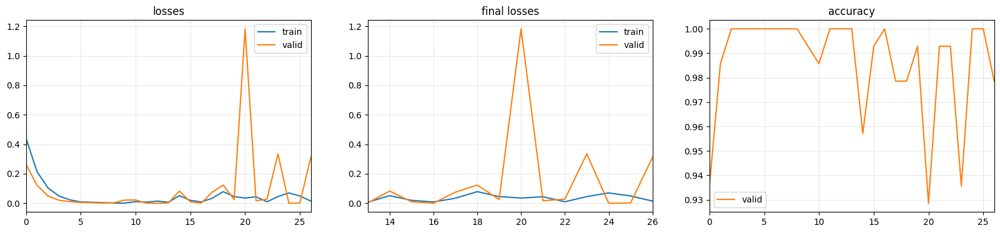

cuda


In [11]:
dls, X_train, X_test, y_test= data_preparation(X, y)
# Run the trainer function only if CUDA is available
if 'cuda' in str(device):
    print('Start training...')
    learn_new = trainer(TST, dls)
# else:
#     learn_new = load_learner_all(path=f'{base_dir}/export/',
#                                dls_fname='dls', model_fname='model', learner_fname='learner')
    # train_acc, valid_acc, test_acc, test_preds, valid_preds = validator(learn_new, X_test, y_test)
print(device)

Validation Accuracy :1.00
Test Accuracy :1.00
Train Accuracy :1.00


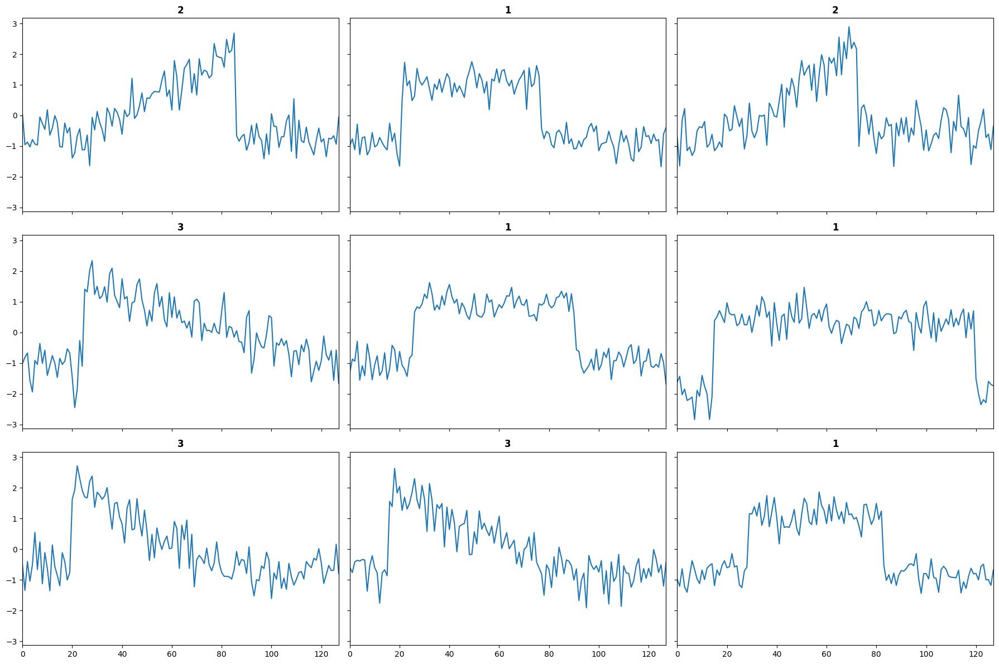

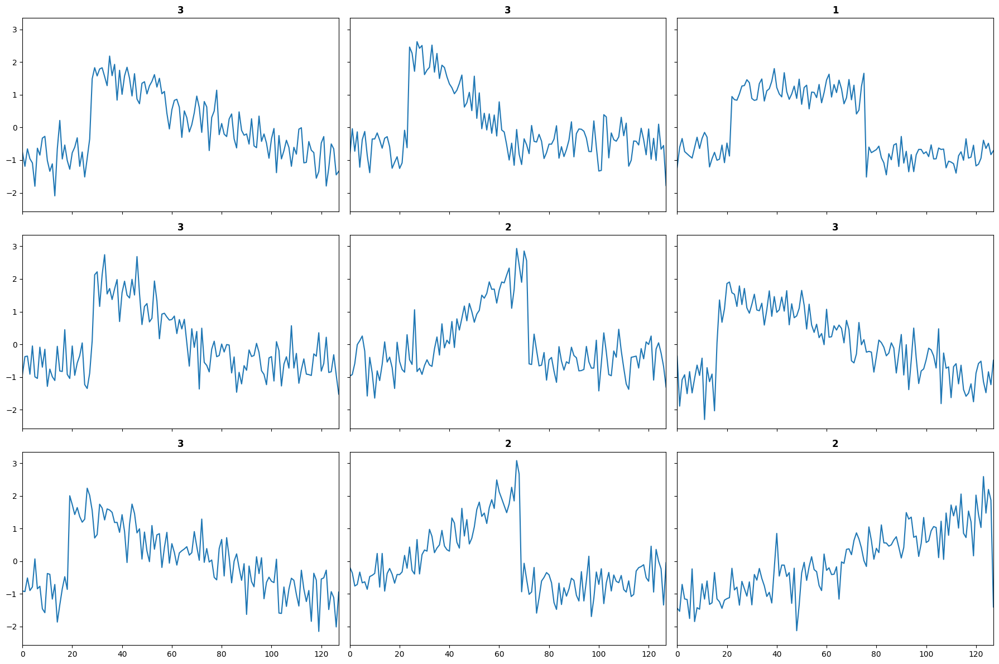

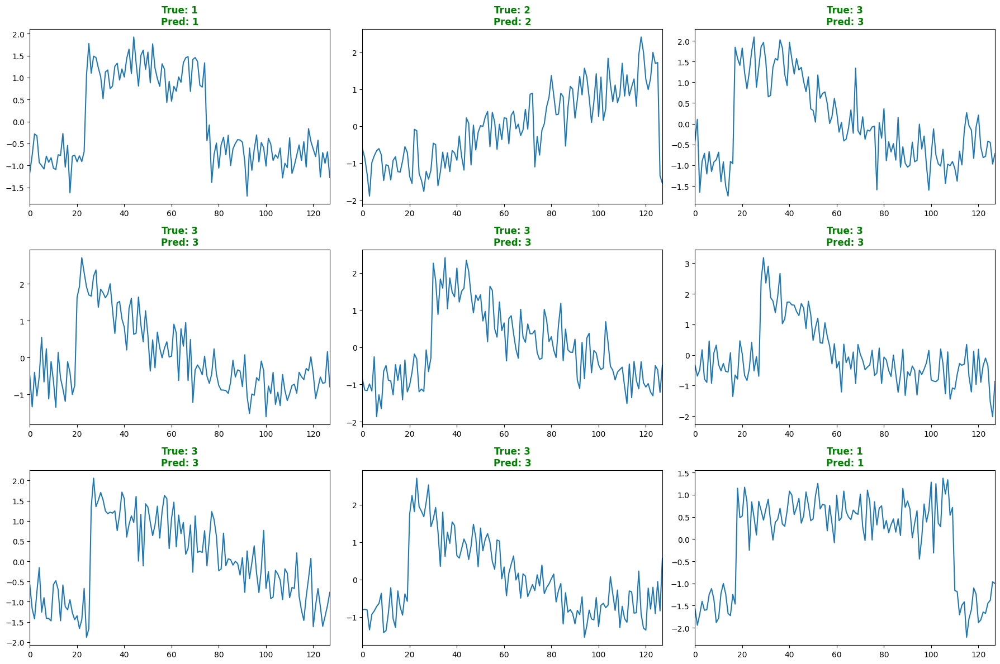

In [12]:
train_acc, valid_acc, test_acc, test_preds, valid_preds = validator(learn_new, X_test, y_test)

In [13]:
learn_new.summary()

not enough values to plot a chart


TST (Input shape: 8 x 1 x 128)
Layer (type)         Output Shape         Param #    Trainable 
                     8 x 128 x 128       
Linear                                    256        True      
Dropout                                                        
Linear                                    16384      True      
Linear                                    16384      True      
Linear                                    16384      True      
Linear                                    16384      True      
Dropout                                                        
Transpose                                                      
BatchNorm1d                               256        True      
Transpose                                                      
____________________________________________________________________________
                     8 x 128 x 256       
Linear                                    33024      True      
GELU                                    

In [14]:
class_labels = ['Cylinder','Bell','Funnel']

In [15]:
def predict_fn(data, learner):
    if len(data.shape) == 2:
        data = data.reshape(data.shape[0], 1, data.shape[1])
    data_dl = test_loader.test_dataloader(learner, data)
    data_probas, _, data_preds = learner.get_preds(dl=data_dl, with_decoded=True, save_preds=None)
    return data_probas, data_preds

### Apply LOMATCE (Local Model-Agnostic TimeSeries Classifers Explanation)
LOMATCE is a novel Explainable AI (XAI) method designed specifically for time series classifiers. It generates explanations that preserve the temporal characteristics of time series data.

INFO:lomatce.explainer:Starting time series local explanation
INFO:lomatce.explainer:Perturbed instances shap for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 15270 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 10931 samples)
Optimal number of clusters for Decreasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 36514 samples)
Optimal number of clusters for LocalMax_ch1: 3
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 37049 samples)
Optimal number of clusters for LocalMin_ch1: 3


INFO:lomatce.explainer:Final data shape: (1001, 44) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 44


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.89
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.96
INFO:lomatce.explainer:Model Type: Ridge


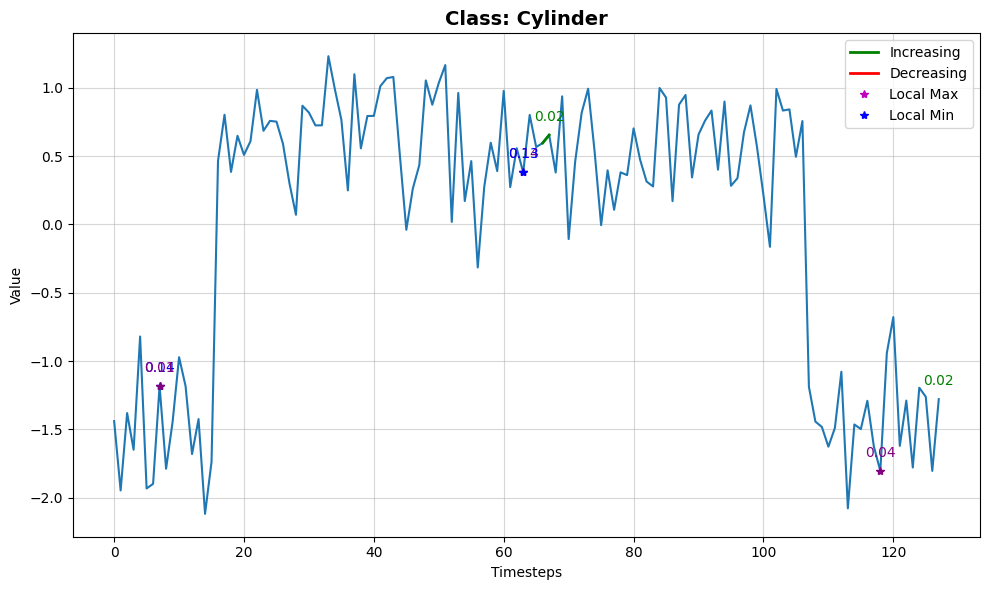

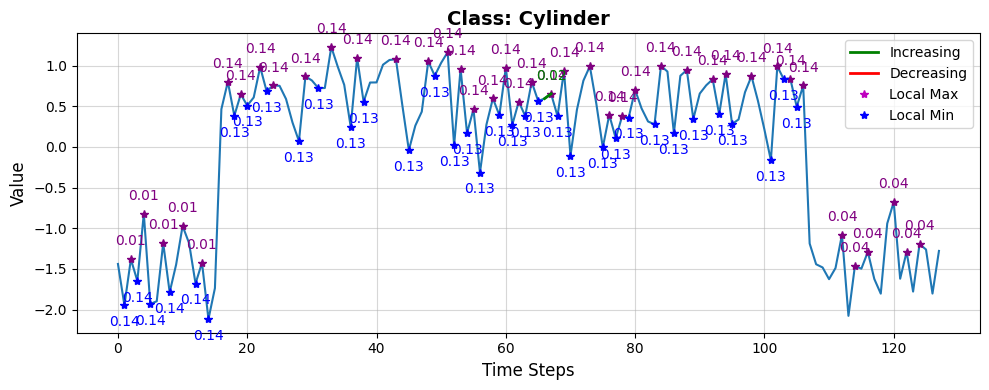

Predection probability : tensor([9.5048e-01, 6.1041e-04, 4.8908e-02])
Cylinder:                      0.9505
Bell:                      0.0006
Funnel:                      0.0489


In [16]:

origi_instance_0 = X_test[5] # Instance that is classified as Cylinder
explanation = lomatce_explainer.explain_instance(origi_instance_0, lambda data: predict_fn(data, learn_new), num_perturbations=1000, top_n=15, class_names=class_labels, replacement_method='zero')

INFO:lomatce.explainer:Starting time series local explanation
INFO:lomatce.explainer:Perturbed instances shap for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 16622 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 14323 samples)
Optimal number of clusters for Decreasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 37059 samples)
Optimal number of clusters for LocalMax_ch1: 18
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 37169 samples)
Optimal number of clusters for LocalMin_ch1: 19


INFO:lomatce.explainer:Final data shape: (1001, 75) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 75


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.97
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.97
INFO:lomatce.explainer:Model Type: Ridge


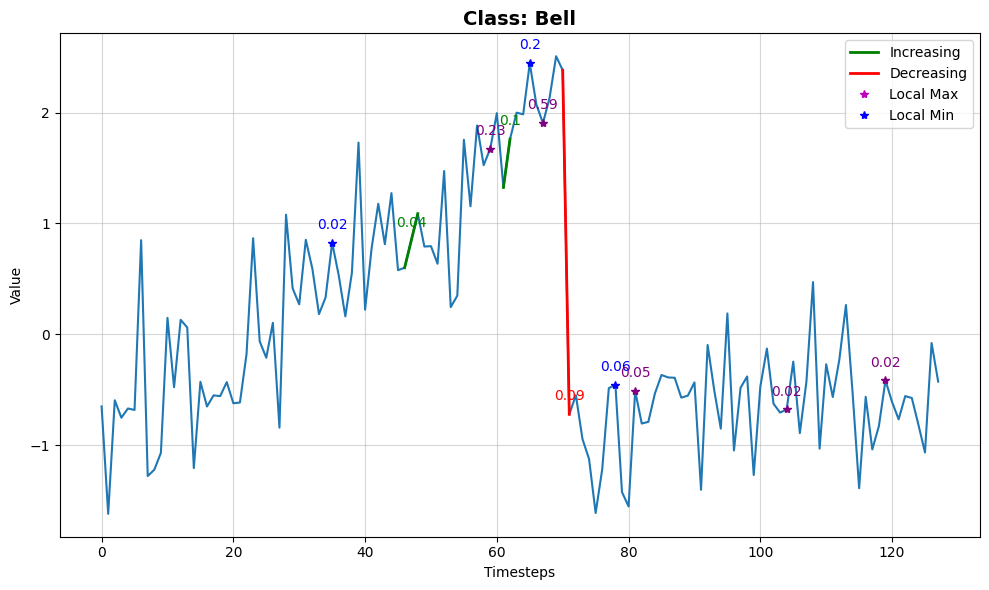

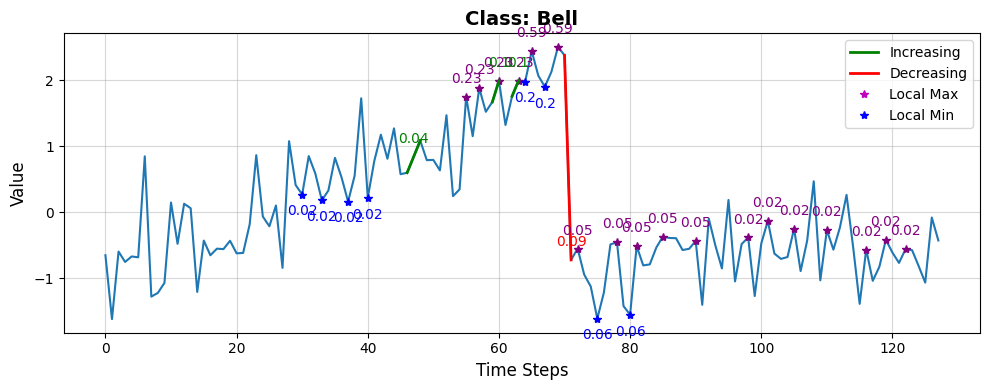

Predection probability : tensor([3.5277e-02, 9.6470e-01, 2.6242e-05])
Cylinder:                      0.0353
Bell:                      0.9647
Funnel:                      0.0000


In [17]:
origi_instance_0 = X_test[7] # Instance that is classified as Bell
explanation = lomatce_explainer.explain_instance(origi_instance_0, lambda data: predict_fn(data, learn_new), num_perturbations=1000, top_n=15, class_names=class_labels, replacement_method='zero')

In [33]:
print(y_test[:10])
test_preds[:10]

['1' '1' '1' '1' '3' '1' '2' '2' '3' '1']


tensor([0, 1, 0, 0, 2, 0, 1, 1, 2, 0])

INFO:lomatce.explainer:Starting time series local explanation
INFO:lomatce.explainer:Perturbed instances shap for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 12650 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 16981 samples)
Optimal number of clusters for Decreasing_ch1: 18
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 33415 samples)
Optimal number of clusters for LocalMax_ch1: 3
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 33476 samples)
Optimal number of clusters for LocalMin_ch1: 3


INFO:lomatce.explainer:Final data shape: (1001, 43) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 43


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.88
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.9
INFO:lomatce.explainer:Model Type: Ridge


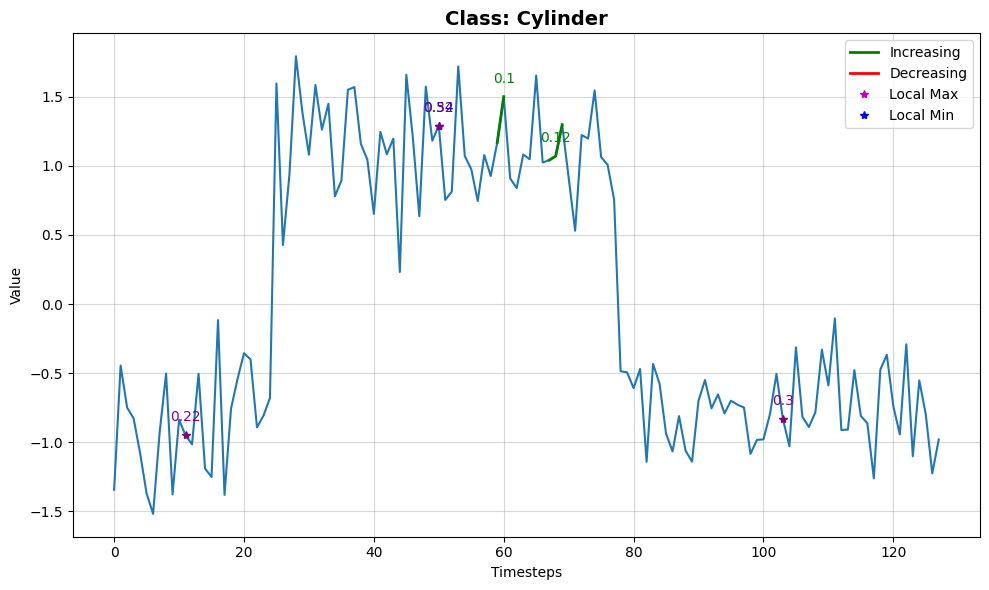

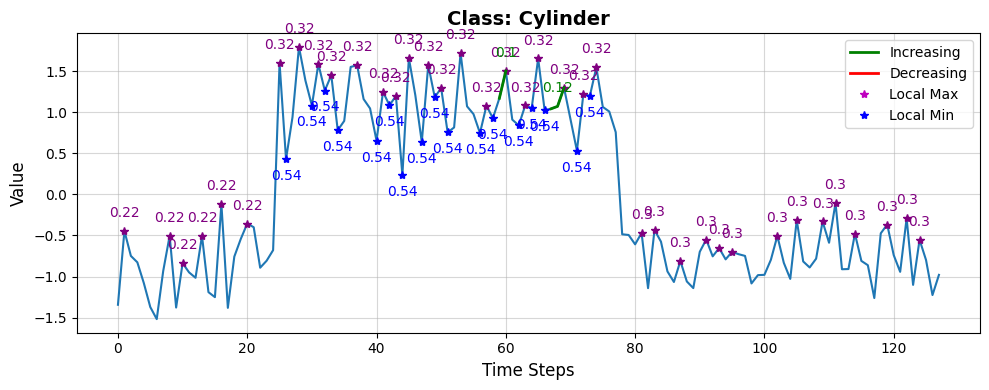

Predection probability : tensor([0.8695, 0.0114, 0.1191])
Cylinder:                      0.8695
Bell:                      0.0114
Funnel:                      0.1191


In [18]:
origi_instance_1 = X_test[3] # Instance that is classified as cylinder
explanation = lomatce_explainer.explain_instance(origi_instance_1, lambda data: predict_fn(data, learn_new), num_perturbations=1000, top_n=15, class_names=class_labels, replacement_method='zero')

INFO:lomatce.explainer:Starting time series local explanation
INFO:lomatce.explainer:Perturbed instances shap for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 16544 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 14325 samples)
Optimal number of clusters for Decreasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 36918 samples)
Optimal number of clusters for LocalMax_ch1: 18
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 36991 samples)
Optimal number of clusters for LocalMin_ch1: 19


INFO:lomatce.explainer:Final data shape: (1001, 75) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 75


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.96
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.97
INFO:lomatce.explainer:Model Type: Ridge


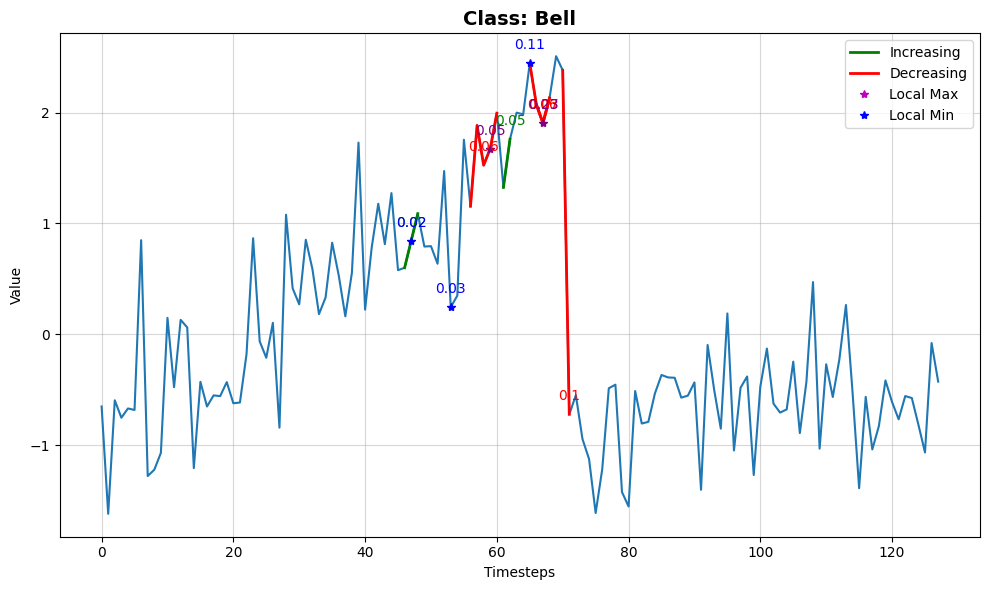

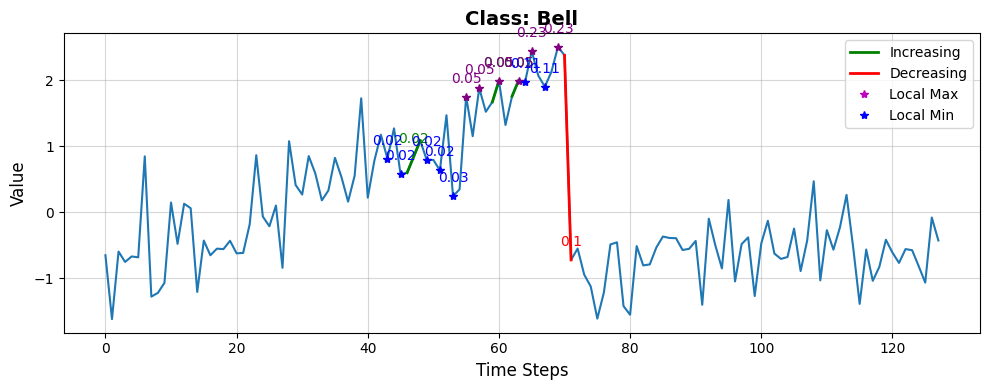

Predection probability : tensor([3.5277e-02, 9.6470e-01, 2.6242e-05])
Cylinder:                      0.0353
Bell:                      0.9647
Funnel:                      0.0000


In [18]:
origi_instance_2 = X_test[7] # Instance that is classified as bell
explanation = lomatce_explainer.explain_instance(origi_instance_2, lambda data: predict_fn(data, learn_new), num_perturbations=1000, top_n=15, class_names=class_labels, replacement_method='total_mean')

INFO:lomatce.explainer:Starting time series local explanation
INFO:lomatce.explainer:Perturbed instances shap for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 12574 samples)
Optimal number of clusters for Increasing_ch1: 16
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 19457 samples)
Optimal number of clusters for Decreasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 33726 samples)
Optimal number of clusters for LocalMax_ch1: 18
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 32660 samples)
Optimal number of clusters for LocalMin_ch1: 19


INFO:lomatce.explainer:Final data shape: (1001, 72) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 72


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.97
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.69
INFO:lomatce.explainer:Model Type: Ridge


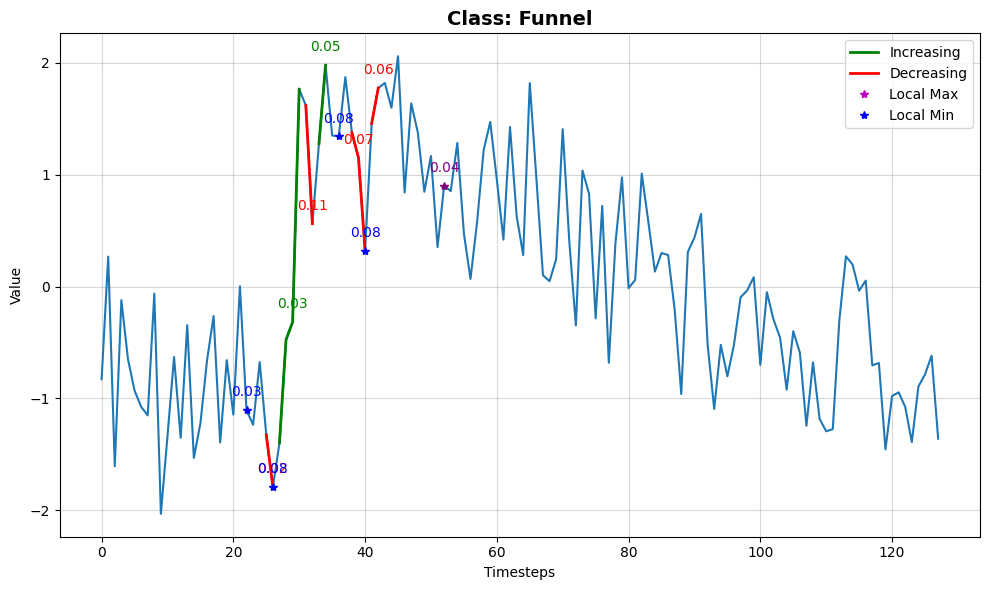

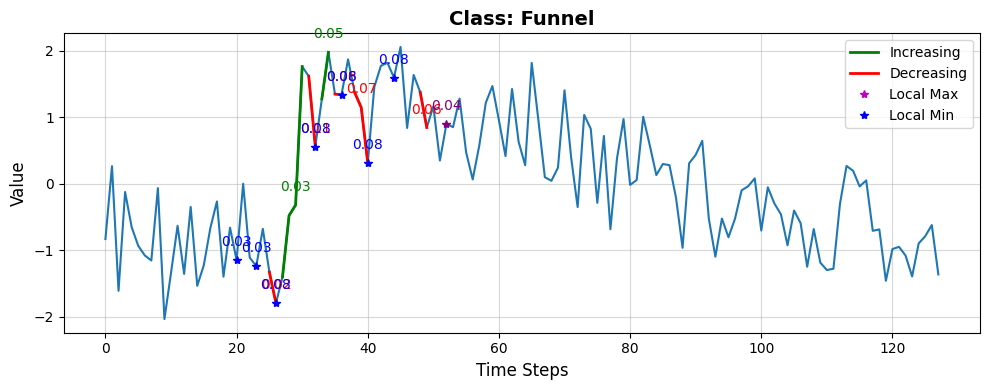

Predection probability : tensor([0.3043, 0.0034, 0.6923])
Cylinder:                      0.3043
Bell:                      0.0034
Funnel:                      0.6923


In [19]:
origi_instance_3 = X_test[4] # Instance that is classified as Funnel
explanation = lomatce_explainer.explain_instance(origi_instance_3, lambda data: predict_fn(data, learn_new), num_perturbations=1000, top_n=15, class_names=class_labels, replacement_method='zero')

INFO:lomatce.explainer:Starting time series local explanation
INFO:lomatce.explainer:Perturbed instances shap for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 16210 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 12606 samples)
Optimal number of clusters for Decreasing_ch1: 17
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 36212 samples)
Optimal number of clusters for LocalMax_ch1: 18
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 37157 samples)
Optimal number of clusters for LocalMin_ch1: 19


INFO:lomatce.explainer:Final data shape: (1001, 73) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 73


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.77
INFO:lomatce.explainer:Local Prediction (Linear Model): 1.0
INFO:lomatce.explainer:Model Type: Ridge


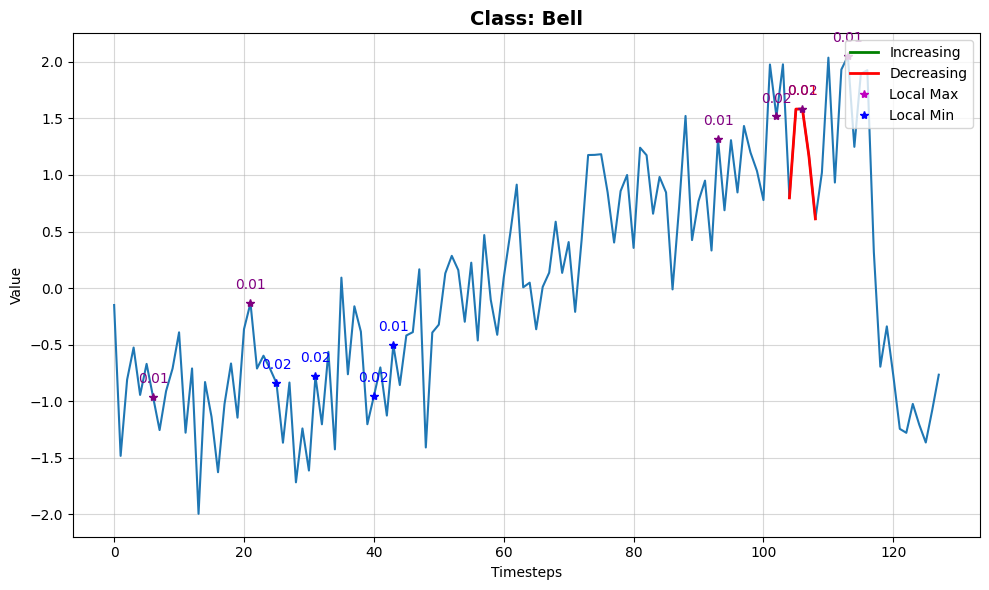

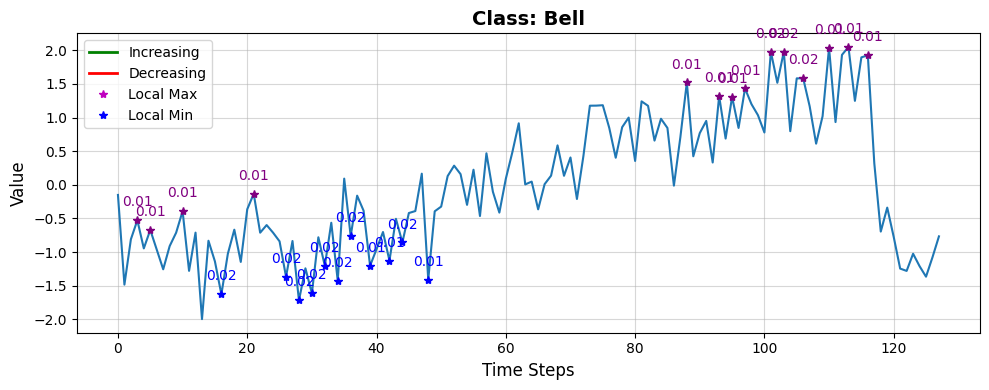

Predection probability : tensor([2.9756e-03, 9.9660e-01, 4.2389e-04])
Cylinder:                      0.0030
Bell:                      0.9966
Funnel:                      0.0004


In [20]:
origi_instance_2 = X_test[16] # Instance that is classified as bell
explanation = lomatce_explainer.explain_instance(origi_instance_2, lambda data: predict_fn(data, learn_new), num_perturbations=1000, top_n=15, class_names=class_labels, replacement_method='zero')

INFO:lomatce.explainer:Starting time series local explanation


Replacement methods: zero


INFO:lomatce.explainer:Perturbed instances shap for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5 cpu cores (5/20 of total cores)
Optimal number of clusters for Increasing_ch1: 19 = 19
Running on 5 cpu cores (5/20 of total cores)
Optimal number of clusters for Decreasing_ch1: 19 = 19
Running on 5 cpu cores (5/20 of total cores)
Optimal number of clusters for LocalMax_ch1: 19 = 19
Running on 5 cpu cores (5/20 of total cores)
Optimal number of clusters for LocalMin_ch1: 19 = 19


INFO:lomatce.explainer:Final data shape: (1001, 76) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 76


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.94
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.7
INFO:lomatce.explainer:Model Type: Ridge


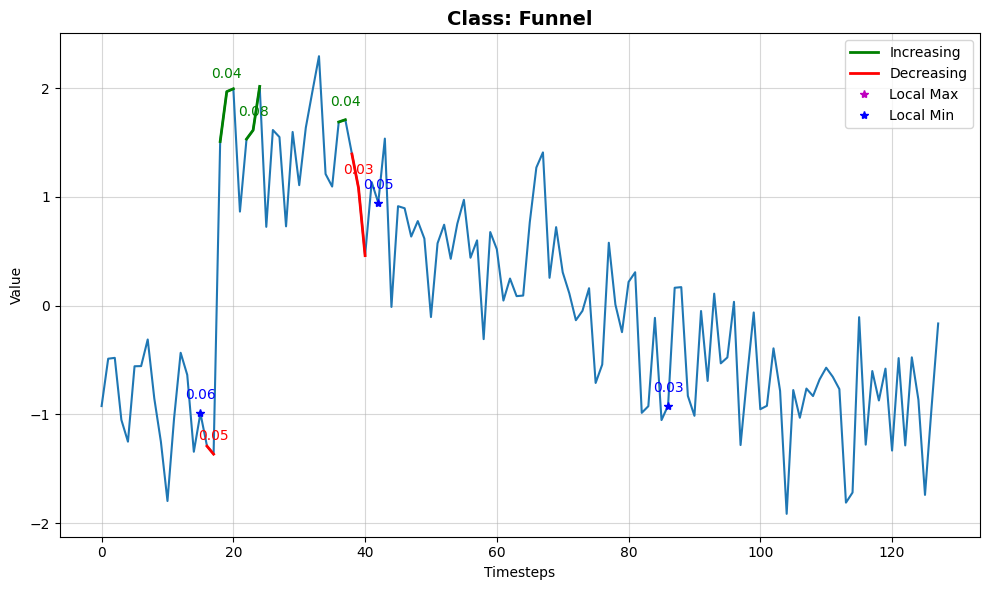

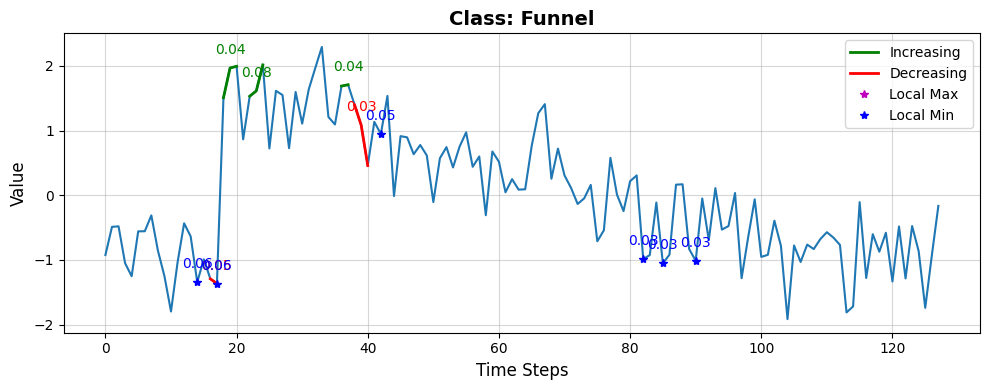

INFO:lomatce.explainer:Starting time series local explanation


Predection probability : tensor([0.1861, 0.1287, 0.6852])
Cylinder:                      0.1861
Bell:                      0.1287
Funnel:                      0.6852


INFO:lomatce.explainer:Perturbed instances shap for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5 cpu cores (5/20 of total cores)
Optimal number of clusters for Increasing_ch1: 19 = 19
Running on 5 cpu cores (5/20 of total cores)
Optimal number of clusters for Decreasing_ch1: 19 = 19
Running on 5 cpu cores (5/20 of total cores)
Optimal number of clusters for LocalMax_ch1: 19 = 19
Running on 5 cpu cores (5/20 of total cores)
Optimal number of clusters for LocalMin_ch1: 3 = 3


INFO:lomatce.explainer:Final data shape: (1001, 60) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 60


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.98
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.82
INFO:lomatce.explainer:Model Type: Ridge


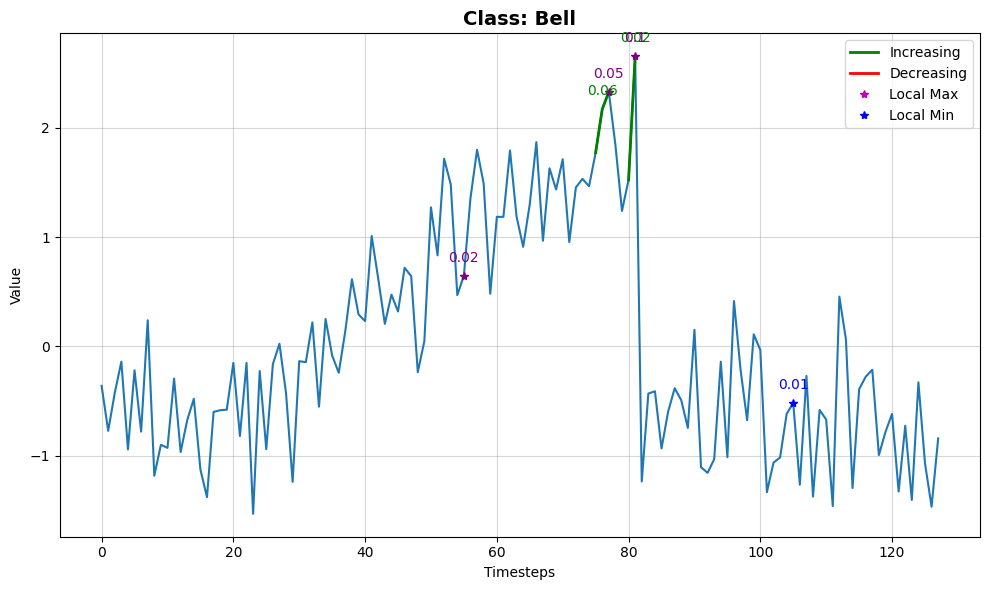

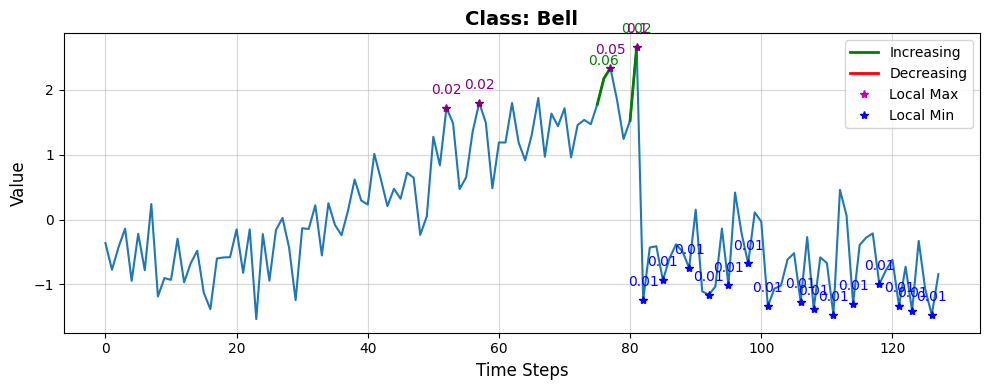

INFO:lomatce.explainer:Starting time series local explanation


Predection probability : tensor([0.0863, 0.8203, 0.0934])
Cylinder:                      0.0863
Bell:                      0.8203
Funnel:                      0.0934


INFO:lomatce.explainer:Perturbed instances shap for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5 cpu cores (5/20 of total cores)
Optimal number of clusters for Increasing_ch1: 19 = 19
Running on 5 cpu cores (5/20 of total cores)
Optimal number of clusters for Decreasing_ch1: 19 = 19
Running on 5 cpu cores (5/20 of total cores)
Optimal number of clusters for LocalMax_ch1: 3 = 3
Running on 5 cpu cores (5/20 of total cores)
Optimal number of clusters for LocalMin_ch1: 3 = 3


INFO:lomatce.explainer:Final data shape: (1001, 44) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 44


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.93
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.94
INFO:lomatce.explainer:Model Type: Ridge


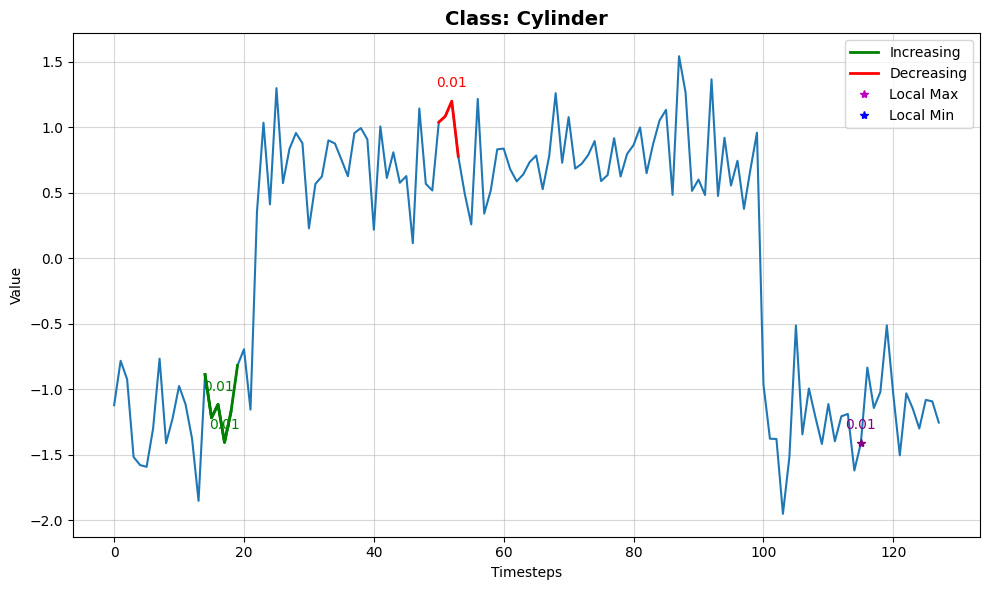

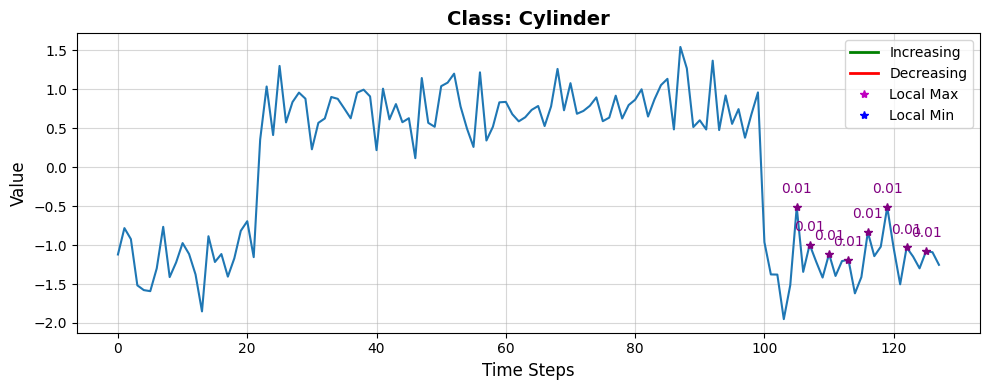

INFO:lomatce.explainer:Starting time series local explanation


Predection probability : tensor([0.9486, 0.0266, 0.0249])
Cylinder:                      0.9486
Bell:                      0.0266
Funnel:                      0.0249
Replacement methods: total_mean


INFO:lomatce.explainer:Perturbed instances shap for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5 cpu cores (5/20 of total cores)
Optimal number of clusters for Increasing_ch1: 19 = 19
Running on 5 cpu cores (5/20 of total cores)
Optimal number of clusters for Decreasing_ch1: 19 = 19
Running on 5 cpu cores (5/20 of total cores)
Optimal number of clusters for LocalMax_ch1: 18 = 18
Running on 5 cpu cores (5/20 of total cores)
Optimal number of clusters for LocalMin_ch1: 19 = 19


INFO:lomatce.explainer:Final data shape: (1001, 75) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 75


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.81
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.6
INFO:lomatce.explainer:Model Type: Ridge


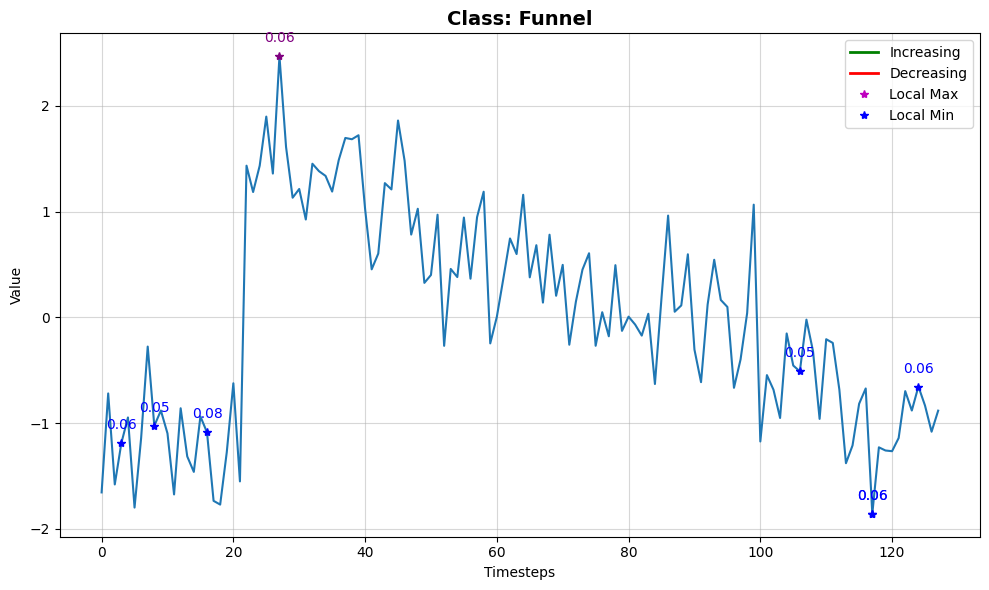

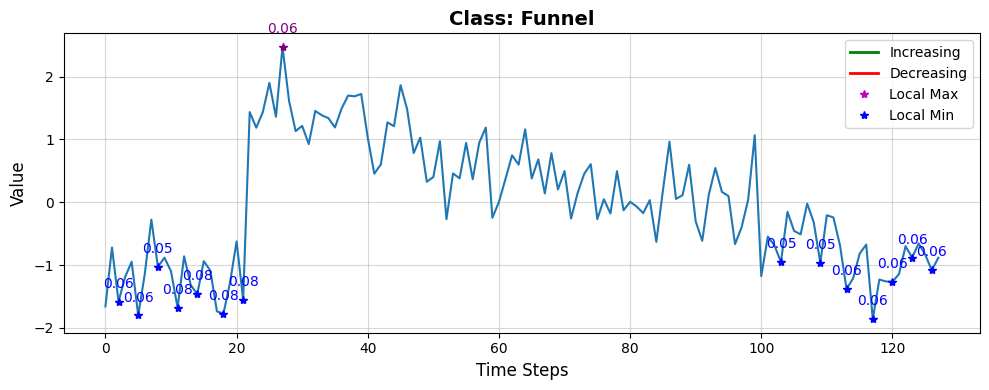

INFO:lomatce.explainer:Starting time series local explanation


Predection probability : tensor([0.2557, 0.1265, 0.6178])
Cylinder:                      0.2557
Bell:                      0.1265
Funnel:                      0.6178


INFO:lomatce.explainer:Perturbed instances shap for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5 cpu cores (5/20 of total cores)
Optimal number of clusters for Increasing_ch1: 19 = 19
Running on 5 cpu cores (5/20 of total cores)
Optimal number of clusters for Decreasing_ch1: 19 = 19
Running on 5 cpu cores (5/20 of total cores)
Optimal number of clusters for LocalMax_ch1: 19 = 19
Running on 5 cpu cores (5/20 of total cores)
Optimal number of clusters for LocalMin_ch1: 19 = 19


INFO:lomatce.explainer:Final data shape: (1001, 76) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 76


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.98
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.86
INFO:lomatce.explainer:Model Type: Ridge


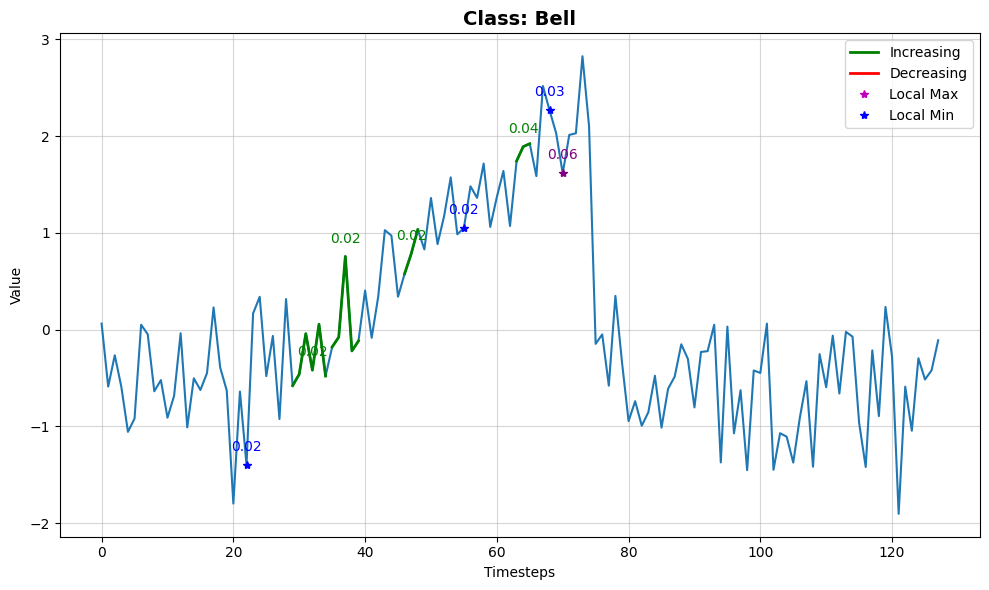

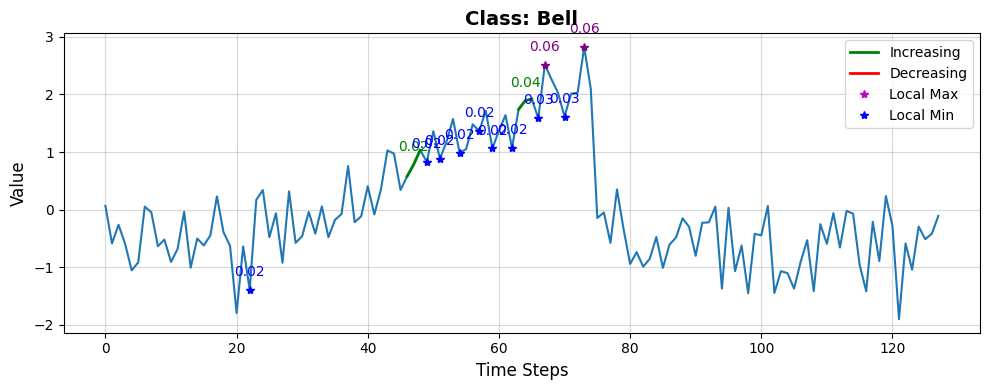

INFO:lomatce.explainer:Starting time series local explanation


Predection probability : tensor([0.0807, 0.8538, 0.0655])
Cylinder:                      0.0807
Bell:                      0.8538
Funnel:                      0.0655


INFO:lomatce.explainer:Perturbed instances shap for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5 cpu cores (5/20 of total cores)
Optimal number of clusters for Increasing_ch1: 19 = 19
Running on 5 cpu cores (5/20 of total cores)
Optimal number of clusters for Decreasing_ch1: 19 = 19
Running on 5 cpu cores (5/20 of total cores)
Optimal number of clusters for LocalMax_ch1: 19 = 19
Running on 5 cpu cores (5/20 of total cores)
Optimal number of clusters for LocalMin_ch1: 19 = 19


INFO:lomatce.explainer:Final data shape: (1001, 76) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 76


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.84
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.6
INFO:lomatce.explainer:Model Type: Ridge


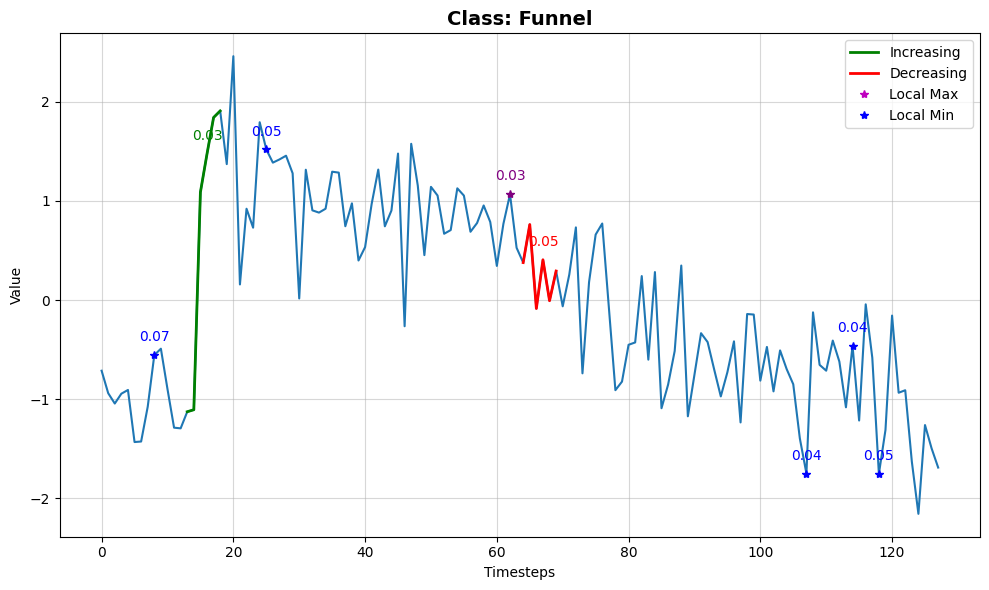

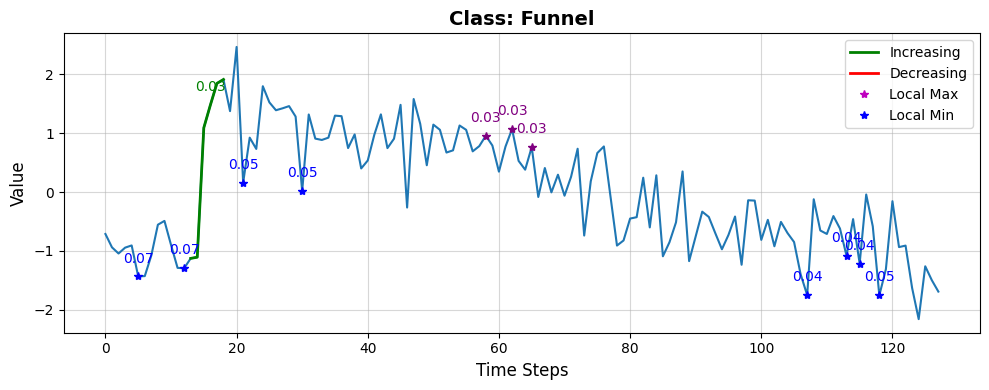

Predection probability : tensor([0.2884, 0.1175, 0.5941])
Cylinder:                      0.2884
Bell:                      0.1175
Funnel:                      0.5941


In [22]:
# Define the replacement methods
replacement_methods = ['zero', 'total_mean']

# Initialize a dictionary to store the results
results = {}

# Iterate over the replacement methods
for method in replacement_methods:
    # Initialize a list to store prediction scores for the current method
    print(f'Replacement methods: {method}')
    prediction_scores = []
    
    # Run the function 100 times for the current method
    for _ in range(3):
        # Randomly select an instance
        origi_instance = X_test[np.random.randint(len(X_test))]

        # Call the ts_local_explanation function with the current replacement method
        explanation = lomatce_explainer.explain_instance(origi_instance, lambda data : predict_fn(data, learn_new), num_perturbations=1000, class_names=class_labels, replacement_method=method)
        
        # Append the prediction score to the list
        # prediction_scores.append(prediction_score)
    
    # Compute the mean and standard deviation of the prediction scores for the current method
#     mean_prediction_score = np.mean(prediction_scores)
#     std_prediction_score = np.std(prediction_scores)
    
#     # Store the results in the dictionary
#     results[method] = (mean_prediction_score, std_prediction_score)

# # Print the results in tabular format
# print("Replacement Method\tAverage Prediction Score\tStandard Deviation")
# for method, (mean_score, std_score) in results.items():
#     print(f"{method}\t\t\t{mean_score:.2f}  \u00B1 {std_score:.2f}")


### Integrated Gradient

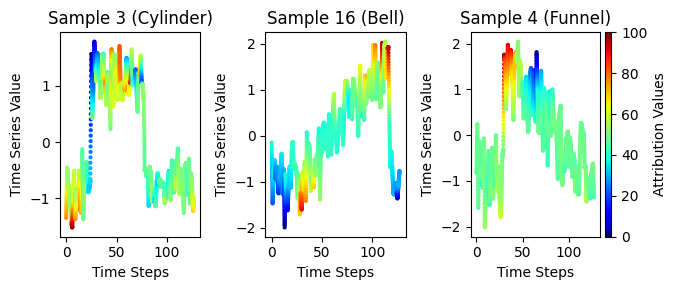

In [17]:
import torch
import numpy as np
from torch import tensor
from scipy.interpolate import interp1d
import matplotlib.pyplot as plt
from captum.attr import IntegratedGradients
from mpl_toolkits.axes_grid1 import make_axes_locatable

# Define a function to compute Integrated Gradients
def compute_integrated_gradients(x, target):
    integrated_gradients = IntegratedGradients(learn_new.model.cpu())
    attr, delta = integrated_gradients.attribute(x, target=target, return_convergence_delta=True)
    return attr.squeeze().cpu().numpy()

# Function to plot Integrated Gradients
def plot_integrated_gradients(x_sample, target, ax):
    # Compute Integrated Gradients for the sample
    attributions = compute_integrated_gradients(x_sample, target)

    max_length = 3000  # Adjust as needed

    time_steps = torch.arange(len(x_sample.reshape(-1,1)))  # Generate time step indices
    minimum = np.min(attributions)

    attributions = attributions - minimum
    attributions = attributions / max(attributions)
    attributions = attributions * 100

    x = np.linspace(0, x_sample.shape[2] - 1, max_length, endpoint=True)

    # Interpolate the time series values
    f_ts = interp1d(range(x_sample.shape[2]), x_sample[0, 0, :])
    y_ts = f_ts(x)

    # Interpolate the attribution values
    f_cas = interp1d(range(len(attributions)), attributions)
    cas_interpolated = f_cas(x).astype(int)

    # Plot the interpolated attribution values against the interpolated time series
    scatter = ax.scatter(x=x, y=y_ts, c=cas_interpolated, cmap='jet', marker='.', vmin=0, vmax=100, linewidths=0.0)
    return scatter

# Select two samples from the test set for visualization
sample_indices = [3, 16, 4]
targets = [0, 1, 2]  # Specify the target for each sample
x_samples = [tensor(X_test[sample_idx][None]) for sample_idx in sample_indices]

# Create subplots side by side
fig, axs = plt.subplots(1, 3, figsize=(7, 3))
labels = class_labels

# Plot Integrated Gradients for each sample
for i, (x_sample, target, ax) in enumerate(zip(x_samples, targets, axs)):
    scatter = plot_integrated_gradients(x_sample, target, ax)
    ax.set_title(f'Sample {sample_indices[i]} ({labels[target]})')
    ax.set_xlabel('Time Steps')
    ax.set_ylabel('Time Series Value')

# Create a new axis on the right side of the last subplot for the color bar
divider = make_axes_locatable(axs[-1])
cax = divider.append_axes("right", size="5%", pad=0.05)
cbar = fig.colorbar(scatter, cax=cax)
cbar.set_label('Attribution Values')

plt.tight_layout()
plt.show()


### LIME


🔍 Explaining instance 0 — Predicted class: Cylinder


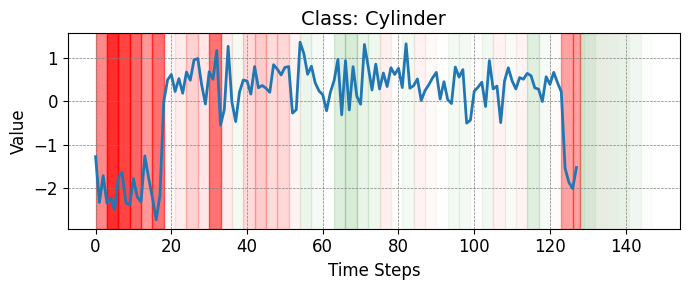


🔍 Explaining instance 1 — Predicted class: Cylinder


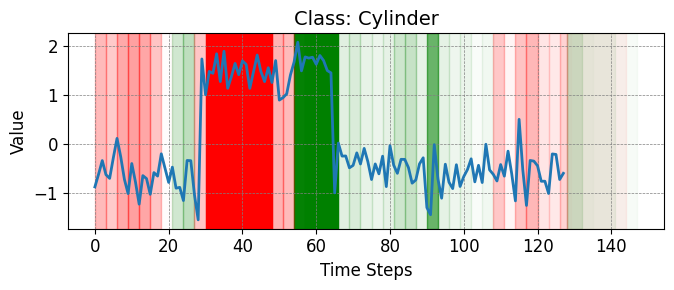


🔍 Explaining instance 2 — Predicted class: Cylinder


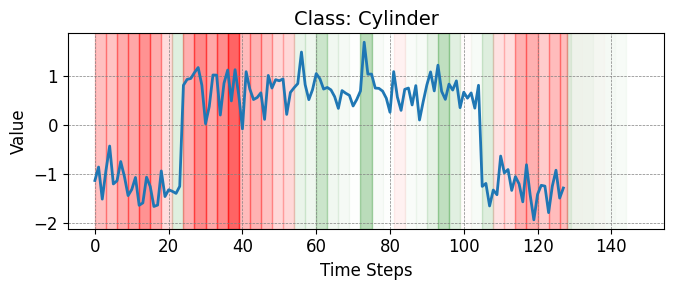


🔍 Explaining instance 3 — Predicted class: Cylinder


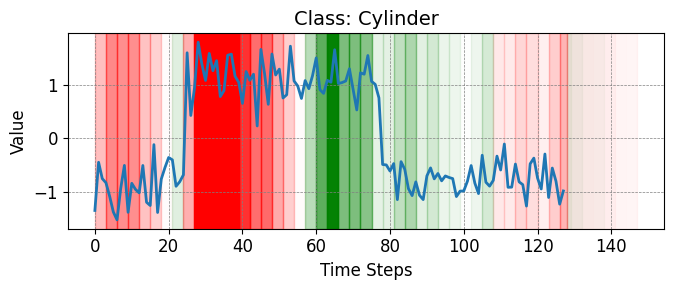


🔍 Explaining instance 4 — Predicted class: Funnel


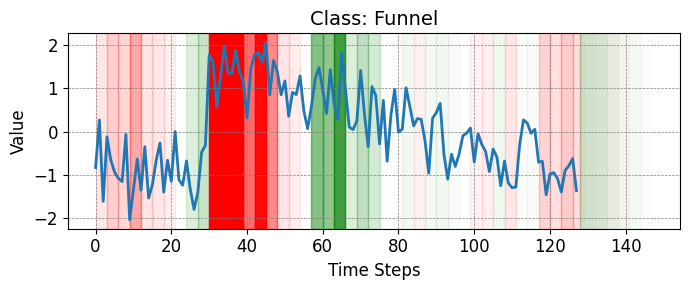

In [18]:
import numpy as np
import matplotlib.pyplot as plt
import math
from lomatce.lime_timeseries import LimeTimeSeriesExplainer
import logging
logging.getLogger().setLevel(logging.WARNING) 

# Predict function that LIME will use
def predict_fn(data):
    if len(data.shape) == 2:
        data = data.reshape(data.shape[0], 1, data.shape[1])  # Handle univariate case
    data_dl = test_loader.test_dataloader(learn_new, data)
    data_probas, _, _ = learn_new.get_preds(dl=data_dl, with_decoded=True, save_preds=None)
    return data_probas.numpy()

# Compute LIME and visualize importance
def compute_lime_importances(flat_series, predict_fn, num_slices=25, num_features=10, num_samples=5000, class_label=None, class_names=None):
    if num_slices is None:
        num_slices = len(flat_series)
    explainer = LimeTimeSeriesExplainer(class_names=class_names)

    exp = explainer.explain_instance(
        flat_series,
        predict_fn,
        num_features=num_features,
        num_samples=num_samples,
        num_slices=num_slices,
        replacement_method='total_mean'
    )

    values_per_slice = math.ceil(len(flat_series) / num_slices)
    segments_weights = exp.as_list()
    sorted_segments = sorted(segments_weights, key=lambda x: x[1], reverse=True)

    # Plot
    plt.figure(figsize=(7, 3))
    plt.plot(flat_series, color='C0', linewidth=2)

    for feature, weight in sorted_segments:
        start = feature * values_per_slice
        end = min(start + values_per_slice, len(flat_series))
        color = 'red' if weight < 0 else 'green'
        alpha = min(abs(weight) * 20, 1.0)
        plt.axvspan(start, end, color=color, alpha=alpha, edgecolor='none')

    plt.title(f'Class: {class_label}', fontsize=14)
    plt.xlabel('Time Steps', fontsize=12)
    plt.ylabel('Value', fontsize=12)
    plt.grid(True, linestyle='--', linewidth=0.5, color='gray')
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)
    plt.gca().xaxis.set_major_locator(plt.MaxNLocator(integer=True))
    plt.tight_layout()
    plt.show()

    return sorted_segments

# 🔁 Explain multiple instances
num_instances_to_explain = 5  # Change to 6 or more if desired
for idx in range(num_instances_to_explain):
    label_index = int(test_preds[idx])  # Convert '0' or '1' string to int
    class_label = class_labels[label_index]

    instance = X_test[idx]  # Shape: (channels, time)
    flat_series = instance.flatten() if instance.ndim == 2 else instance  # Flatten if 2D

    print(f"\n🔍 Explaining instance {idx} — Predicted class: {class_label}")
    compute_lime_importances(
        flat_series,
        predict_fn,
        num_slices=50,
        num_features=50,
        num_samples=5000,
        class_label=class_label,
        class_names=class_labels
    )


### SHAP


🔍 Explaining instance 0 — Predicted class: Cylinder


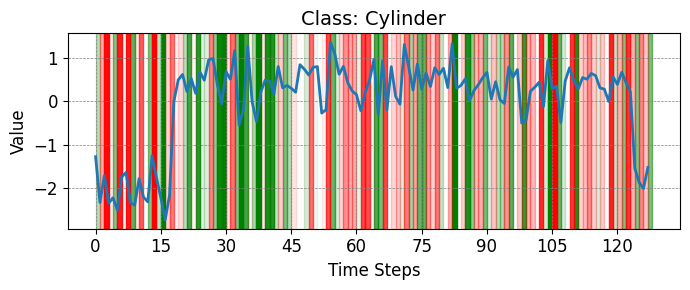


🔍 Explaining instance 1 — Predicted class: Cylinder


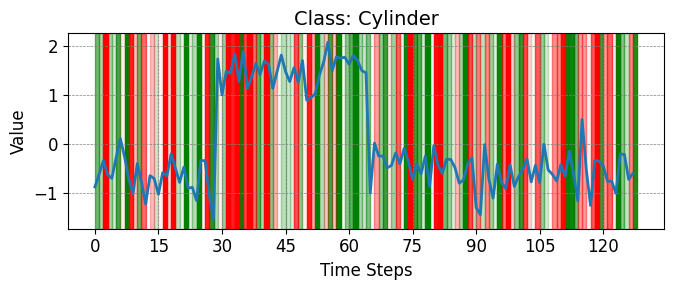


🔍 Explaining instance 2 — Predicted class: Cylinder


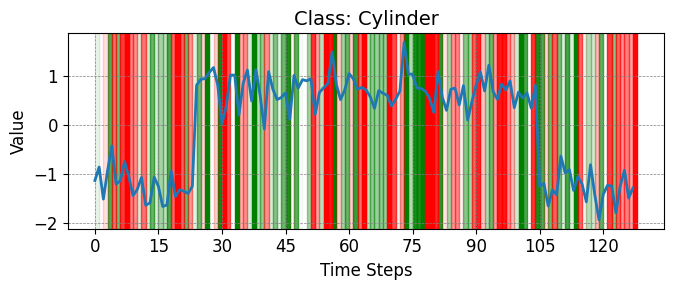

In [19]:
import shap
import numpy as np
import matplotlib.pyplot as plt
import math

# --- 1. Segmenting Function ---
def create_segments(X, num_segments=None):
    num_samples, num_channels, sequence_length = X.shape
    if num_segments is None:
        num_segments = sequence_length
    segment_length = sequence_length // num_segments
    return num_segments, segment_length

# --- 2. Predict Function for SHAP ---
def predict_fn(masks, instance, background_data, num_segments, segment_length, learner):
    masked_inputs = []
    for mask in masks:
        masked_instance = instance.copy()
        for seg_idx in range(num_segments):
            start = seg_idx * segment_length
            end = (seg_idx + 1) * segment_length
            if mask[seg_idx] == 0:
                random_idx = np.random.randint(0, background_data.shape[0])
                background_segment = background_data[random_idx, :, start:end]
                masked_instance[0, :, start:end] = background_segment
        masked_inputs.append(masked_instance[0])
    masked_inputs = np.stack(masked_inputs)  # (num_masks, channels, time)
    data_dl = test_loader.test_dataloader(learner, masked_inputs)
    data_probas, _, _ = learner.get_preds(dl=data_dl, with_decoded=True, save_preds=None)
    return data_probas.numpy()

# --- 3. Plotting SHAP Segment Importance ---
def plot_segment_importance(flat_series, shap_values, segment_length, class_name):
    num_segments = len(shap_values)
    flat_series = flat_series.flatten() if len(flat_series.shape) == 2 else flat_series
    values_per_slice = math.ceil(len(flat_series) / segment_length)
    sorted_segments = sorted(enumerate(shap_values), key=lambda x: x[1], reverse=True)

    plt.figure(figsize=(7, 3))
    plt.plot(flat_series, color='C0', linewidth=2)
    
    for segment_idx, weight in sorted_segments:
        start = segment_idx * values_per_slice
        end = min(start + values_per_slice, len(flat_series))
        color = 'red' if weight < 0 else 'green'
        alpha = min(abs(weight) * 10, 1.0)
        plt.axvspan(start, end, color=color, alpha=alpha, edgecolor='none')

    plt.title(f'Class: {class_name}', fontsize=14)
    plt.xlabel('Time Steps', fontsize=12)
    plt.ylabel('Value', fontsize=12)
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)
    plt.grid(True, which='both', linestyle='--', linewidth=0.5, color='gray')
    plt.gca().xaxis.set_major_locator(plt.MaxNLocator(integer=True))
    plt.tight_layout()
    plt.show()

# --- 4. SHAP Explanation for Multiple Instances ---
# Set number of segments
num_segments, segment_length = create_segments(X_train, num_segments=None)

# Sample background for masking
background_data = X_train[np.random.choice(len(X_train), min(100, len(X_train)), replace=False)]

# Loop over multiple test instances
num_instances_to_explain = 3

for idx in range(num_instances_to_explain):
    instance_to_explain = X_test[idx:idx+1]  # Shape: (1, C, T)
    label_index = int(test_preds[idx])
    class_name = class_labels[label_index]
    print(f"\n🔍 Explaining instance {idx} — Predicted class: {class_name}")
    # SHAP explainer setup
    predict_fn_shap = lambda masks: predict_fn(
        masks,
        instance=instance_to_explain,
        background_data=background_data,
        num_segments=num_segments,
        segment_length=segment_length,
        learner=learn_new
    )

    explainer = shap.Explainer(predict_fn_shap, np.zeros((1, num_segments)))
    shap_values = explainer.shap_values(np.ones((1, num_segments)))
    
    # Extract SHAP values for the predicted class
    if isinstance(shap_values, list):
        shap_value = shap_values[label_index][0]
    else:
        shap_value = shap_values[0, :, label_index]

    shap_values_flat = np.array(shap_value).flatten()
    sorted_indices = np.argsort(-np.abs(shap_values_flat))
    sorted_shap_values = shap_values_flat[sorted_indices]
    important_time_steps = sorted_indices

    # Plot the explanation
    flat_series = instance_to_explain.reshape(1, instance_to_explain.shape[2])
    plot_segment_importance(flat_series, shap_values_flat, num_segments, class_name)


### SP-LOMATCE

In [21]:
from lomatce.sp_lomatce import SPLOMATCE

In [22]:
def predict_fn(data, learner):
    if len(data.shape) == 2:
        data = data.reshape(data.shape[0], 1, data.shape[1])
    data_dl = test_loader.test_dataloader(learner, data)
    data_probas, _, data_preds = learner.get_preds(dl=data_dl, with_decoded=True, save_preds=None)
    return data_probas, data_preds

In [23]:
# Initialize SP-LOMATCE
splomatce_explainer = SPLOMATCE(class_labels=class_labels, dataset_name=dataset_name.upper(), lomatce_explainer=lomatce_explainer, predict_fn=lambda data: predict_fn(data, learn_new), output_dir= base_dir)


INFO:lomatce.explainer:Starting time series local explanation



=== Running SP-LOMATCE for class Cylinder ===


INFO:lomatce.explainer:Perturbed instances shap for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 16048 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 17607 samples)
Optimal number of clusters for Decreasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 34443 samples)
Optimal number of clusters for LocalMax_ch1: 3
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 35155 samples)
Optimal number of clusters for LocalMin_ch1: 3


INFO:lomatce.explainer:Final data shape: (1001, 44) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 44


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.85
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.98
INFO:lomatce.explainer:Model Type: Ridge


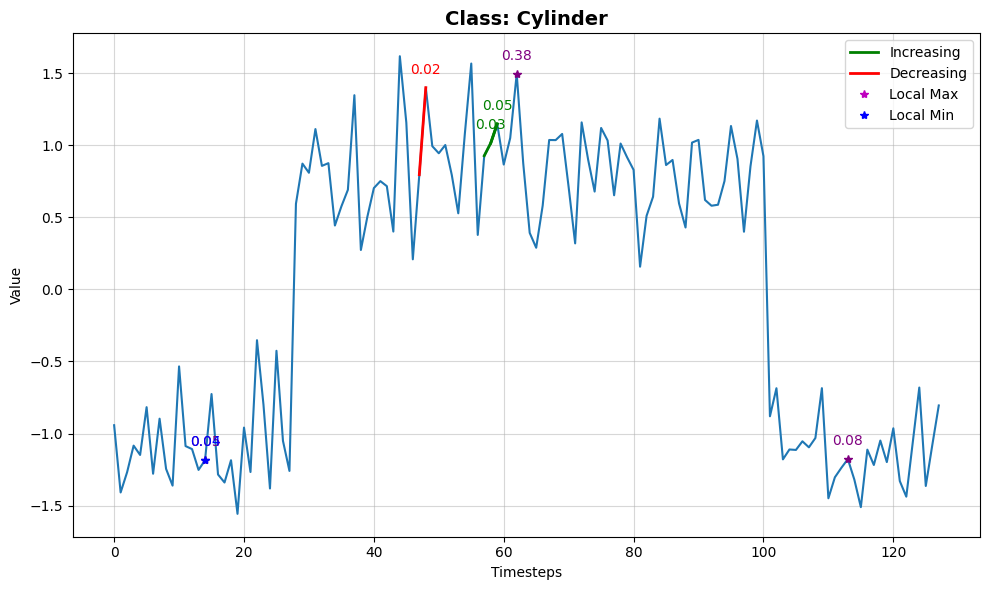

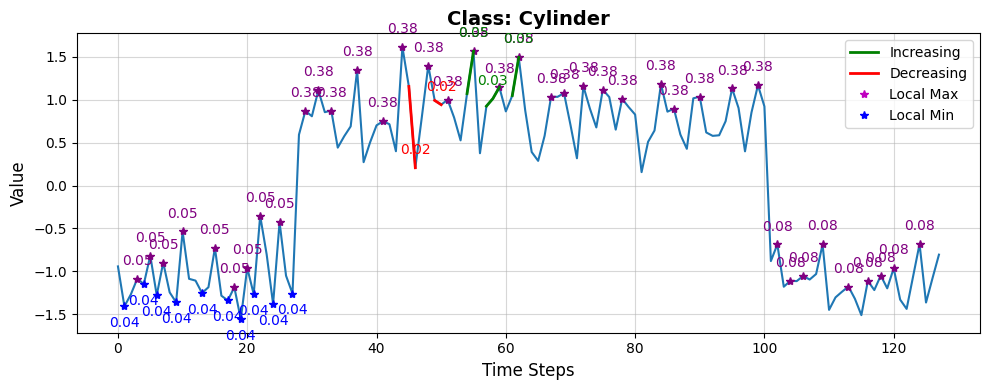

INFO:lomatce.explainer:Starting time series local explanation


Predection probability : tensor([0.9707, 0.0117, 0.0175])
Cylinder:                      0.9707
Bell:                      0.0117
Funnel:                      0.0175


INFO:lomatce.explainer:Perturbed instances shap for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 17644 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 12701 samples)
Optimal number of clusters for Decreasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 34465 samples)
Optimal number of clusters for LocalMax_ch1: 3
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 33168 samples)
Optimal number of clusters for LocalMin_ch1: 19


INFO:lomatce.explainer:Final data shape: (1001, 60) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 60


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.88
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.99
INFO:lomatce.explainer:Model Type: Ridge


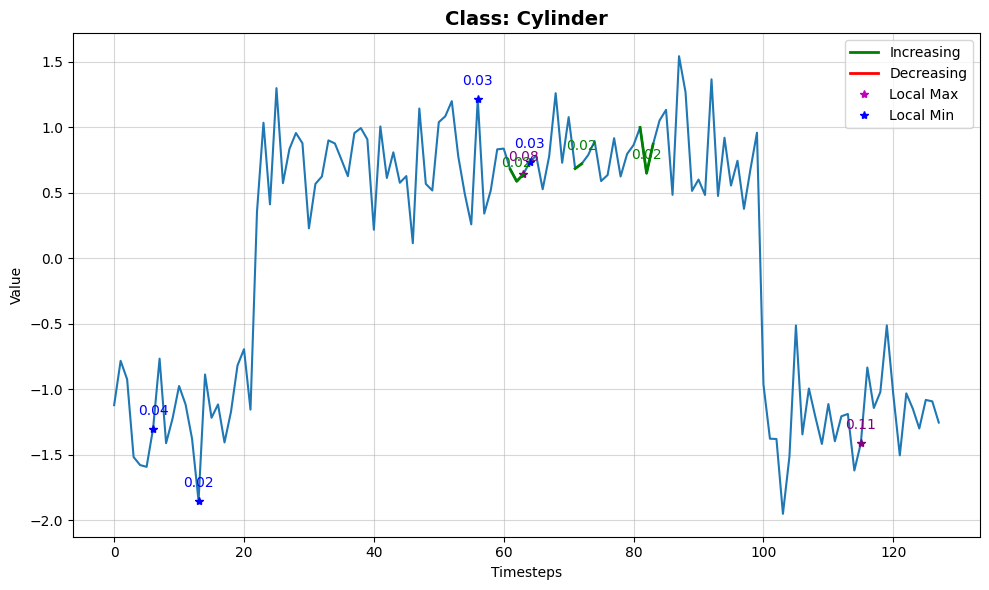

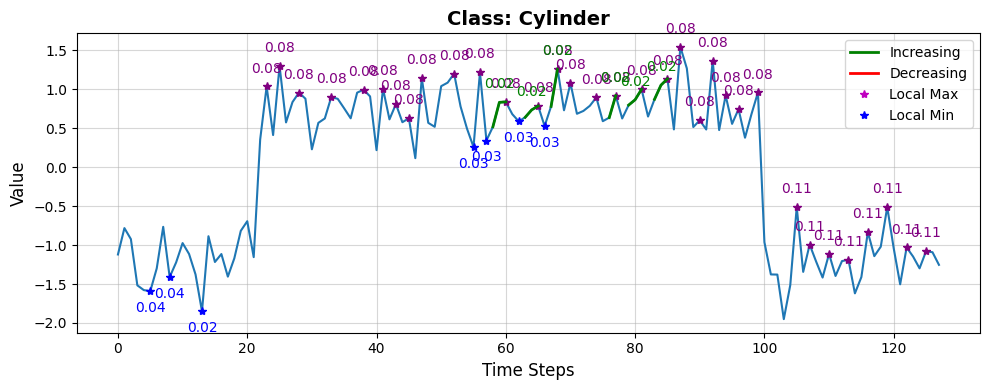

INFO:lomatce.explainer:Starting time series local explanation


Predection probability : tensor([0.9759, 0.0037, 0.0204])
Cylinder:                      0.9759
Bell:                      0.0037
Funnel:                      0.0204


INFO:lomatce.explainer:Perturbed instances shap for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 15394 samples)
Optimal number of clusters for Increasing_ch1: 18
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 14991 samples)
Optimal number of clusters for Decreasing_ch1: 17
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 35375 samples)
Optimal number of clusters for LocalMax_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 35037 samples)
Optimal number of clusters for LocalMin_ch1: 3


INFO:lomatce.explainer:Final data shape: (1001, 57) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 57


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.9
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.98
INFO:lomatce.explainer:Model Type: Ridge


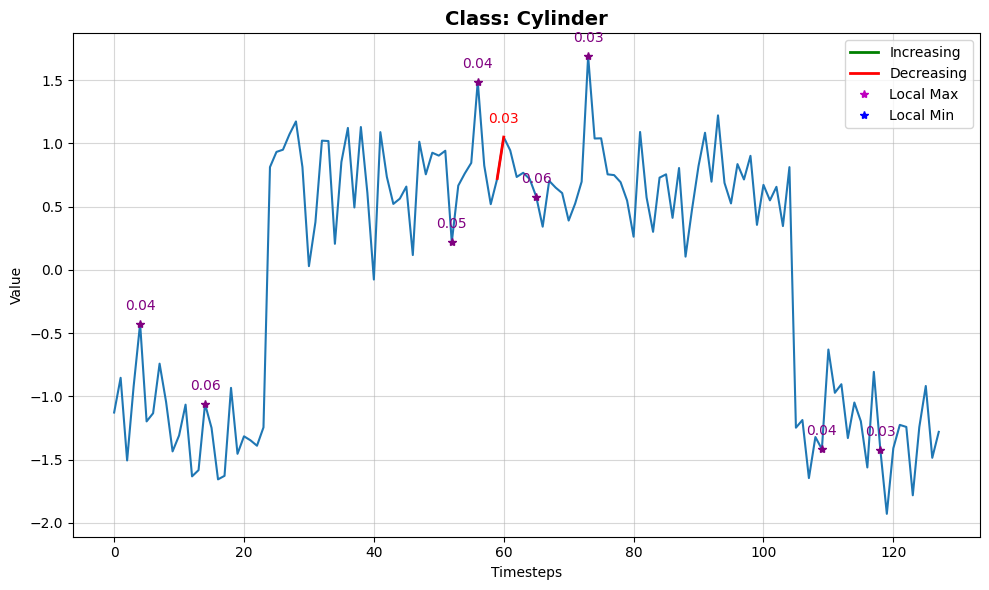

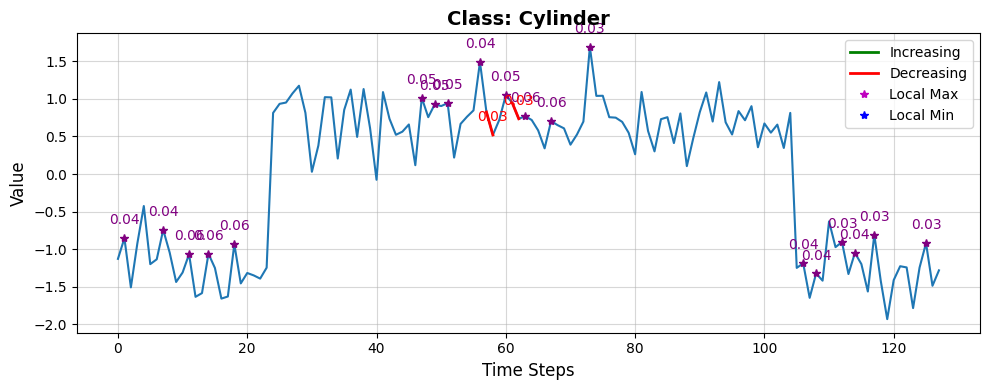

INFO:lomatce.explainer:Starting time series local explanation


Predection probability : tensor([0.9671, 0.0035, 0.0294])
Cylinder:                      0.9671
Bell:                      0.0035
Funnel:                      0.0294


INFO:lomatce.explainer:Perturbed instances shap for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 14296 samples)
Optimal number of clusters for Increasing_ch1: 18
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 14064 samples)
Optimal number of clusters for Decreasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 39743 samples)
Optimal number of clusters for LocalMax_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 40257 samples)
Optimal number of clusters for LocalMin_ch1: 18


INFO:lomatce.explainer:Final data shape: (1001, 74) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 74


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.91
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.96
INFO:lomatce.explainer:Model Type: Ridge


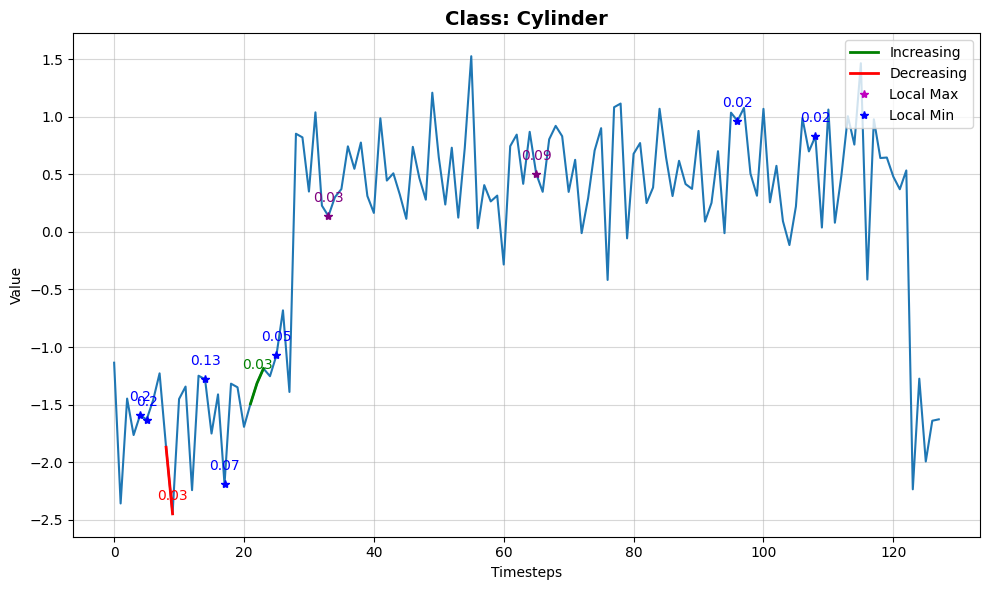

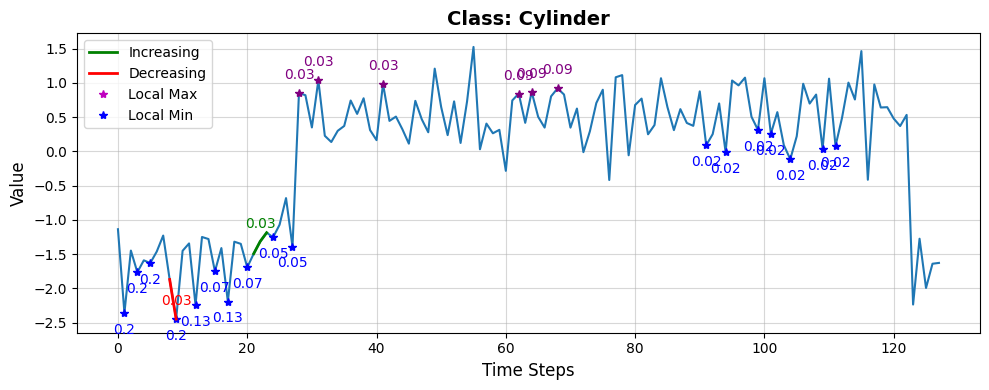

INFO:lomatce.explainer:Starting time series local explanation


Predection probability : tensor([0.9527, 0.0119, 0.0355])
Cylinder:                      0.9527
Bell:                      0.0119
Funnel:                      0.0355


INFO:lomatce.explainer:Perturbed instances shap for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 15997 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 12717 samples)
Optimal number of clusters for Decreasing_ch1: 18
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 34968 samples)
Optimal number of clusters for LocalMax_ch1: 3
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 35105 samples)
Optimal number of clusters for LocalMin_ch1: 3


INFO:lomatce.explainer:Final data shape: (1001, 43) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 43


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.92
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.99
INFO:lomatce.explainer:Model Type: Ridge


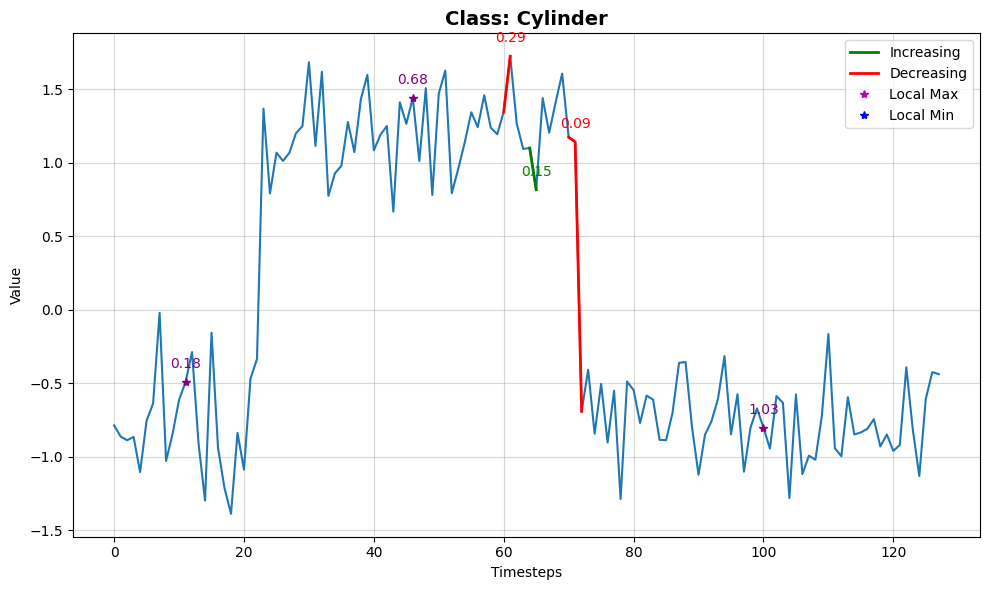

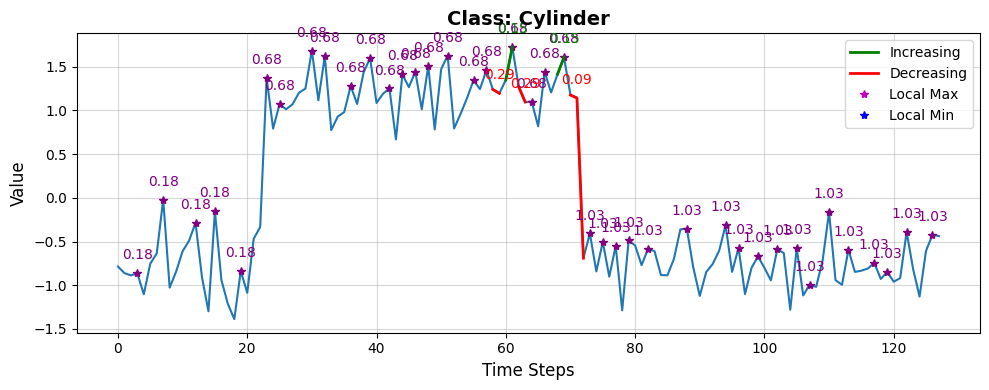

INFO:lomatce.explainer:Starting time series local explanation


Predection probability : tensor([0.9181, 0.0166, 0.0653])
Cylinder:                      0.9181
Bell:                      0.0166
Funnel:                      0.0653


INFO:lomatce.explainer:Perturbed instances shap for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 18009 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 12676 samples)
Optimal number of clusters for Decreasing_ch1: 17
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 35983 samples)
Optimal number of clusters for LocalMax_ch1: 3
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 35762 samples)
Optimal number of clusters for LocalMin_ch1: 3


INFO:lomatce.explainer:Final data shape: (1001, 42) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 42


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.93
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.92
INFO:lomatce.explainer:Model Type: Ridge


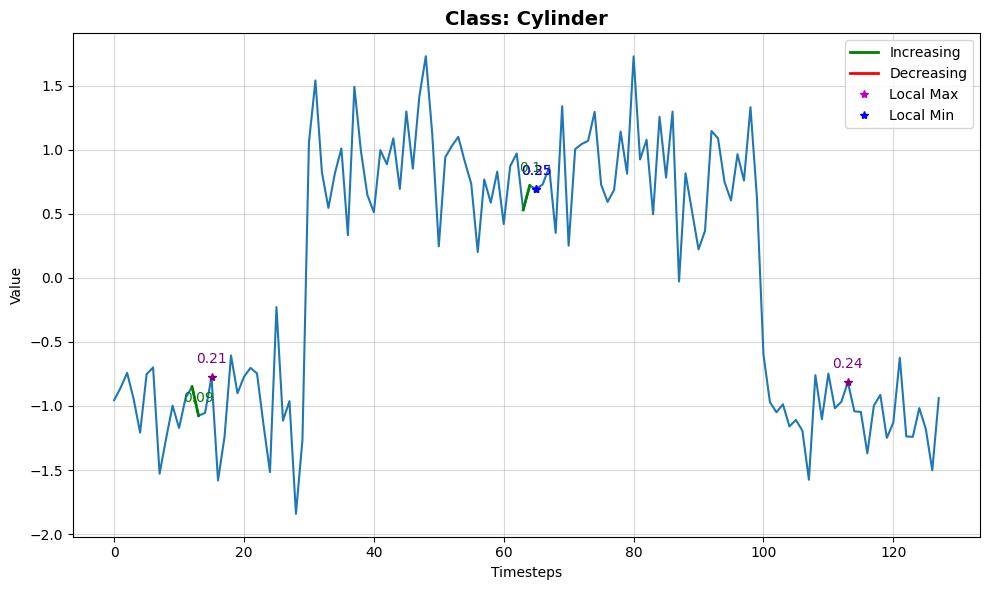

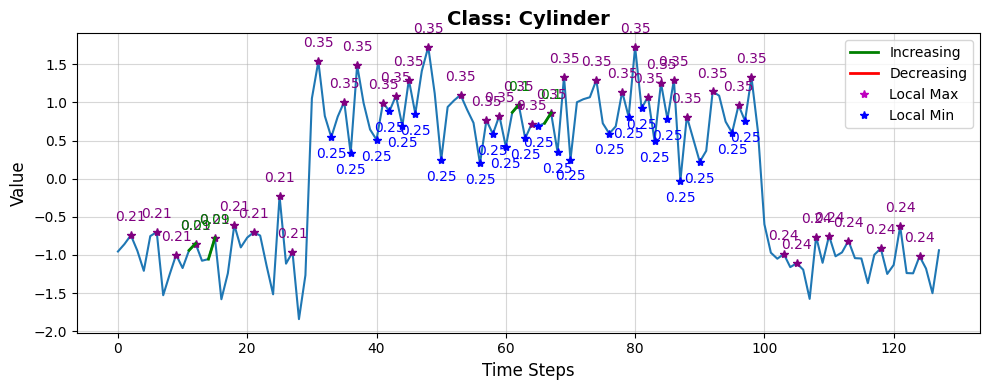

INFO:lomatce.explainer:Starting time series local explanation


Predection probability : tensor([0.8897, 0.0383, 0.0721])
Cylinder:                      0.8897
Bell:                      0.0383
Funnel:                      0.0721


INFO:lomatce.explainer:Perturbed instances shap for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 13480 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 17847 samples)
Optimal number of clusters for Decreasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 36076 samples)
Optimal number of clusters for LocalMax_ch1: 3
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 36828 samples)
Optimal number of clusters for LocalMin_ch1: 3


INFO:lomatce.explainer:Final data shape: (1001, 44) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 44


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.83
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.97
INFO:lomatce.explainer:Model Type: Ridge


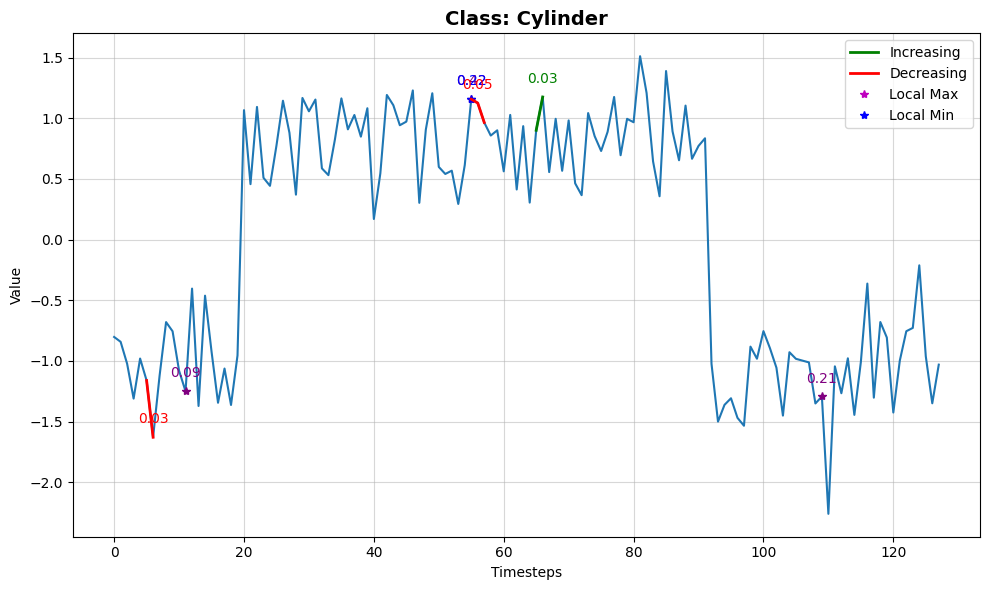

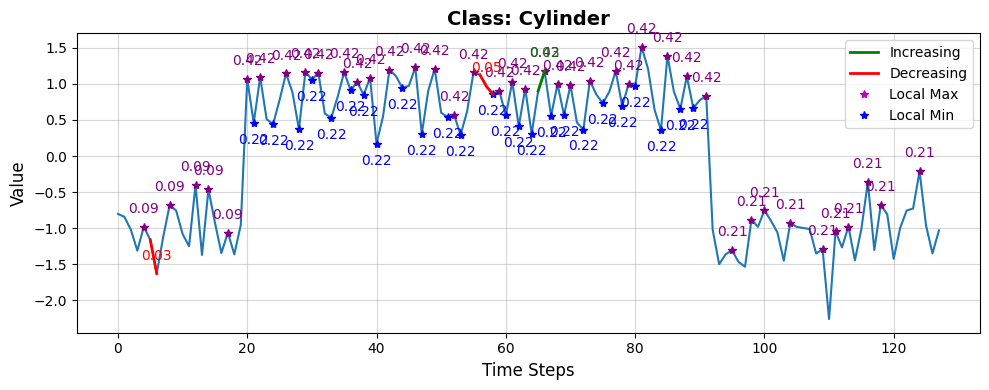

INFO:lomatce.explainer:Starting time series local explanation


Predection probability : tensor([0.9446, 0.0042, 0.0512])
Cylinder:                      0.9446
Bell:                      0.0042
Funnel:                      0.0512


INFO:lomatce.explainer:Perturbed instances shap for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 11696 samples)
Optimal number of clusters for Increasing_ch1: 18
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 14243 samples)
Optimal number of clusters for Decreasing_ch1: 17
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 36274 samples)
Optimal number of clusters for LocalMax_ch1: 17
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 36795 samples)
Optimal number of clusters for LocalMin_ch1: 19


INFO:lomatce.explainer:Final data shape: (1001, 71) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 71


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.94
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.97
INFO:lomatce.explainer:Model Type: Ridge


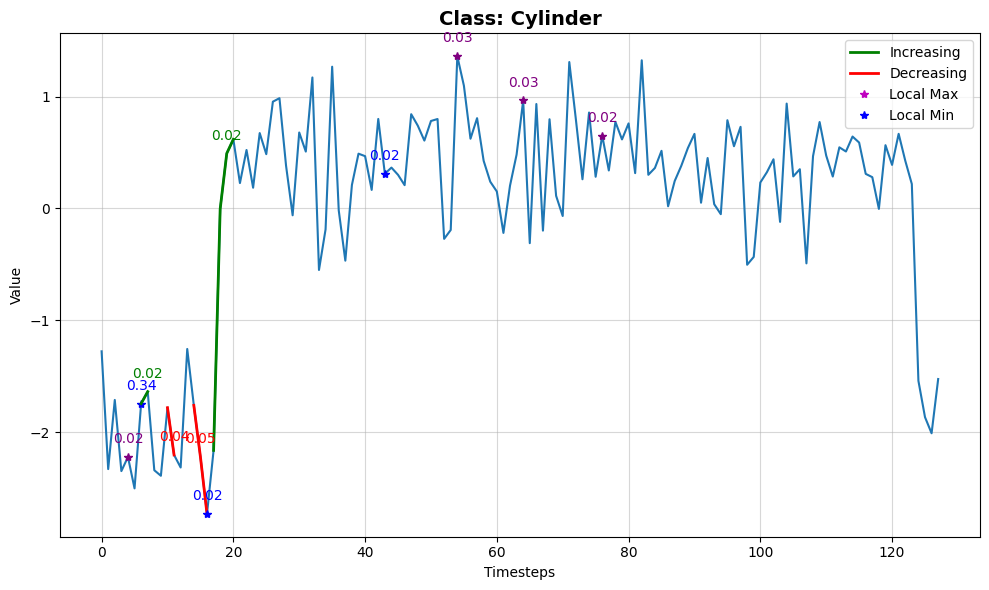

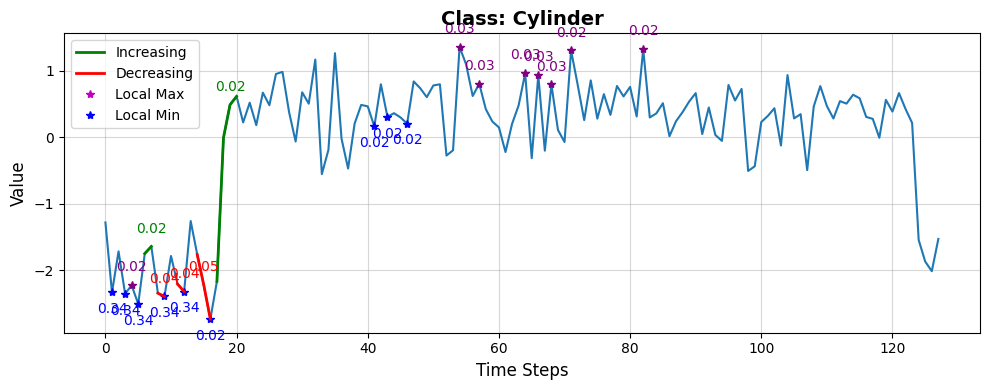

INFO:lomatce.explainer:Starting time series local explanation


Predection probability : tensor([0.9675, 0.0022, 0.0303])
Cylinder:                      0.9675
Bell:                      0.0022
Funnel:                      0.0303


INFO:lomatce.explainer:Perturbed instances shap for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 15396 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 16875 samples)
Optimal number of clusters for Decreasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 32850 samples)
Optimal number of clusters for LocalMax_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 32450 samples)
Optimal number of clusters for LocalMin_ch1: 19


INFO:lomatce.explainer:Final data shape: (1001, 76) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 76


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.93
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.97
INFO:lomatce.explainer:Model Type: Ridge


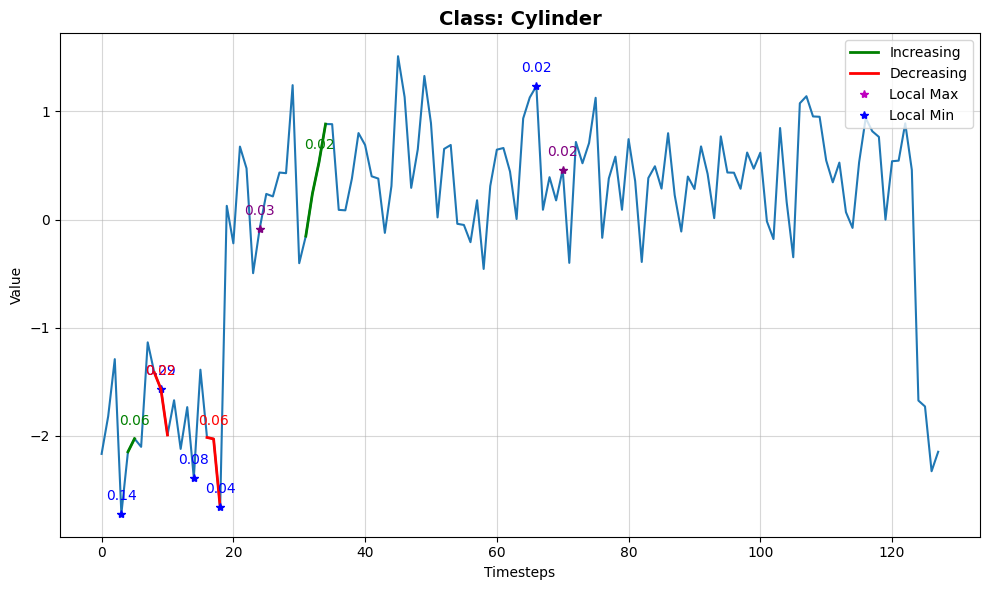

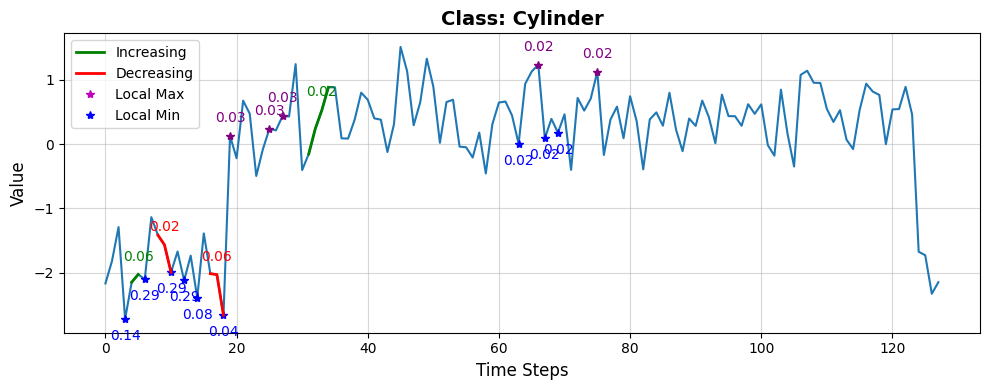

INFO:lomatce.explainer:Starting time series local explanation


Predection probability : tensor([0.9586, 0.0052, 0.0363])
Cylinder:                      0.9586
Bell:                      0.0052
Funnel:                      0.0363


INFO:lomatce.explainer:Perturbed instances shap for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 16028 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 10752 samples)
Optimal number of clusters for Decreasing_ch1: 18
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 37356 samples)
Optimal number of clusters for LocalMax_ch1: 3
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 37293 samples)
Optimal number of clusters for LocalMin_ch1: 3


INFO:lomatce.explainer:Final data shape: (1001, 43) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 43


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.9
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.99
INFO:lomatce.explainer:Model Type: Ridge


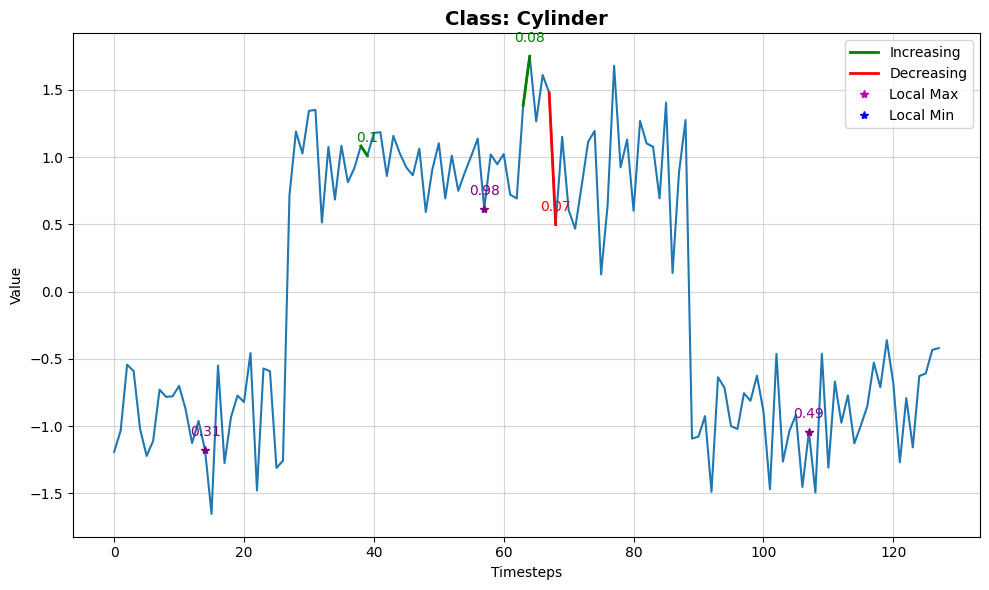

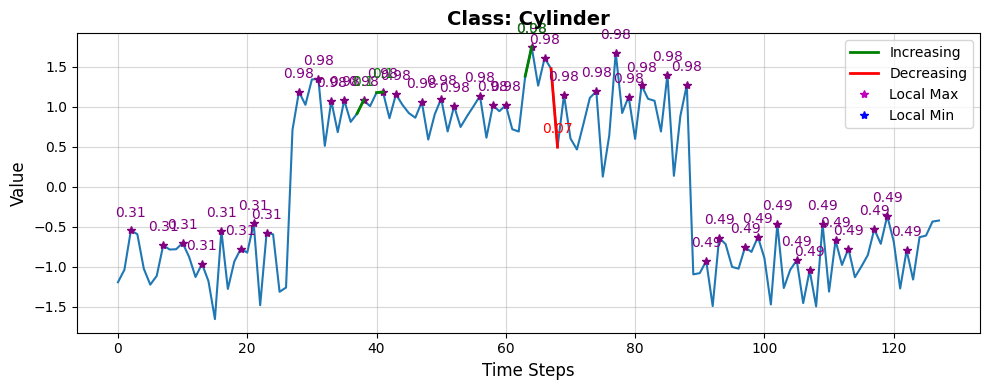

INFO:lomatce.explainer:Starting time series local explanation


Predection probability : tensor([0.9407, 0.0355, 0.0238])
Cylinder:                      0.9407
Bell:                      0.0355
Funnel:                      0.0238


INFO:lomatce.explainer:Perturbed instances shap for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 13575 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 11763 samples)
Optimal number of clusters for Decreasing_ch1: 17
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 40259 samples)
Optimal number of clusters for LocalMax_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 39905 samples)
Optimal number of clusters for LocalMin_ch1: 3


INFO:lomatce.explainer:Final data shape: (1001, 58) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 58


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.93
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.98
INFO:lomatce.explainer:Model Type: Ridge


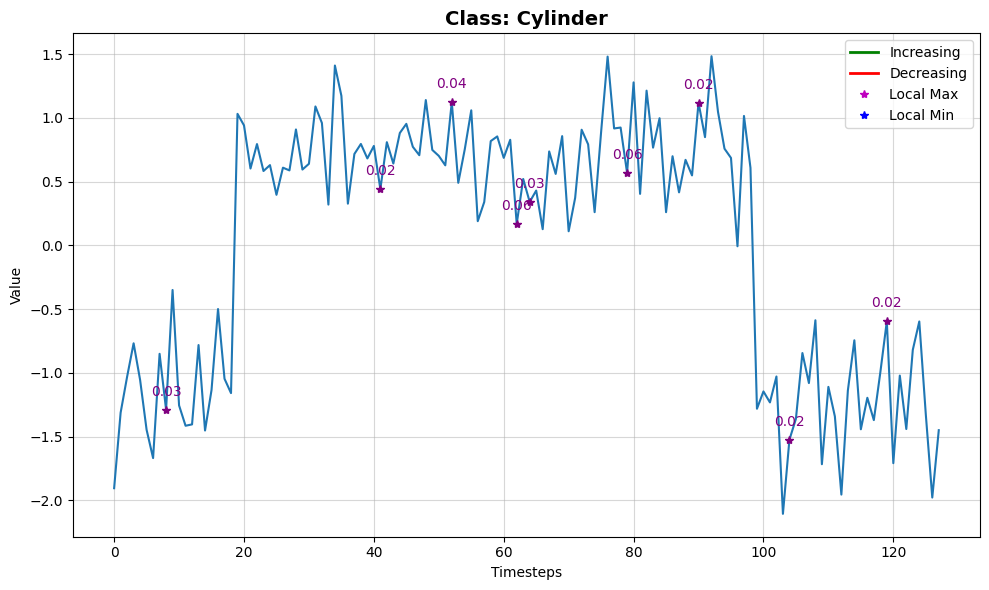

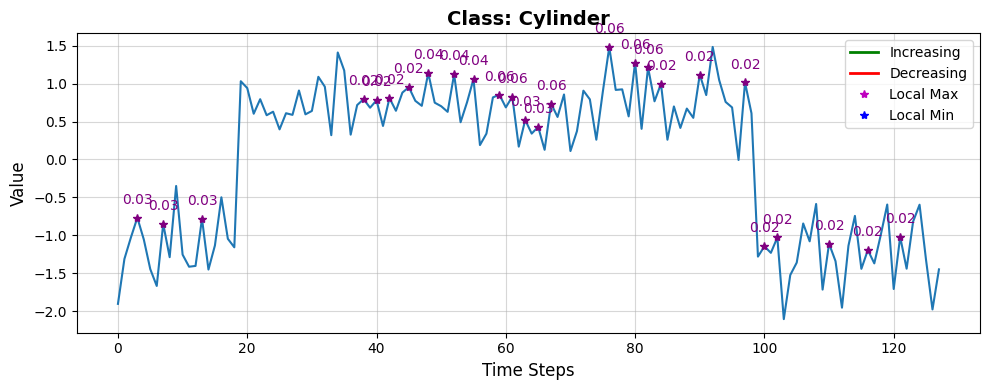

INFO:lomatce.explainer:Starting time series local explanation


Predection probability : tensor([0.9700, 0.0016, 0.0285])
Cylinder:                      0.9700
Bell:                      0.0016
Funnel:                      0.0285


INFO:lomatce.explainer:Perturbed instances shap for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 7291 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 15336 samples)
Optimal number of clusters for Decreasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 39640 samples)
Optimal number of clusters for LocalMax_ch1: 3
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 39535 samples)
Optimal number of clusters for LocalMin_ch1: 3


INFO:lomatce.explainer:Final data shape: (1001, 44) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 44


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.84
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.98
INFO:lomatce.explainer:Model Type: Ridge


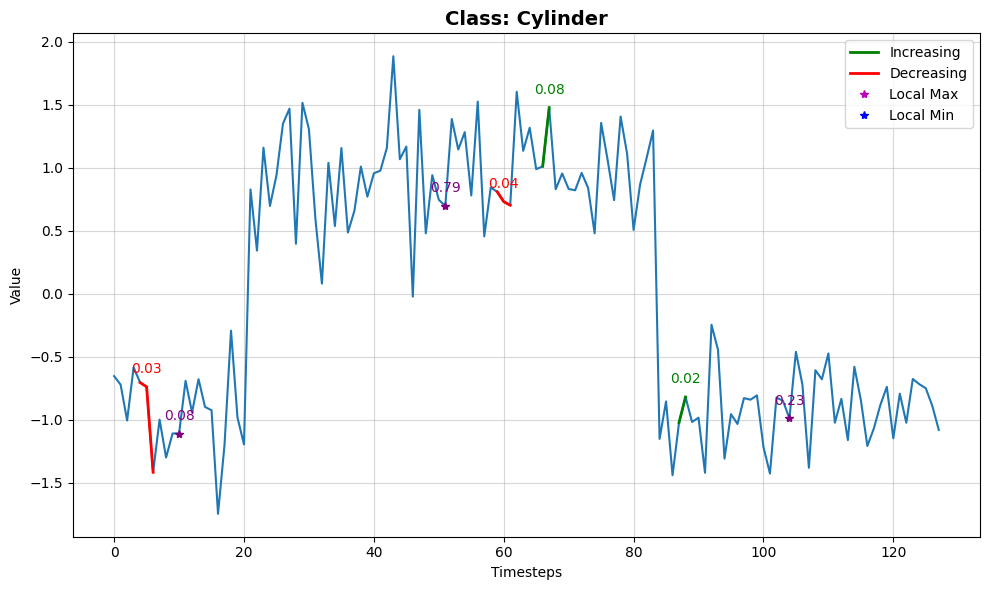

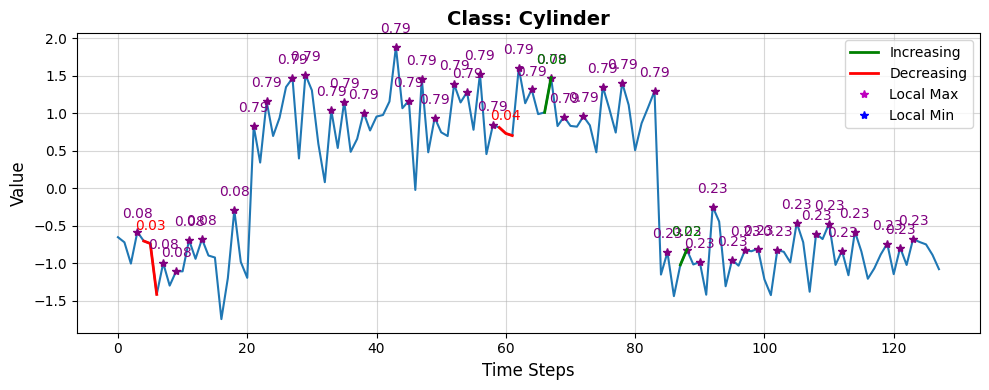

INFO:lomatce.explainer:Starting time series local explanation


Predection probability : tensor([0.9589, 0.0153, 0.0258])
Cylinder:                      0.9589
Bell:                      0.0153
Funnel:                      0.0258


INFO:lomatce.explainer:Perturbed instances shap for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 13543 samples)
Optimal number of clusters for Increasing_ch1: 18
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 10944 samples)
Optimal number of clusters for Decreasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 41589 samples)
Optimal number of clusters for LocalMax_ch1: 3
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 42145 samples)
Optimal number of clusters for LocalMin_ch1: 3


INFO:lomatce.explainer:Final data shape: (1001, 43) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 43


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.88
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.97
INFO:lomatce.explainer:Model Type: Ridge


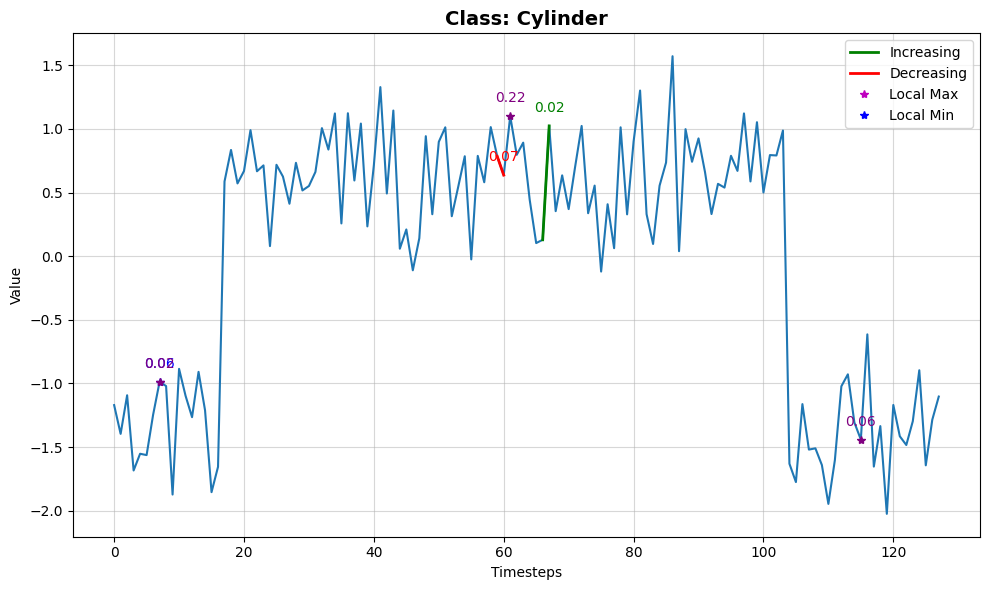

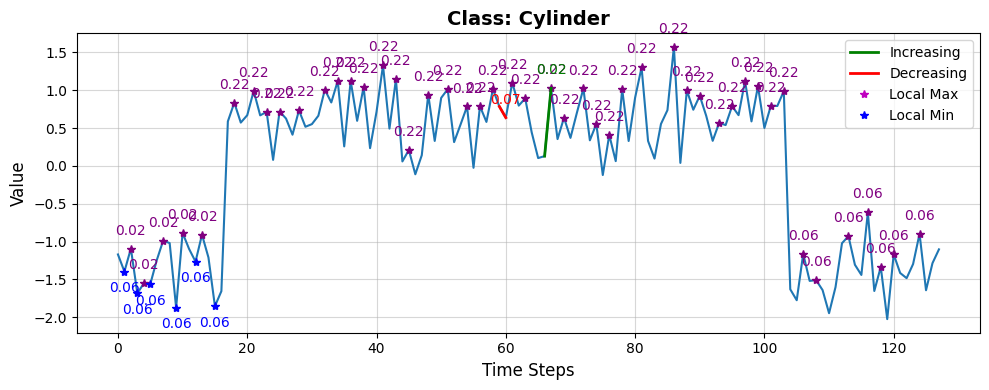

INFO:lomatce.explainer:Starting time series local explanation


Predection probability : tensor([0.9594, 0.0022, 0.0385])
Cylinder:                      0.9594
Bell:                      0.0022
Funnel:                      0.0385


INFO:lomatce.explainer:Perturbed instances shap for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 13482 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 13253 samples)
Optimal number of clusters for Decreasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 39164 samples)
Optimal number of clusters for LocalMax_ch1: 2
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 39700 samples)
Optimal number of clusters for LocalMin_ch1: 19


INFO:lomatce.explainer:Final data shape: (1001, 59) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 59


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.87
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.99
INFO:lomatce.explainer:Model Type: Ridge


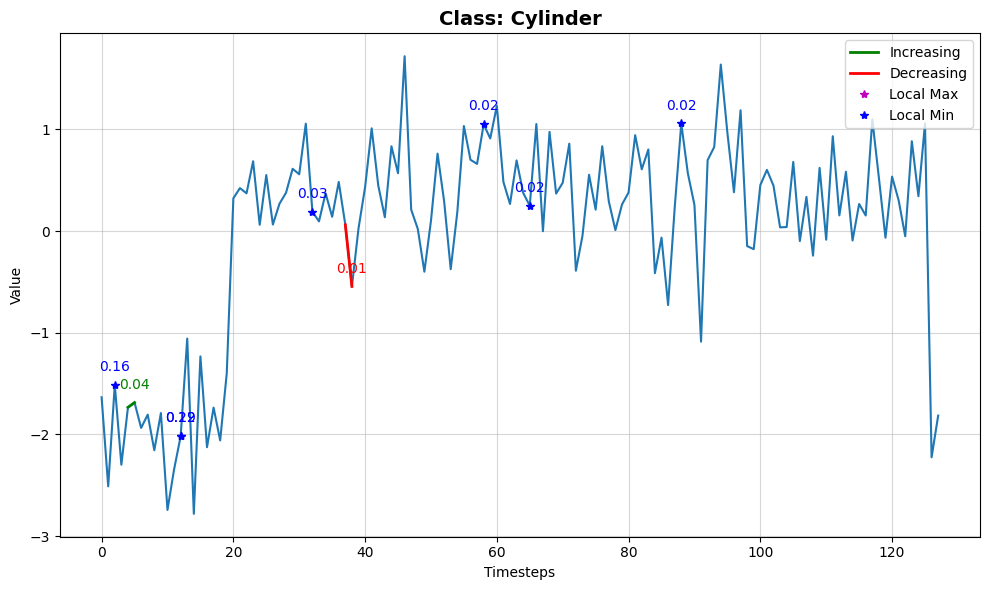

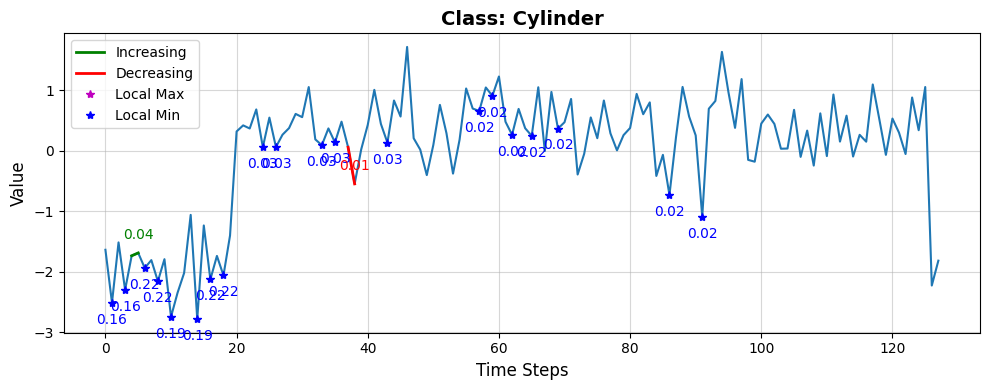

INFO:lomatce.explainer:Starting time series local explanation


Predection probability : tensor([0.9765, 0.0080, 0.0154])
Cylinder:                      0.9765
Bell:                      0.0080
Funnel:                      0.0154


INFO:lomatce.explainer:Perturbed instances shap for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 22048 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 13346 samples)
Optimal number of clusters for Decreasing_ch1: 18
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 35526 samples)
Optimal number of clusters for LocalMax_ch1: 2
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 35069 samples)
Optimal number of clusters for LocalMin_ch1: 19


INFO:lomatce.explainer:Final data shape: (1001, 58) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 58


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.9
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.98
INFO:lomatce.explainer:Model Type: Ridge


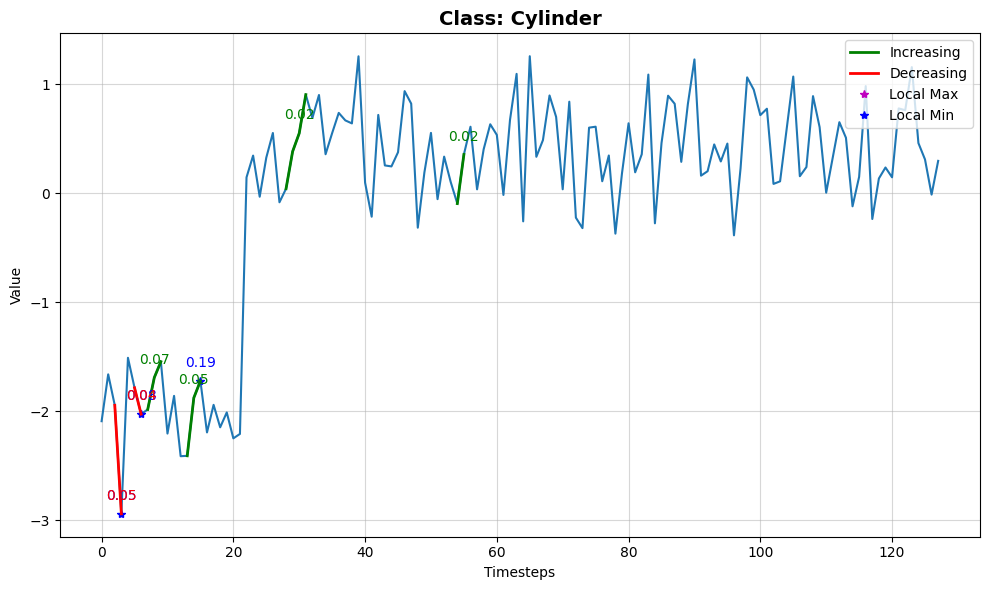

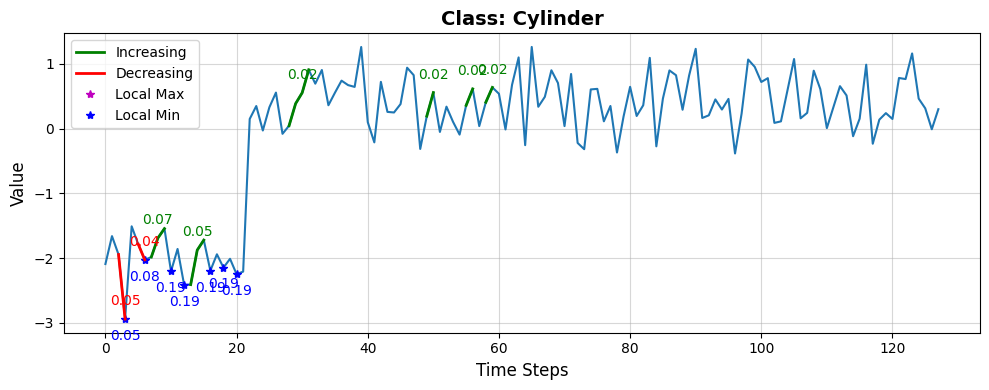

INFO:lomatce.explainer:Starting time series local explanation


Predection probability : tensor([0.9697, 0.0046, 0.0256])
Cylinder:                      0.9697
Bell:                      0.0046
Funnel:                      0.0256


INFO:lomatce.explainer:Perturbed instances shap for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 10838 samples)
Optimal number of clusters for Increasing_ch1: 17
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 14277 samples)
Optimal number of clusters for Decreasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 37120 samples)
Optimal number of clusters for LocalMax_ch1: 3
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 37056 samples)
Optimal number of clusters for LocalMin_ch1: 3


INFO:lomatce.explainer:Final data shape: (1001, 42) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 42


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.89
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.95
INFO:lomatce.explainer:Model Type: Ridge


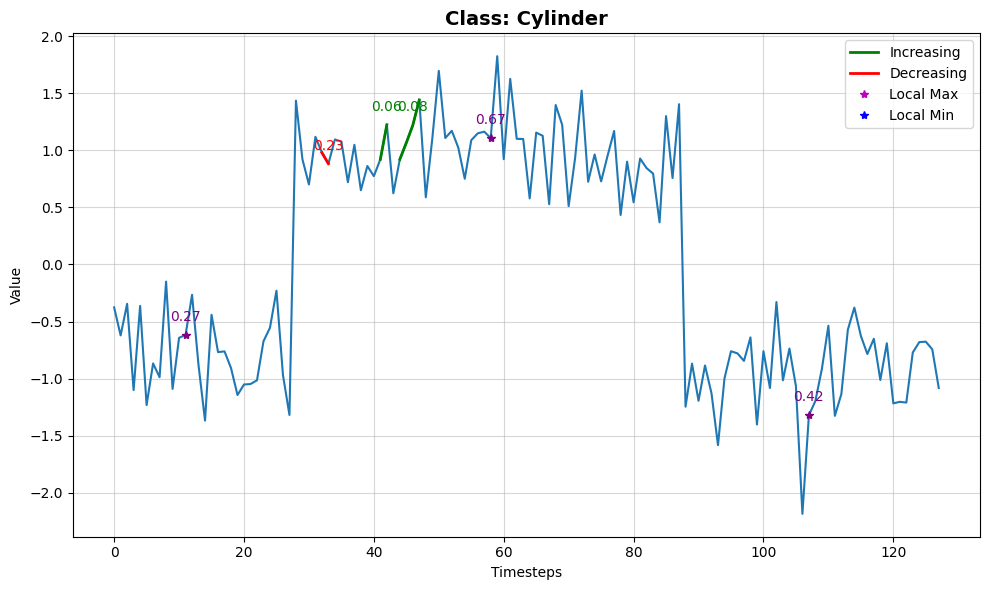

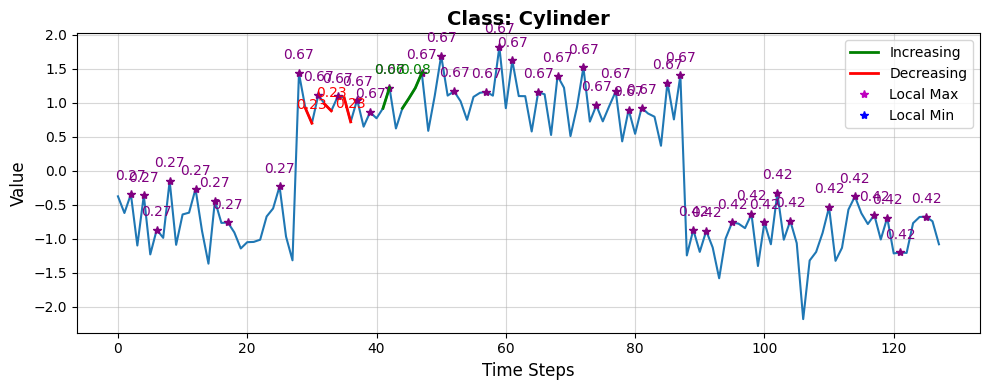

INFO:lomatce.explainer:Starting time series local explanation


Predection probability : tensor([0.9121, 0.0688, 0.0192])
Cylinder:                      0.9121
Bell:                      0.0688
Funnel:                      0.0192


INFO:lomatce.explainer:Perturbed instances shap for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 15988 samples)
Optimal number of clusters for Increasing_ch1: 18
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 15173 samples)
Optimal number of clusters for Decreasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 34774 samples)
Optimal number of clusters for LocalMax_ch1: 16
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 35261 samples)
Optimal number of clusters for LocalMin_ch1: 3


INFO:lomatce.explainer:Final data shape: (1001, 56) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 56


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.94
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.98
INFO:lomatce.explainer:Model Type: Ridge


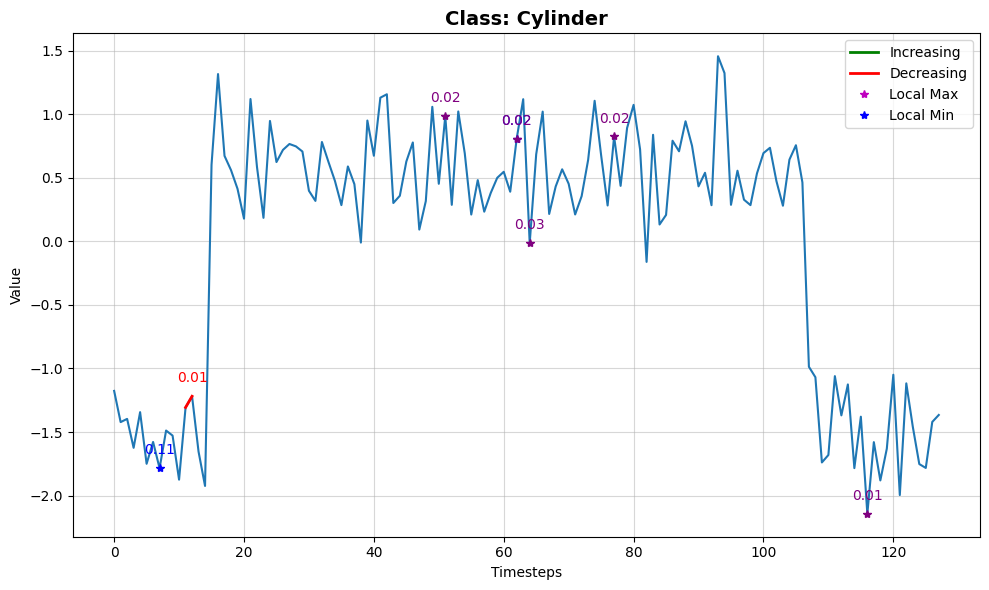

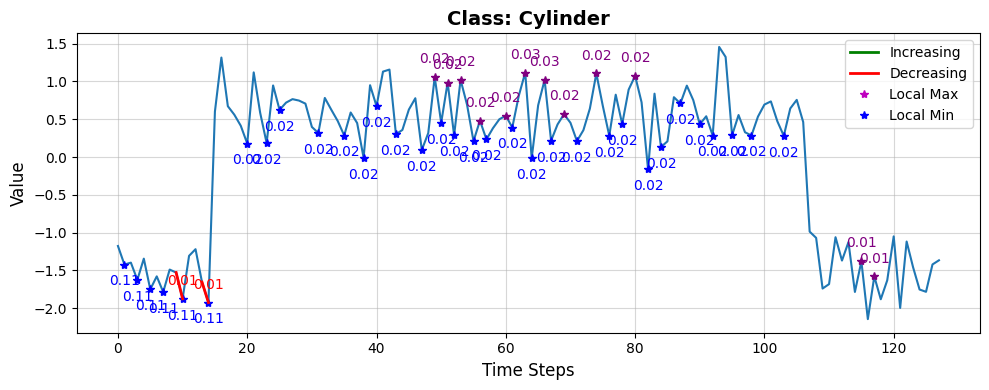

INFO:lomatce.explainer:Starting time series local explanation


Predection probability : tensor([0.9740, 0.0013, 0.0247])
Cylinder:                      0.9740
Bell:                      0.0013
Funnel:                      0.0247


INFO:lomatce.explainer:Perturbed instances shap for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 16007 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 16341 samples)
Optimal number of clusters for Decreasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 34717 samples)
Optimal number of clusters for LocalMax_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 34239 samples)
Optimal number of clusters for LocalMin_ch1: 19


INFO:lomatce.explainer:Final data shape: (1001, 76) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 76


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.92
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.99
INFO:lomatce.explainer:Model Type: Ridge


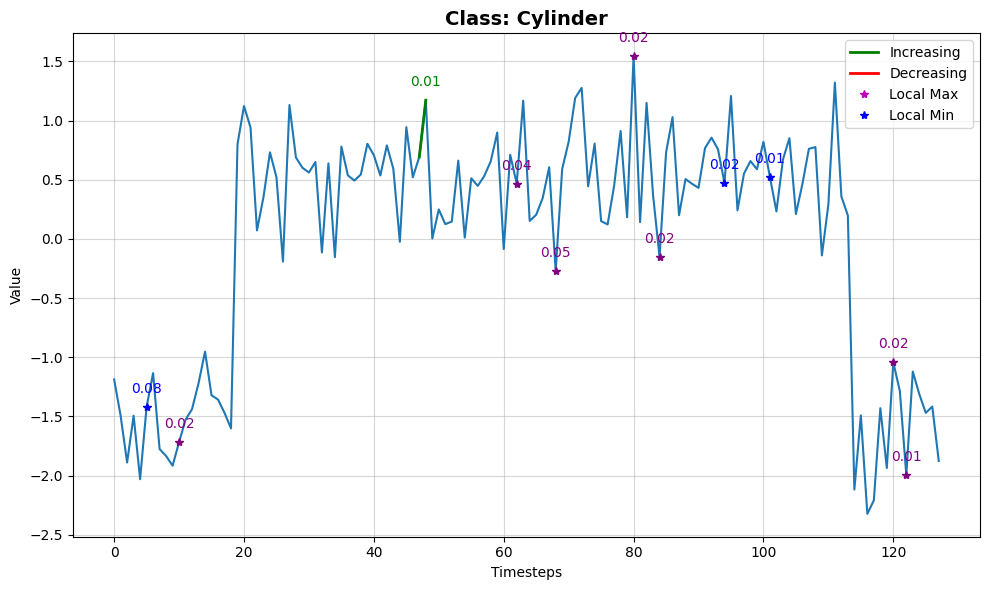

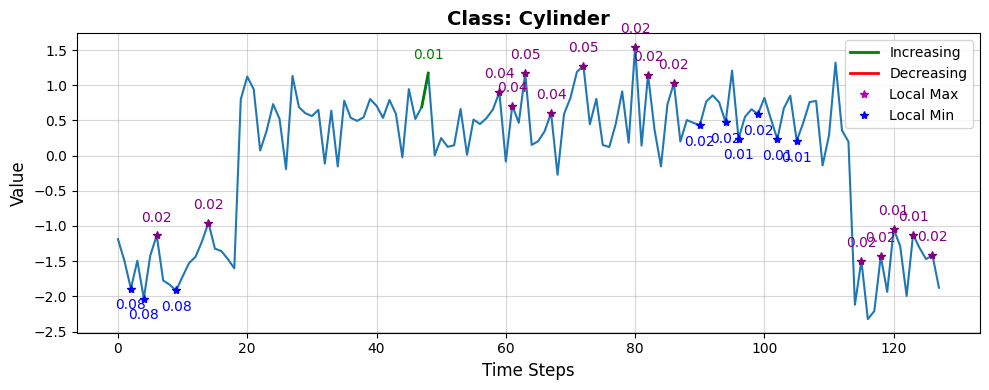

INFO:lomatce.explainer:Starting time series local explanation


Predection probability : tensor([0.9771, 0.0015, 0.0214])
Cylinder:                      0.9771
Bell:                      0.0015
Funnel:                      0.0214


INFO:lomatce.explainer:Perturbed instances shap for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 11891 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 15253 samples)
Optimal number of clusters for Decreasing_ch1: 18
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 34580 samples)
Optimal number of clusters for LocalMax_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 33060 samples)
Optimal number of clusters for LocalMin_ch1: 3


INFO:lomatce.explainer:Final data shape: (1001, 59) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 59


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.89
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.99
INFO:lomatce.explainer:Model Type: Ridge


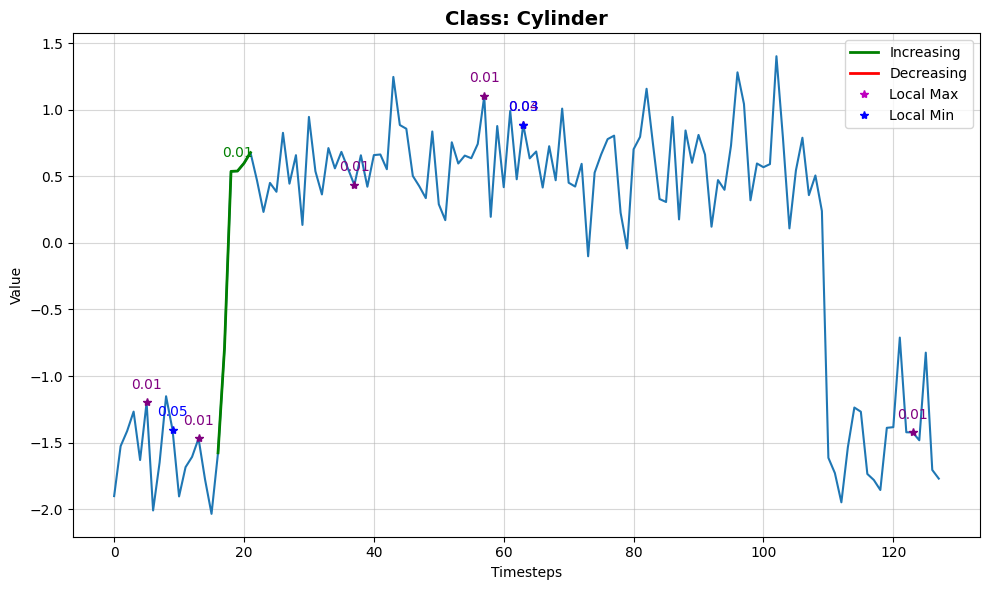

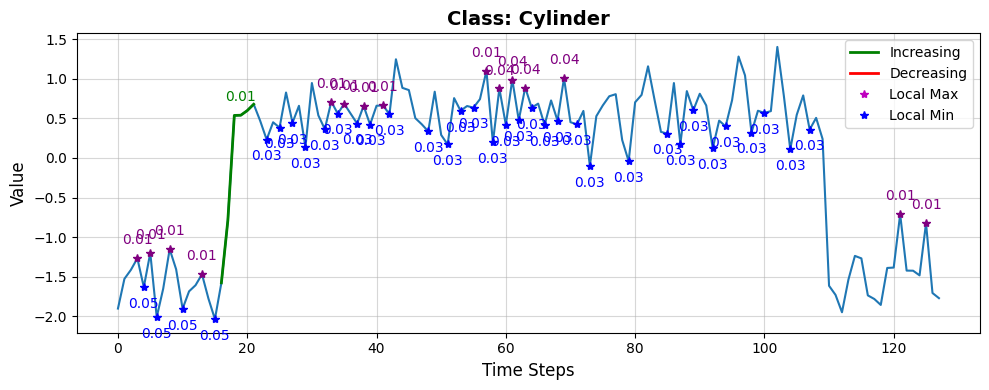

INFO:lomatce.explainer:Starting time series local explanation


Predection probability : tensor([0.9871, 0.0011, 0.0118])
Cylinder:                      0.9871
Bell:                      0.0011
Funnel:                      0.0118


INFO:lomatce.explainer:Perturbed instances shap for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 12623 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 17032 samples)
Optimal number of clusters for Decreasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 33517 samples)
Optimal number of clusters for LocalMax_ch1: 3
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 33615 samples)
Optimal number of clusters for LocalMin_ch1: 3


INFO:lomatce.explainer:Final data shape: (1001, 44) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 44


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.89
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.9
INFO:lomatce.explainer:Model Type: Ridge


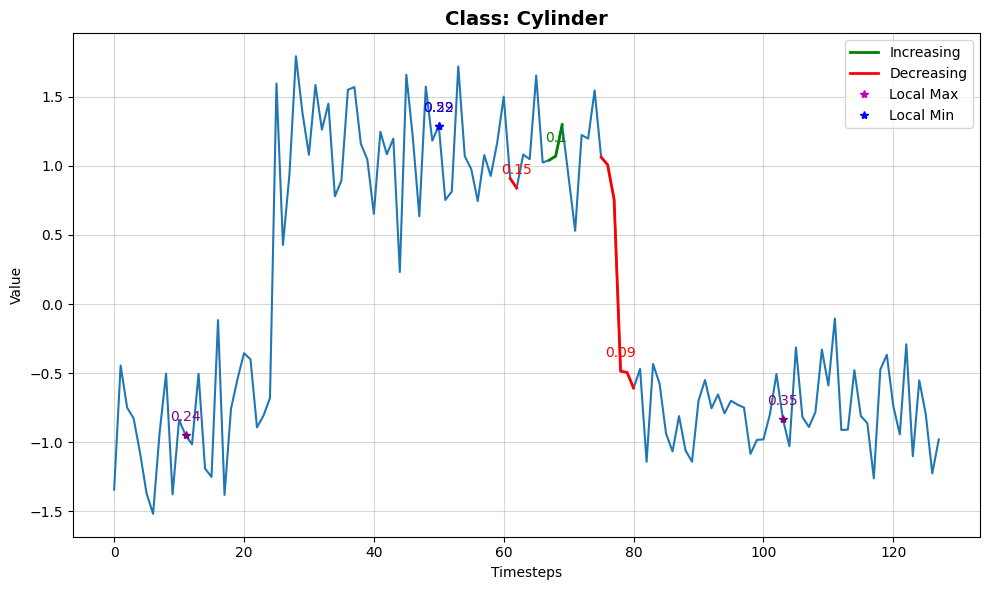

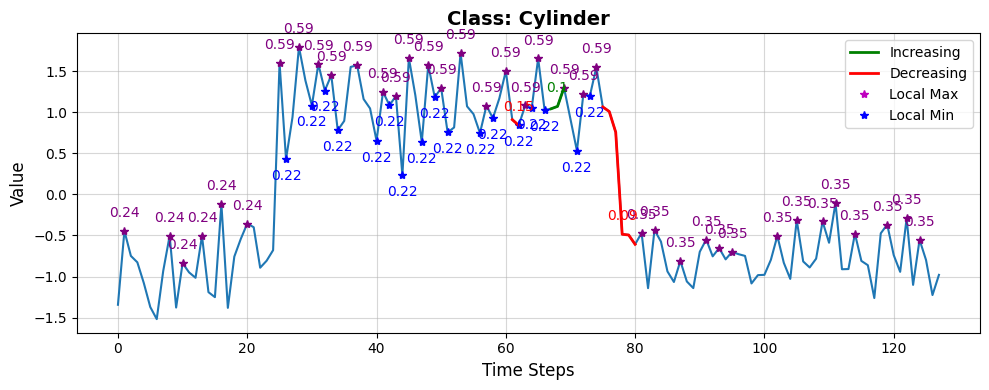

INFO:lomatce.explainer:Starting time series local explanation


Predection probability : tensor([0.8695, 0.0114, 0.1191])
Cylinder:                      0.8695
Bell:                      0.0114
Funnel:                      0.1191

📈 Global Faithfulness (Avg Local Fidelity): 0.8966

=== Running SP-LOMATCE for class Bell ===


INFO:lomatce.explainer:Perturbed instances shap for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 13433 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 10842 samples)
Optimal number of clusters for Decreasing_ch1: 17
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 39678 samples)
Optimal number of clusters for LocalMax_ch1: 4
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 38867 samples)
Optimal number of clusters for LocalMin_ch1: 3


INFO:lomatce.explainer:Final data shape: (1001, 43) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 43


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.65
INFO:lomatce.explainer:Local Prediction (Linear Model): 1.0
INFO:lomatce.explainer:Model Type: Ridge


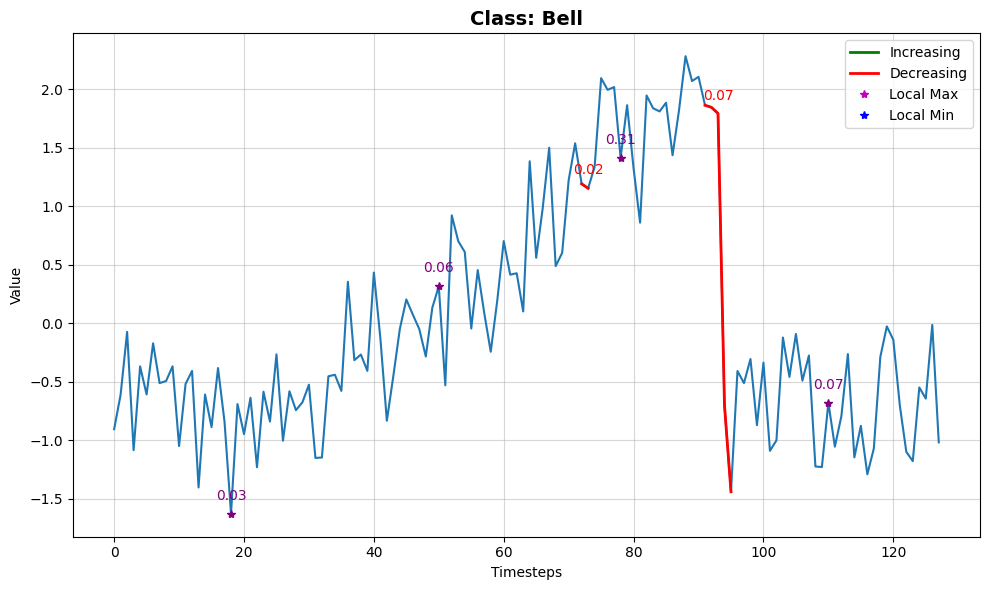

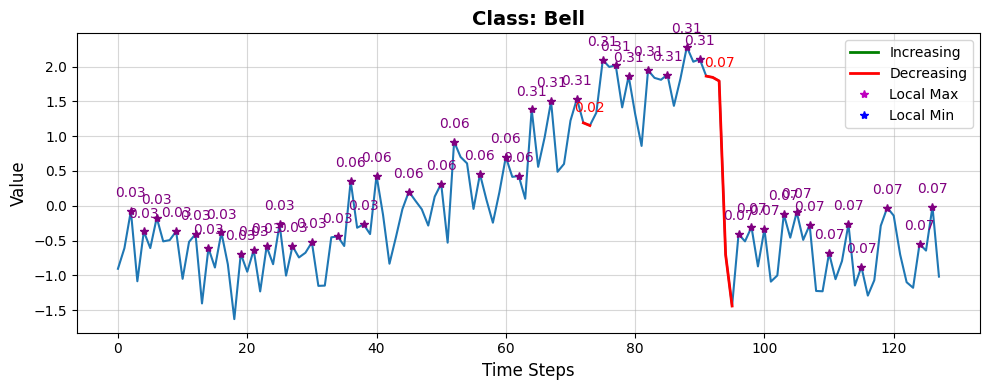

INFO:lomatce.explainer:Starting time series local explanation


Predection probability : tensor([2.7247e-03, 9.9727e-01, 6.6042e-06])
Cylinder:                      0.0027
Bell:                      0.9973
Funnel:                      0.0000


INFO:lomatce.explainer:Perturbed instances shap for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 16786 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 10032 samples)
Optimal number of clusters for Decreasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 37739 samples)
Optimal number of clusters for LocalMax_ch1: 3
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 38887 samples)
Optimal number of clusters for LocalMin_ch1: 19


INFO:lomatce.explainer:Final data shape: (1001, 60) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 60


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.85
INFO:lomatce.explainer:Local Prediction (Linear Model): 1.0
INFO:lomatce.explainer:Model Type: Ridge


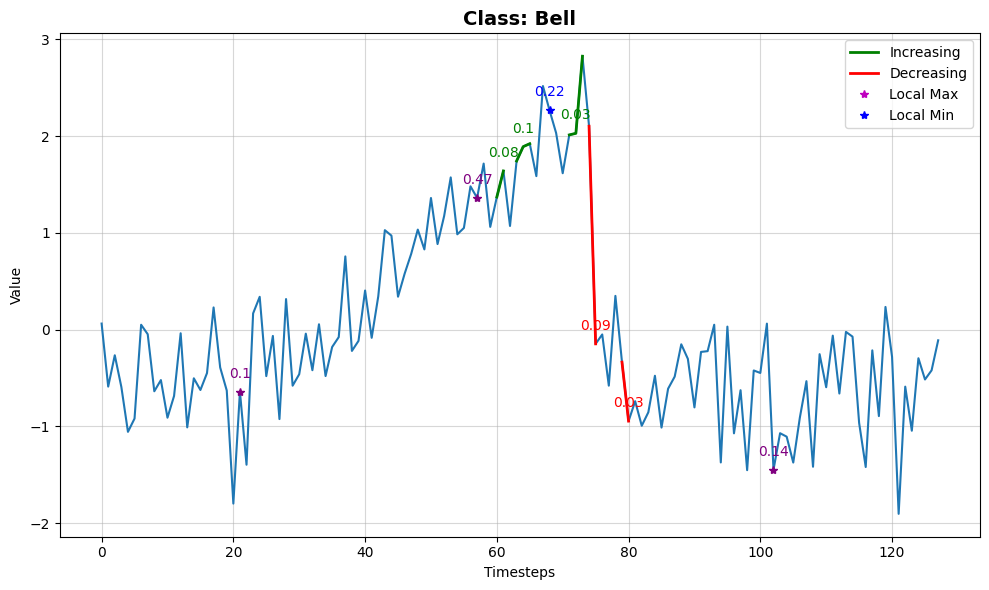

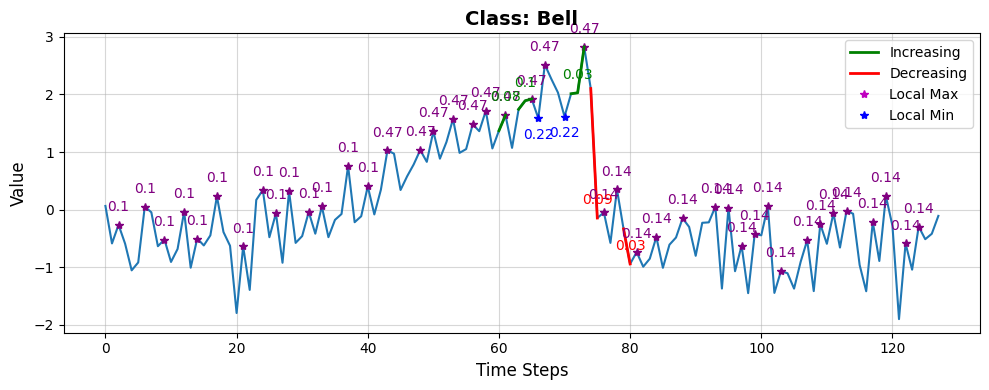

INFO:lomatce.explainer:Starting time series local explanation


Predection probability : tensor([9.0432e-03, 9.9096e-01, 1.5883e-06])
Cylinder:                      0.0090
Bell:                      0.9910
Funnel:                      0.0000


INFO:lomatce.explainer:Perturbed instances shap for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 15341 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 16804 samples)
Optimal number of clusters for Decreasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 35062 samples)
Optimal number of clusters for LocalMax_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 34973 samples)
Optimal number of clusters for LocalMin_ch1: 19


INFO:lomatce.explainer:Final data shape: (1001, 76) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 76


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.89
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.99
INFO:lomatce.explainer:Model Type: Ridge


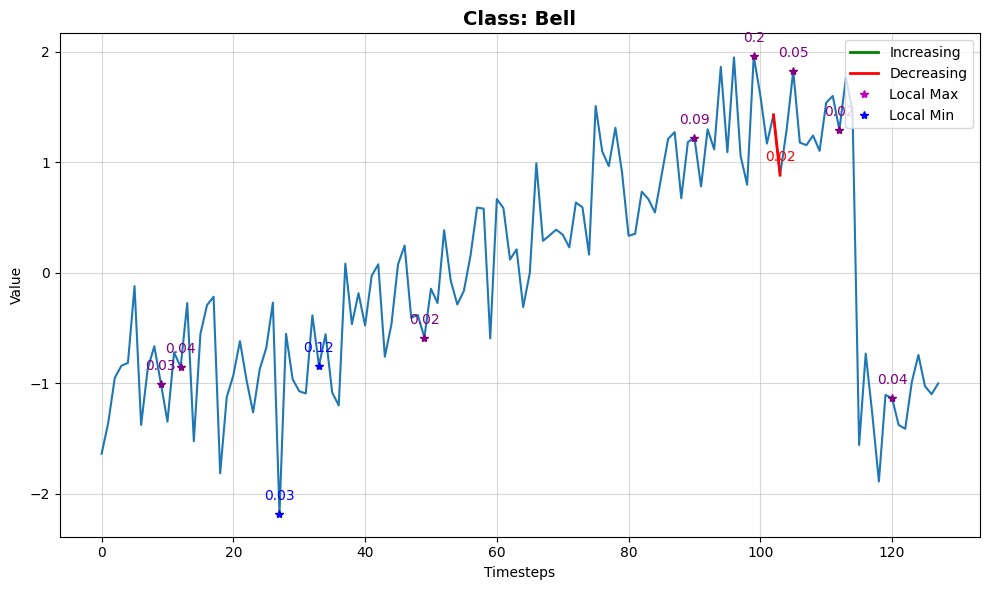

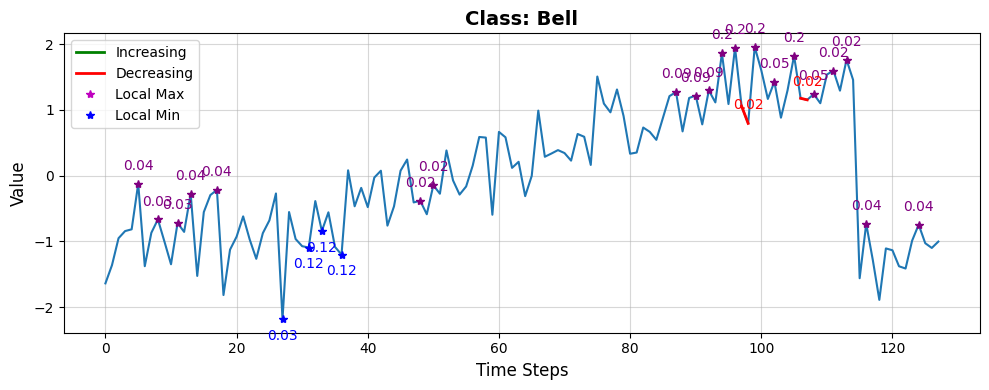

INFO:lomatce.explainer:Starting time series local explanation


Predection probability : tensor([1.4343e-02, 9.8498e-01, 6.7378e-04])
Cylinder:                      0.0143
Bell:                      0.9850
Funnel:                      0.0007


INFO:lomatce.explainer:Perturbed instances shap for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 14408 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 12577 samples)
Optimal number of clusters for Decreasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 37899 samples)
Optimal number of clusters for LocalMax_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 36955 samples)
Optimal number of clusters for LocalMin_ch1: 19


INFO:lomatce.explainer:Final data shape: (1001, 76) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 76


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.81
INFO:lomatce.explainer:Local Prediction (Linear Model): 1.0
INFO:lomatce.explainer:Model Type: Ridge


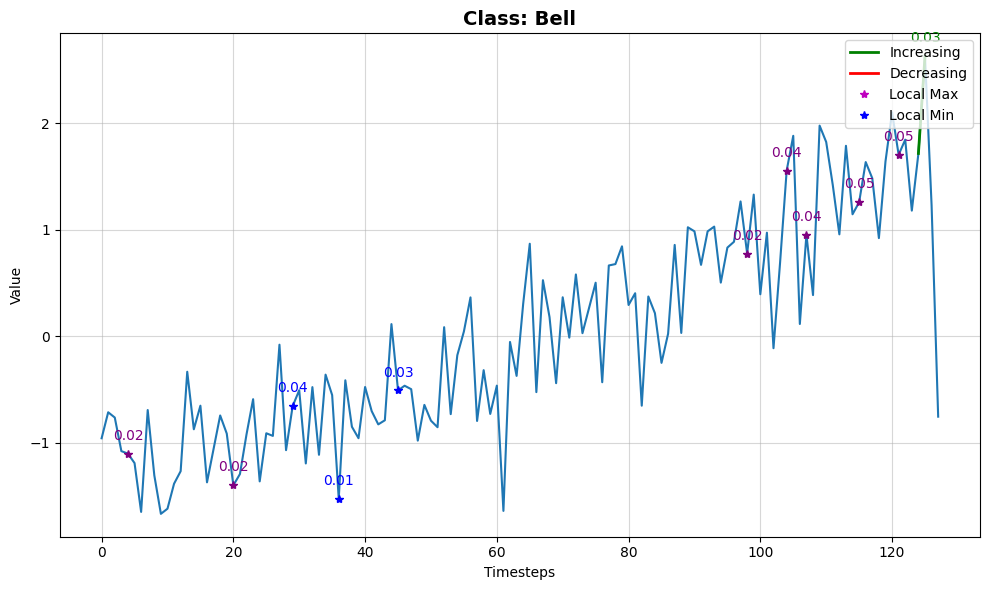

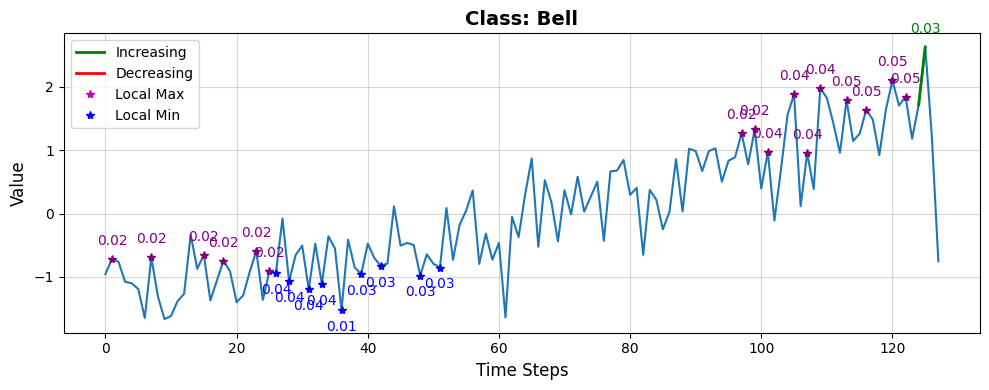

INFO:lomatce.explainer:Starting time series local explanation


Predection probability : tensor([0.0029, 0.9952, 0.0018])
Cylinder:                      0.0029
Bell:                      0.9952
Funnel:                      0.0018


INFO:lomatce.explainer:Perturbed instances shap for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 15253 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 13342 samples)
Optimal number of clusters for Decreasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 34479 samples)
Optimal number of clusters for LocalMax_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 34544 samples)
Optimal number of clusters for LocalMin_ch1: 19


INFO:lomatce.explainer:Final data shape: (1001, 76) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 76


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.75
INFO:lomatce.explainer:Local Prediction (Linear Model): 1.0
INFO:lomatce.explainer:Model Type: Ridge


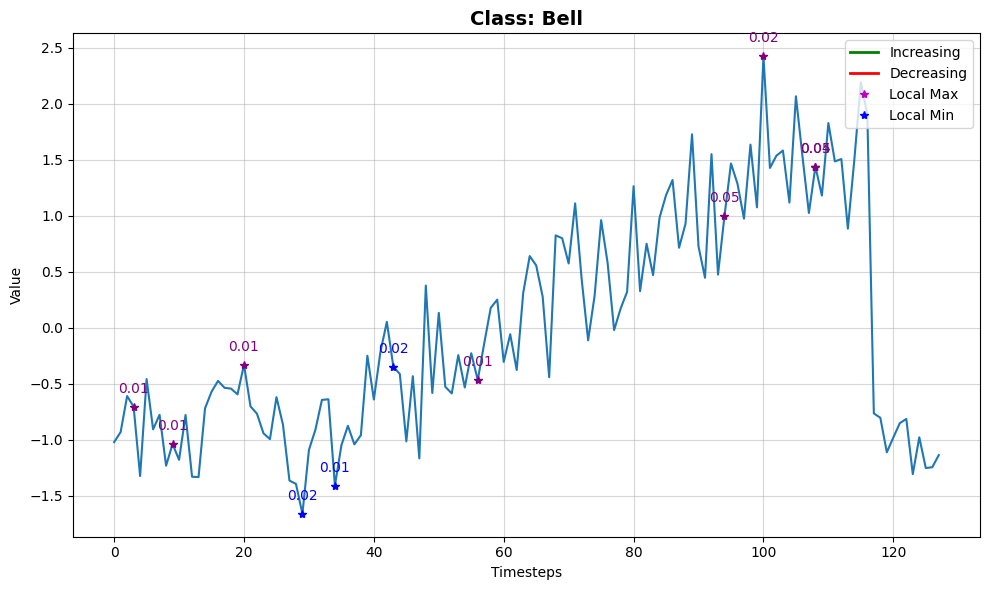

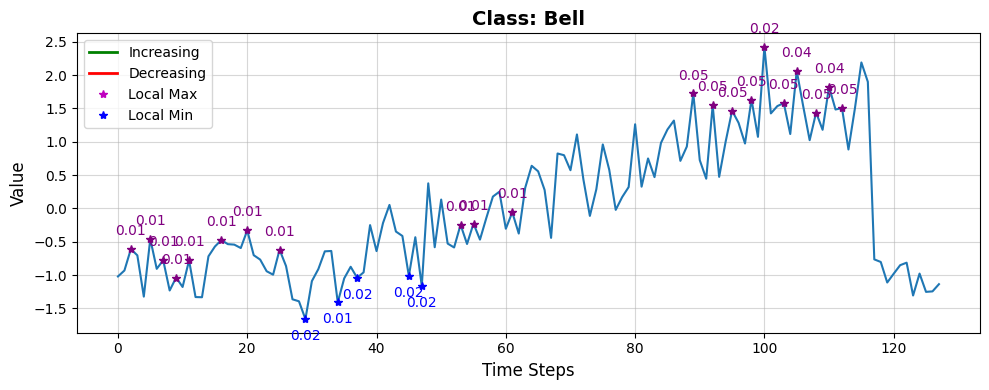

INFO:lomatce.explainer:Starting time series local explanation


Predection probability : tensor([1.2920e-03, 9.9855e-01, 1.5495e-04])
Cylinder:                      0.0013
Bell:                      0.9986
Funnel:                      0.0002


INFO:lomatce.explainer:Perturbed instances shap for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 16155 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 16158 samples)
Optimal number of clusters for Decreasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 37072 samples)
Optimal number of clusters for LocalMax_ch1: 3
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 38203 samples)
Optimal number of clusters for LocalMin_ch1: 19


INFO:lomatce.explainer:Final data shape: (1001, 60) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 60


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.55
INFO:lomatce.explainer:Local Prediction (Linear Model): 1.0
INFO:lomatce.explainer:Model Type: Ridge


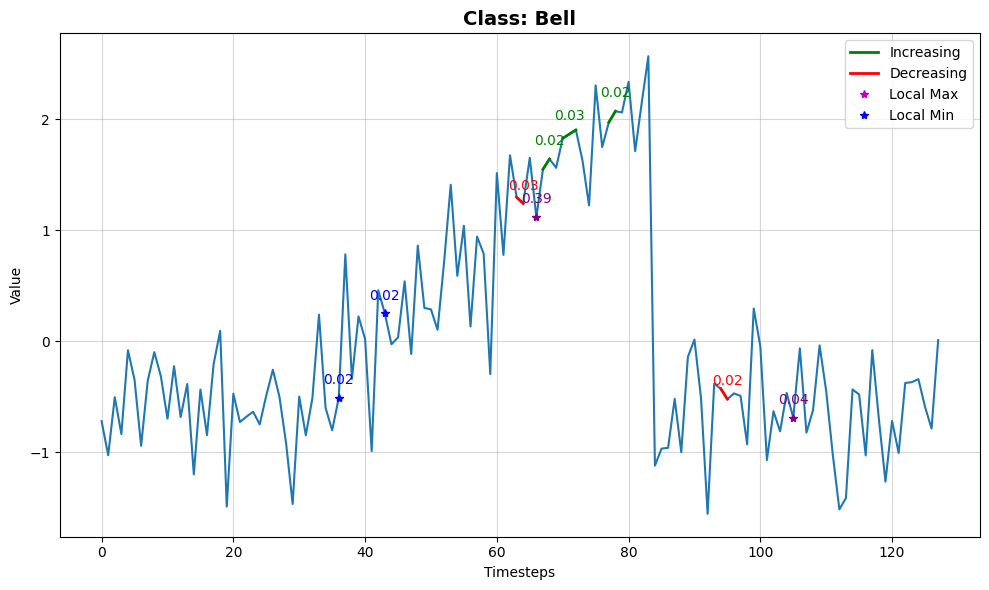

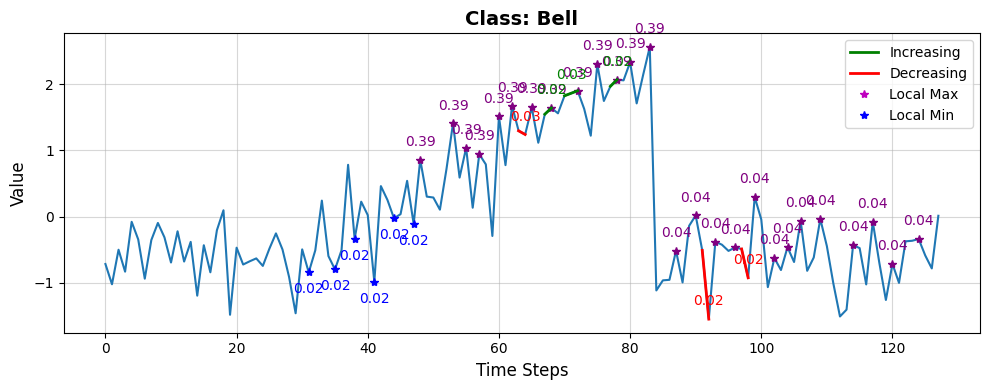

INFO:lomatce.explainer:Starting time series local explanation


Predection probability : tensor([2.3226e-03, 9.9768e-01, 1.8181e-06])
Cylinder:                      0.0023
Bell:                      0.9977
Funnel:                      0.0000


INFO:lomatce.explainer:Perturbed instances shap for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 12656 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 16843 samples)
Optimal number of clusters for Decreasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 36868 samples)
Optimal number of clusters for LocalMax_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 36854 samples)
Optimal number of clusters for LocalMin_ch1: 17


INFO:lomatce.explainer:Final data shape: (1001, 74) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 74


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.82
INFO:lomatce.explainer:Local Prediction (Linear Model): 1.0
INFO:lomatce.explainer:Model Type: Ridge


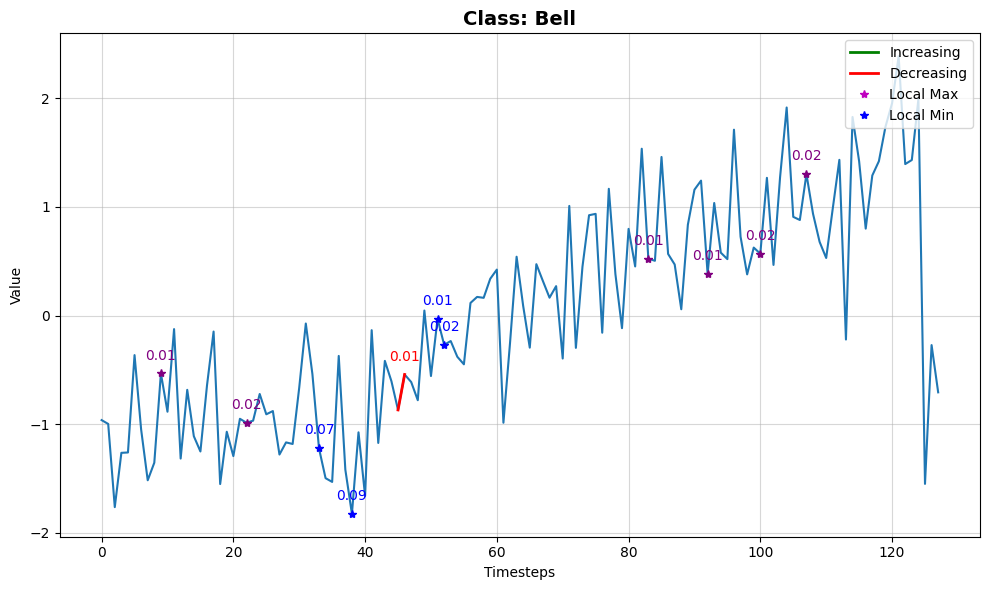

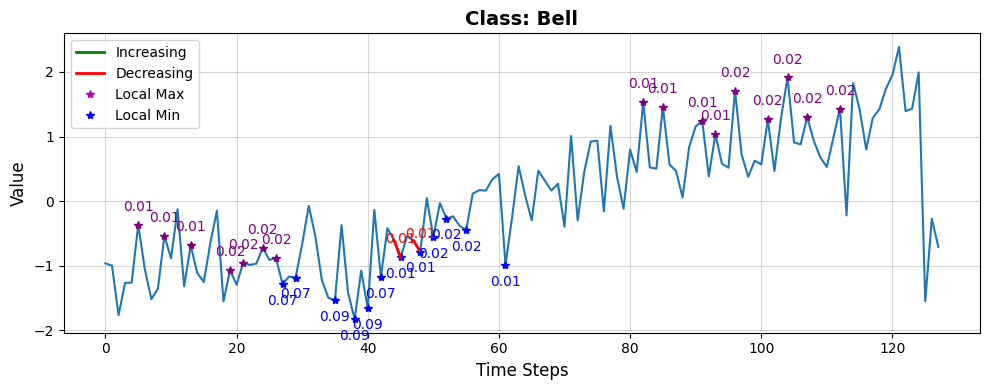

INFO:lomatce.explainer:Starting time series local explanation


Predection probability : tensor([0.0021, 0.9967, 0.0012])
Cylinder:                      0.0021
Bell:                      0.9967
Funnel:                      0.0012


INFO:lomatce.explainer:Perturbed instances shap for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 15108 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 15171 samples)
Optimal number of clusters for Decreasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 35239 samples)
Optimal number of clusters for LocalMax_ch1: 18
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 34461 samples)
Optimal number of clusters for LocalMin_ch1: 19


INFO:lomatce.explainer:Final data shape: (1001, 75) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 75


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.89
INFO:lomatce.explainer:Local Prediction (Linear Model): 1.01
INFO:lomatce.explainer:Model Type: Ridge


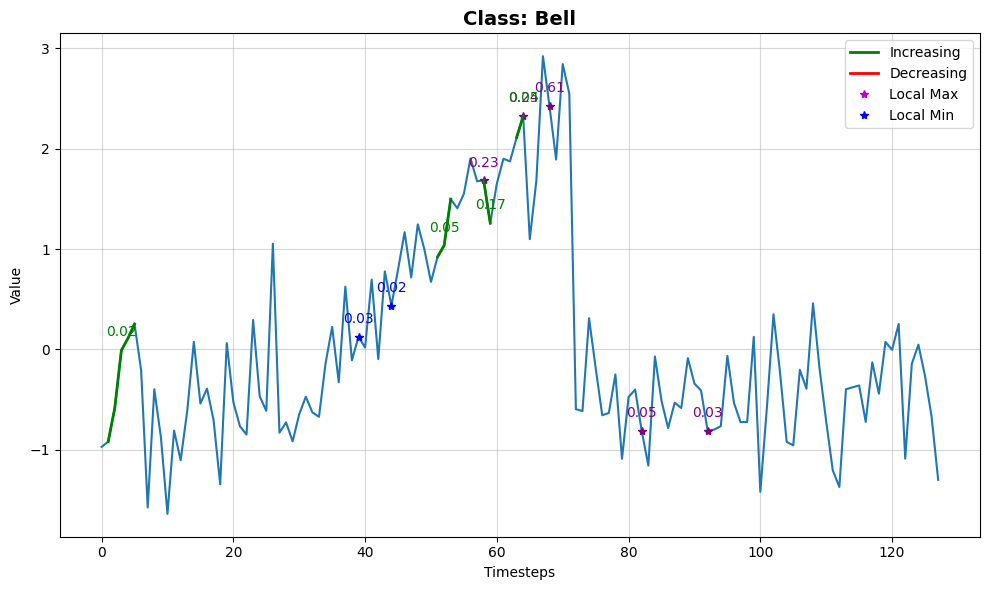

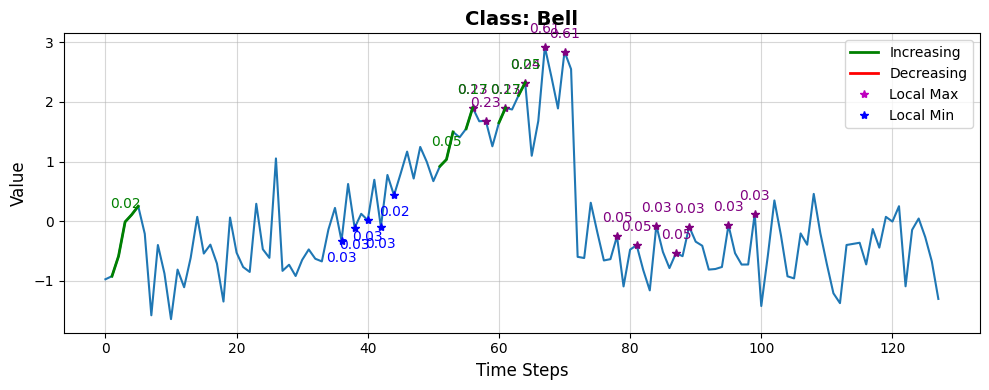

INFO:lomatce.explainer:Starting time series local explanation


Predection probability : tensor([3.1067e-03, 9.9689e-01, 1.3830e-06])
Cylinder:                      0.0031
Bell:                      0.9969
Funnel:                      0.0000


INFO:lomatce.explainer:Perturbed instances shap for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 16830 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 17724 samples)
Optimal number of clusters for Decreasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 34599 samples)
Optimal number of clusters for LocalMax_ch1: 18
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 34680 samples)
Optimal number of clusters for LocalMin_ch1: 19


INFO:lomatce.explainer:Final data shape: (1001, 75) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 75


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.95
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.98
INFO:lomatce.explainer:Model Type: Ridge


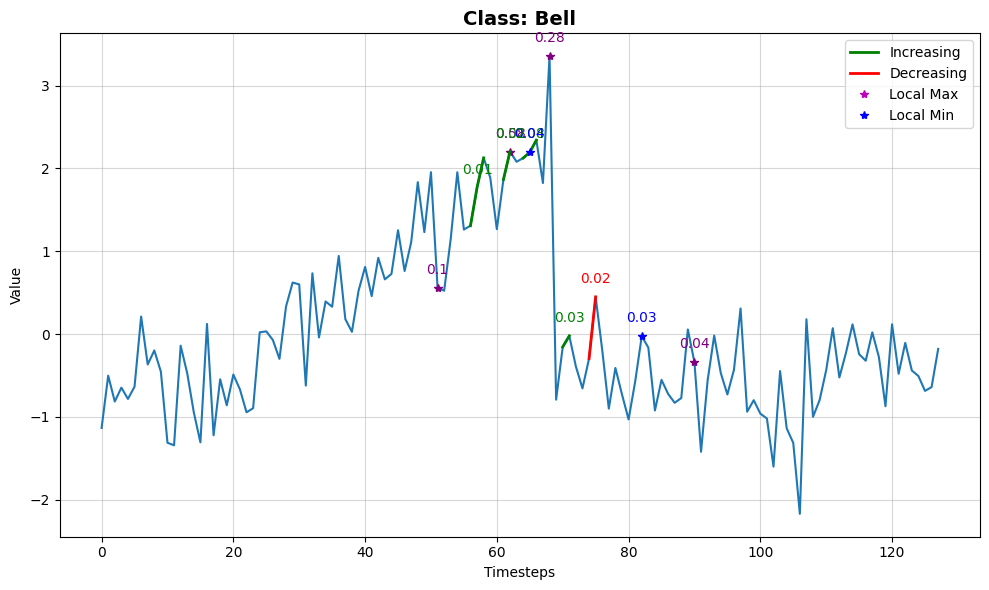

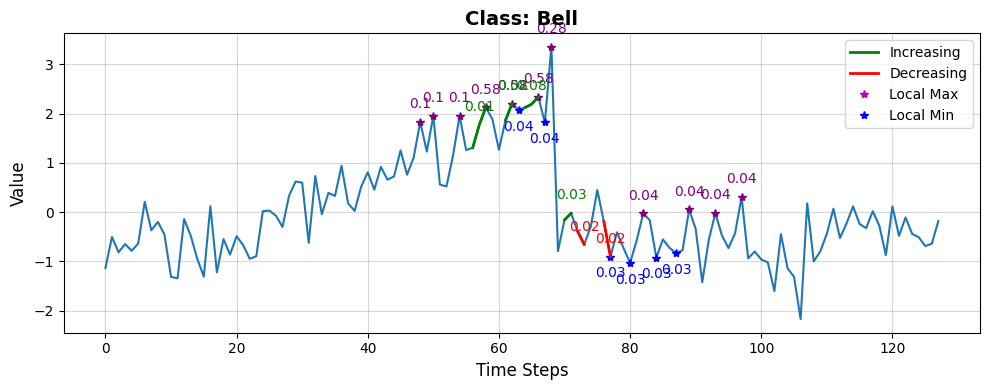

INFO:lomatce.explainer:Starting time series local explanation


Predection probability : tensor([2.6858e-02, 9.7313e-01, 1.0367e-05])
Cylinder:                      0.0269
Bell:                      0.9731
Funnel:                      0.0000


INFO:lomatce.explainer:Perturbed instances shap for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 10558 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 13545 samples)
Optimal number of clusters for Decreasing_ch1: 17
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 37909 samples)
Optimal number of clusters for LocalMax_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 37939 samples)
Optimal number of clusters for LocalMin_ch1: 19


INFO:lomatce.explainer:Final data shape: (1001, 74) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 74


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.88
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.99
INFO:lomatce.explainer:Model Type: Ridge


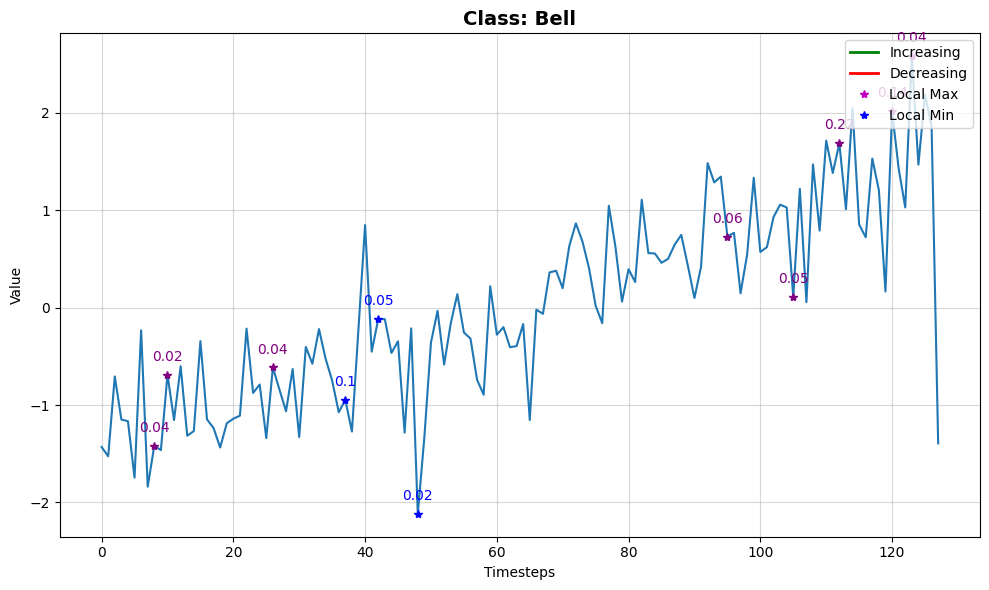

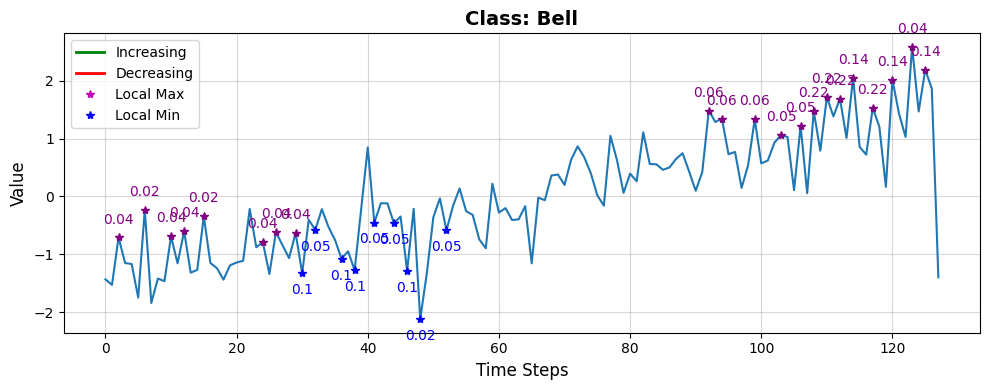

INFO:lomatce.explainer:Starting time series local explanation


Predection probability : tensor([0.0111, 0.9826, 0.0064])
Cylinder:                      0.0111
Bell:                      0.9826
Funnel:                      0.0064


INFO:lomatce.explainer:Perturbed instances shap for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 14247 samples)
Optimal number of clusters for Increasing_ch1: 18
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 14344 samples)
Optimal number of clusters for Decreasing_ch1: 18
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 37739 samples)
Optimal number of clusters for LocalMax_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 38685 samples)
Optimal number of clusters for LocalMin_ch1: 19


INFO:lomatce.explainer:Final data shape: (1001, 74) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 74


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.83
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.99
INFO:lomatce.explainer:Model Type: Ridge


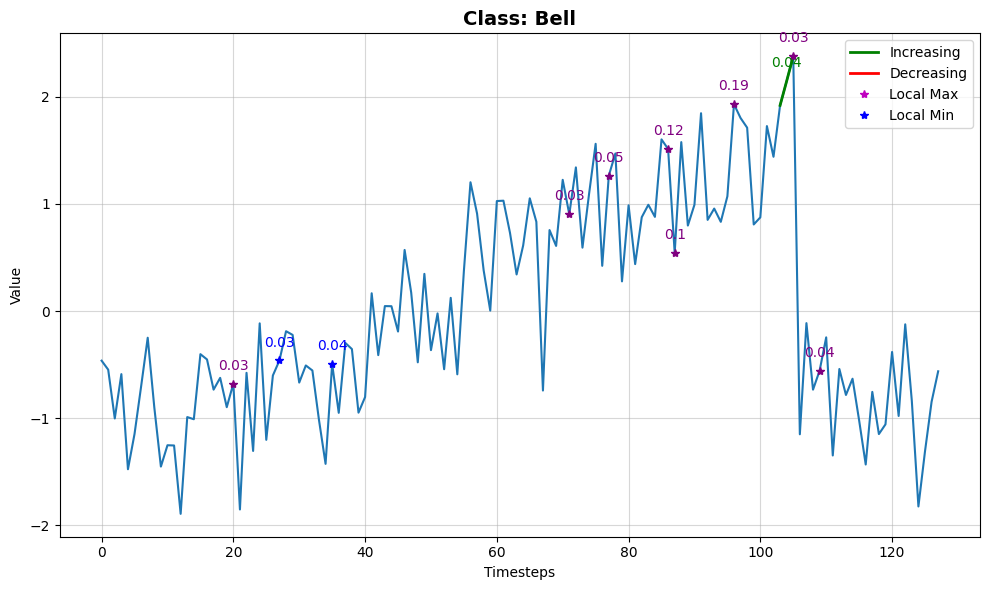

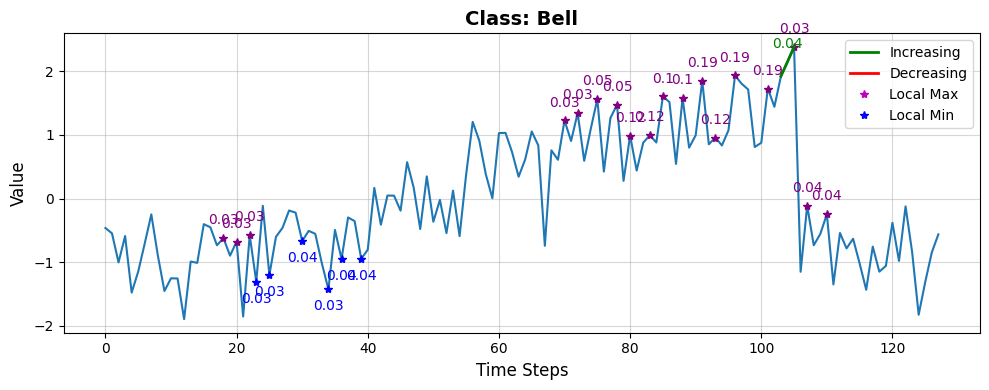

INFO:lomatce.explainer:Starting time series local explanation


Predection probability : tensor([1.1167e-02, 9.8868e-01, 1.5391e-04])
Cylinder:                      0.0112
Bell:                      0.9887
Funnel:                      0.0002


INFO:lomatce.explainer:Perturbed instances shap for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 15917 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 13717 samples)
Optimal number of clusters for Decreasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 35335 samples)
Optimal number of clusters for LocalMax_ch1: 18
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 35494 samples)
Optimal number of clusters for LocalMin_ch1: 19


INFO:lomatce.explainer:Final data shape: (1001, 75) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 75


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.79
INFO:lomatce.explainer:Local Prediction (Linear Model): 1.0
INFO:lomatce.explainer:Model Type: Ridge


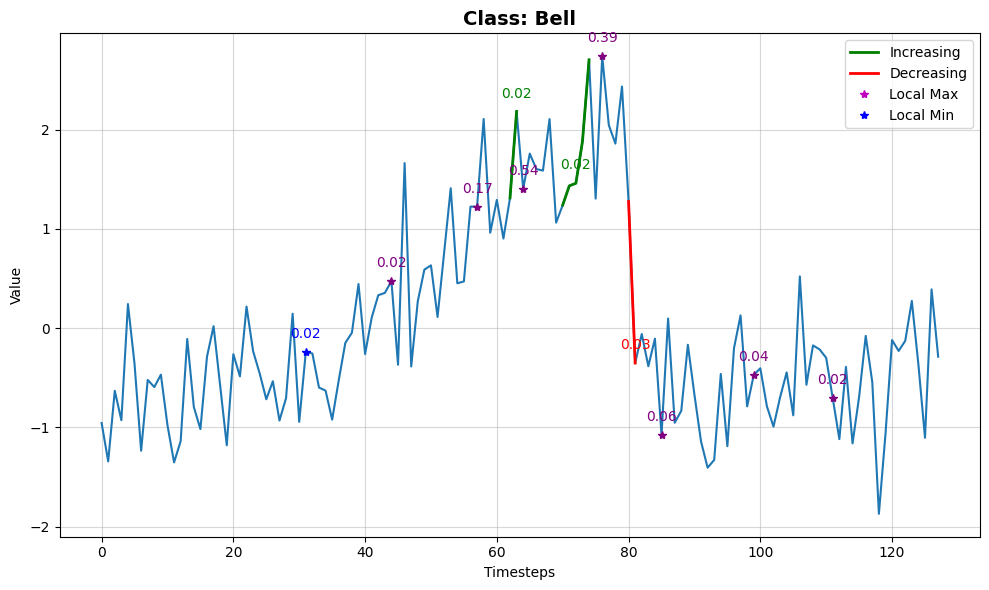

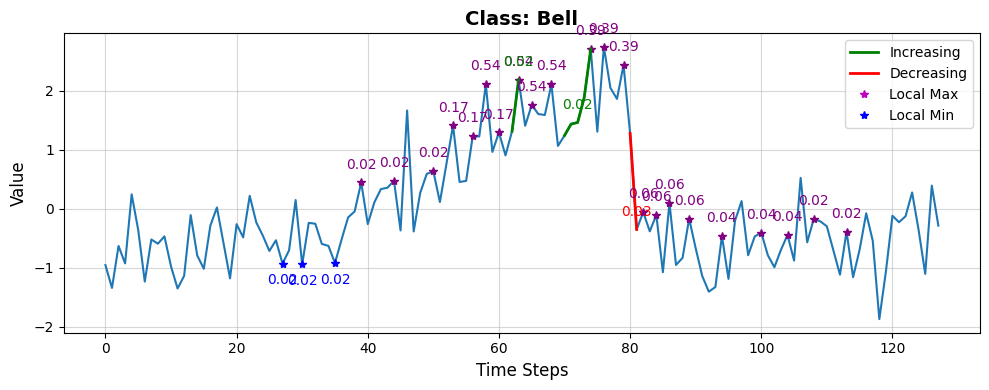

INFO:lomatce.explainer:Starting time series local explanation


Predection probability : tensor([5.2853e-03, 9.9471e-01, 2.0626e-06])
Cylinder:                      0.0053
Bell:                      0.9947
Funnel:                      0.0000


INFO:lomatce.explainer:Perturbed instances shap for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 17640 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 14307 samples)
Optimal number of clusters for Decreasing_ch1: 18
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 35413 samples)
Optimal number of clusters for LocalMax_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 34524 samples)
Optimal number of clusters for LocalMin_ch1: 19


INFO:lomatce.explainer:Final data shape: (1001, 75) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 75


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.97
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.96
INFO:lomatce.explainer:Model Type: Ridge


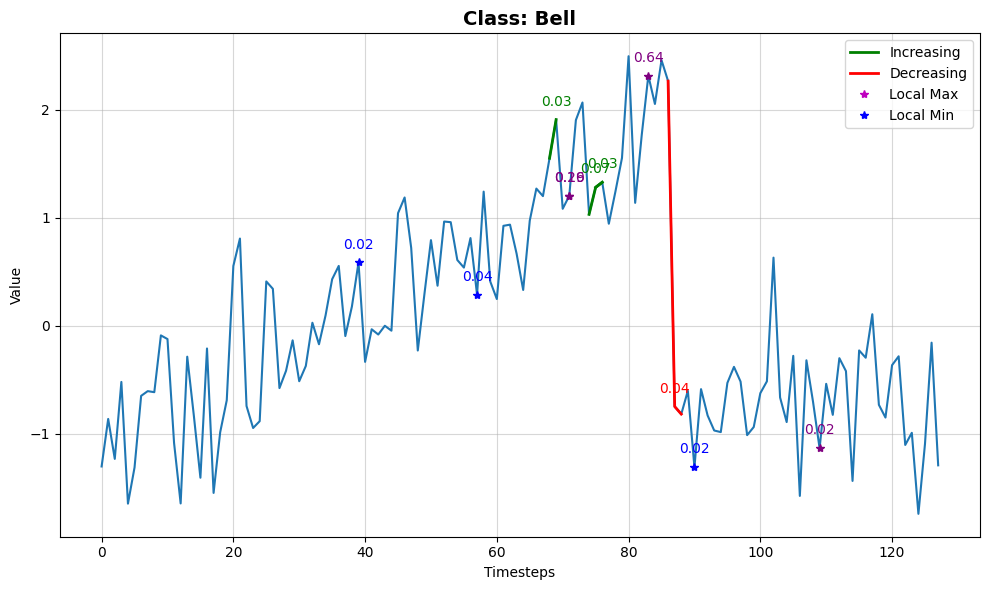

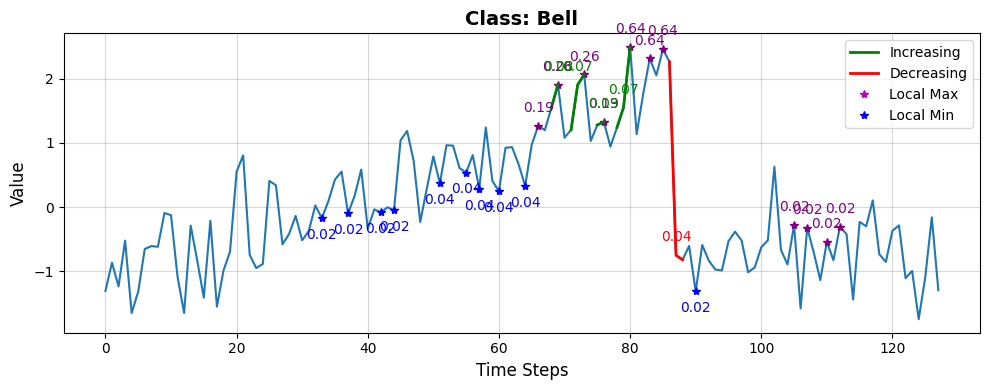

INFO:lomatce.explainer:Starting time series local explanation


Predection probability : tensor([4.2469e-02, 9.5745e-01, 7.8396e-05])
Cylinder:                      0.0425
Bell:                      0.9575
Funnel:                      0.0001


INFO:lomatce.explainer:Perturbed instances shap for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 14899 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 15444 samples)
Optimal number of clusters for Decreasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 36271 samples)
Optimal number of clusters for LocalMax_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 36466 samples)
Optimal number of clusters for LocalMin_ch1: 19


INFO:lomatce.explainer:Final data shape: (1001, 76) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 76


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.99
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.93
INFO:lomatce.explainer:Model Type: Ridge


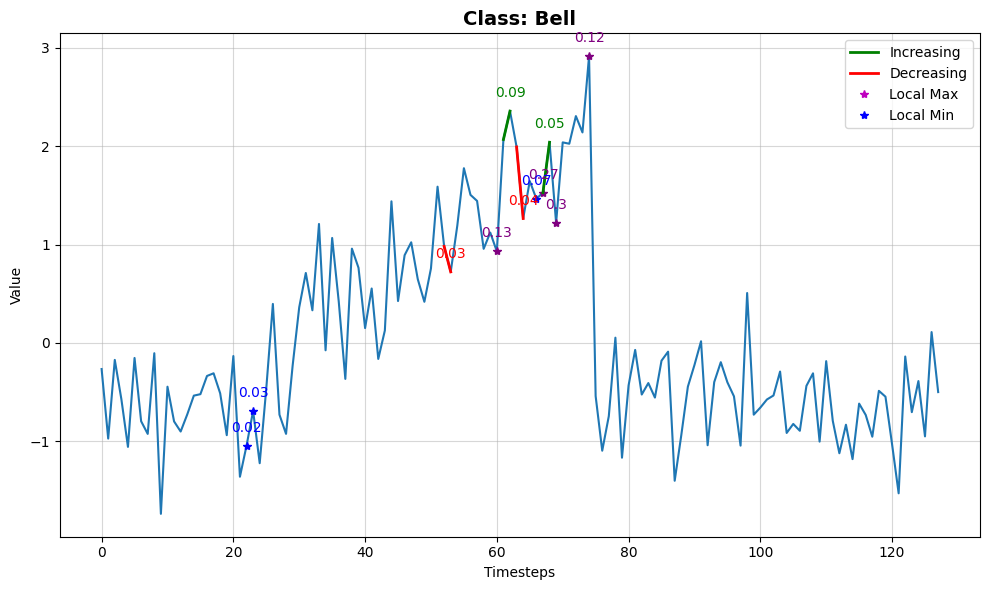

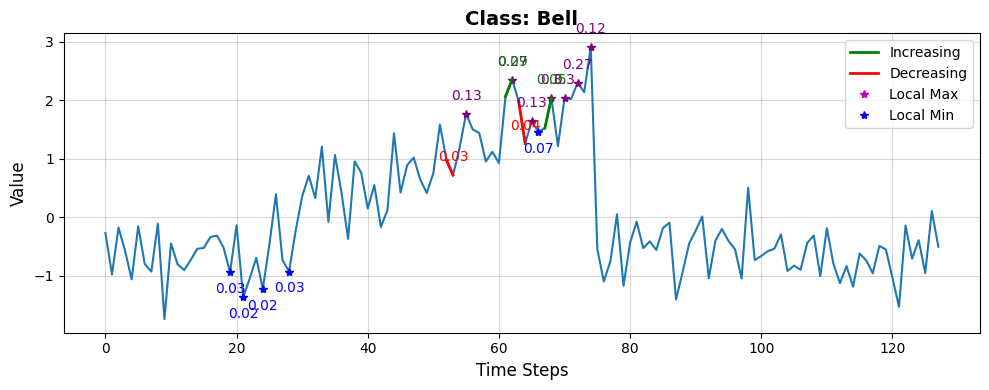

INFO:lomatce.explainer:Starting time series local explanation


Predection probability : tensor([7.2132e-02, 9.2783e-01, 3.6438e-05])
Cylinder:                      0.0721
Bell:                      0.9278
Funnel:                      0.0000


INFO:lomatce.explainer:Perturbed instances shap for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 15363 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 17512 samples)
Optimal number of clusters for Decreasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 33614 samples)
Optimal number of clusters for LocalMax_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 33698 samples)
Optimal number of clusters for LocalMin_ch1: 19


INFO:lomatce.explainer:Final data shape: (1001, 76) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 76


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.7
INFO:lomatce.explainer:Local Prediction (Linear Model): 1.0
INFO:lomatce.explainer:Model Type: Ridge


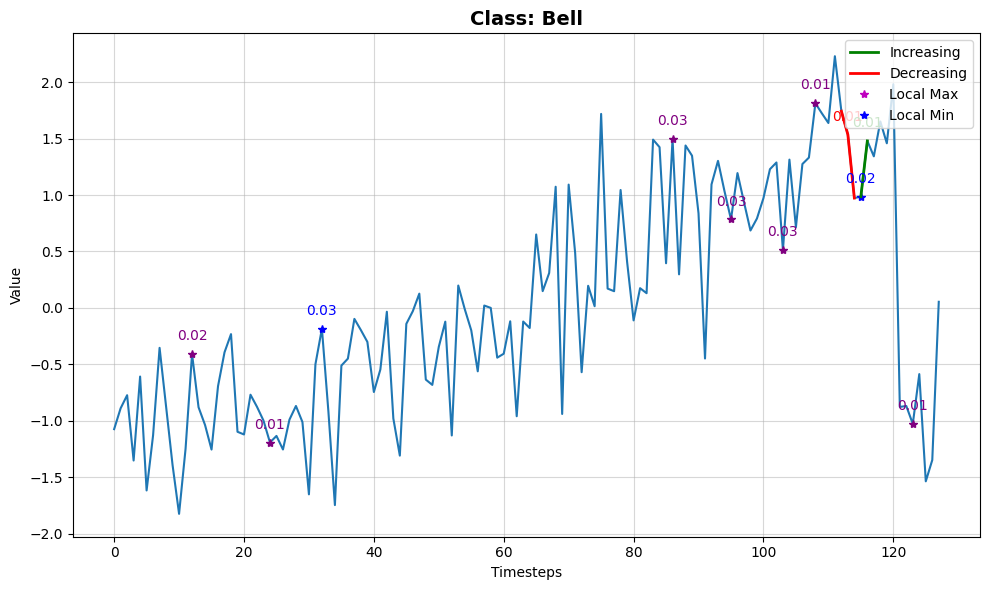

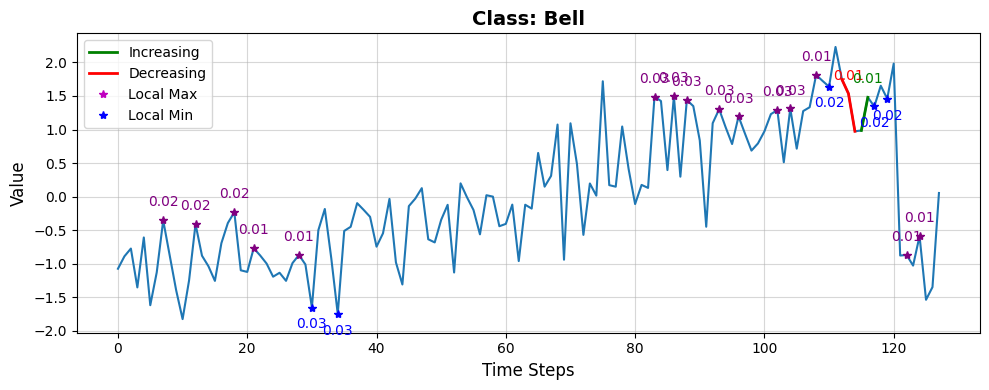

INFO:lomatce.explainer:Starting time series local explanation


Predection probability : tensor([1.6776e-03, 9.9790e-01, 4.2254e-04])
Cylinder:                      0.0017
Bell:                      0.9979
Funnel:                      0.0004


INFO:lomatce.explainer:Perturbed instances shap for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 16045 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 14925 samples)
Optimal number of clusters for Decreasing_ch1: 18
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 36962 samples)
Optimal number of clusters for LocalMax_ch1: 3
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 38001 samples)
Optimal number of clusters for LocalMin_ch1: 19


INFO:lomatce.explainer:Final data shape: (1001, 59) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 59


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.86
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.98
INFO:lomatce.explainer:Model Type: Ridge


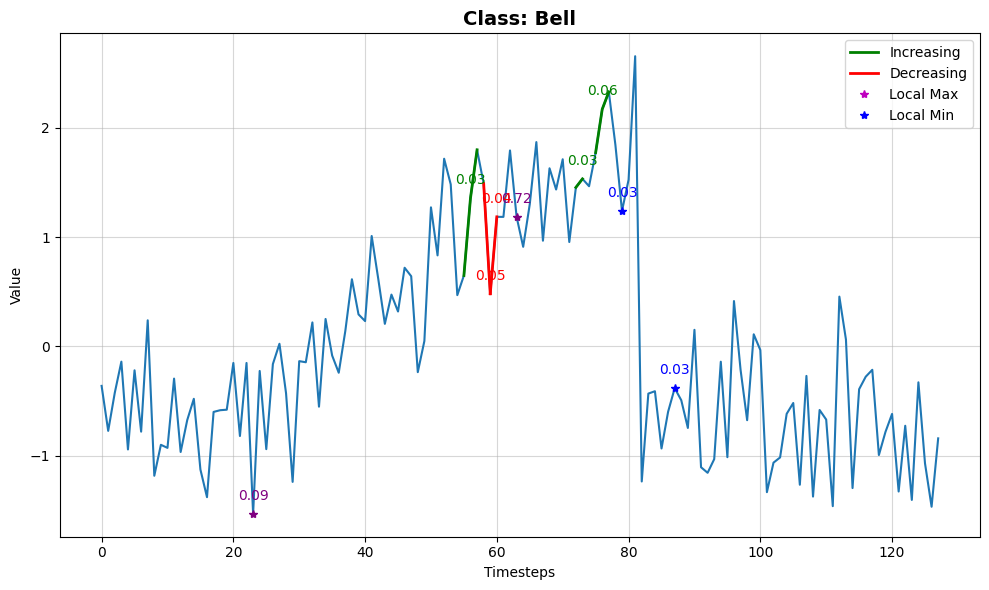

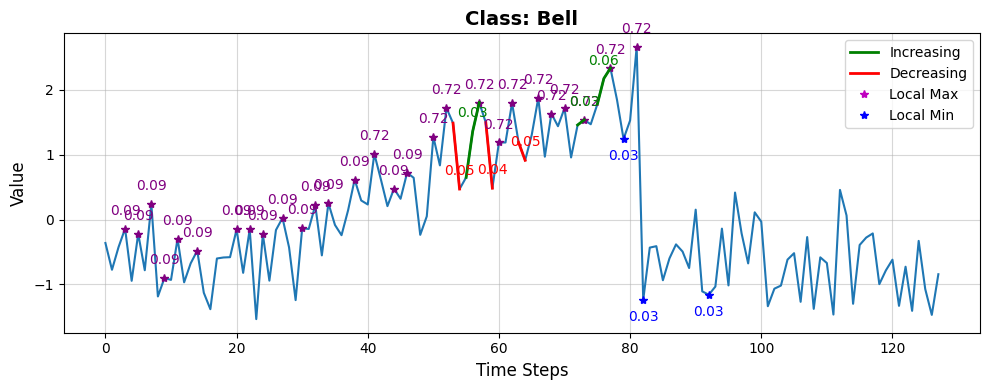

INFO:lomatce.explainer:Starting time series local explanation


Predection probability : tensor([2.5445e-02, 9.7453e-01, 2.0849e-05])
Cylinder:                      0.0254
Bell:                      0.9745
Funnel:                      0.0000


INFO:lomatce.explainer:Perturbed instances shap for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 16556 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 14291 samples)
Optimal number of clusters for Decreasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 36945 samples)
Optimal number of clusters for LocalMax_ch1: 18
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 37085 samples)
Optimal number of clusters for LocalMin_ch1: 19


INFO:lomatce.explainer:Final data shape: (1001, 75) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 75


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.97
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.97
INFO:lomatce.explainer:Model Type: Ridge


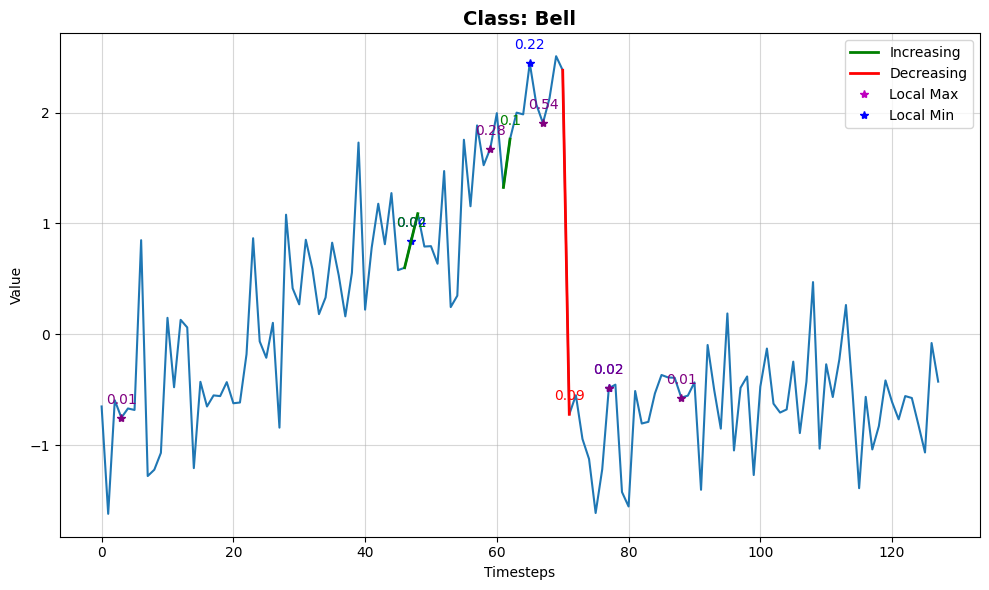

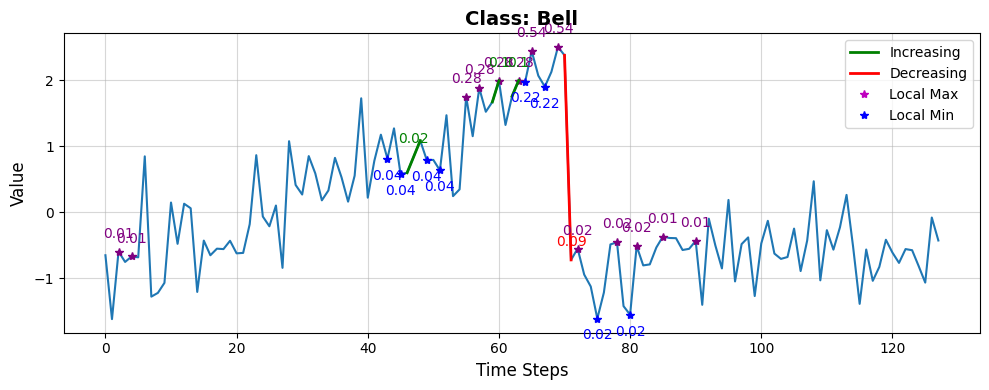

INFO:lomatce.explainer:Starting time series local explanation


Predection probability : tensor([3.5277e-02, 9.6470e-01, 2.6242e-05])
Cylinder:                      0.0353
Bell:                      0.9647
Funnel:                      0.0000


INFO:lomatce.explainer:Perturbed instances shap for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 17677 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 18806 samples)
Optimal number of clusters for Decreasing_ch1: 18
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 29840 samples)
Optimal number of clusters for LocalMax_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 29891 samples)
Optimal number of clusters for LocalMin_ch1: 19


INFO:lomatce.explainer:Final data shape: (1001, 75) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 75


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.85
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.99
INFO:lomatce.explainer:Model Type: Ridge


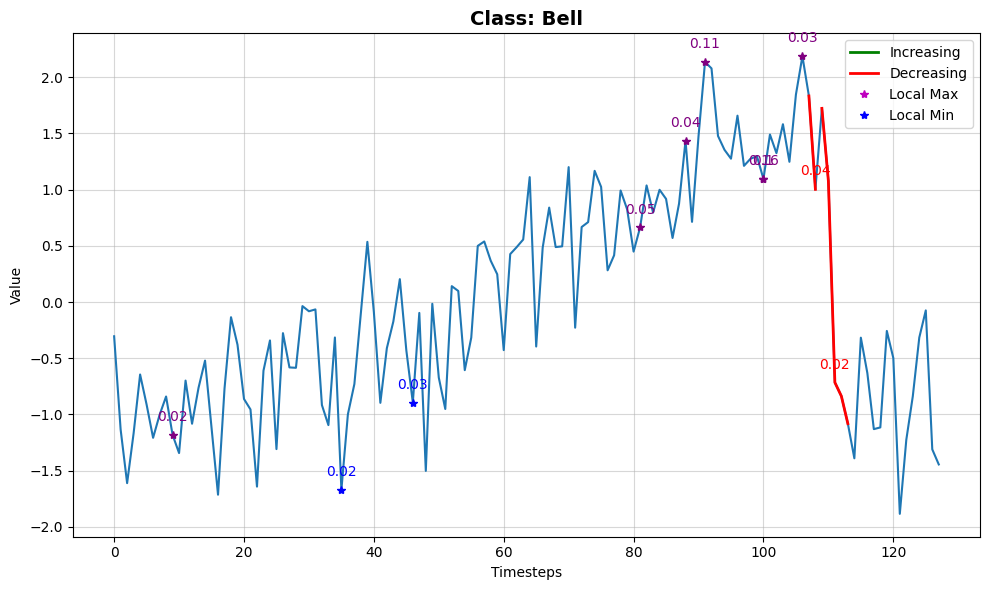

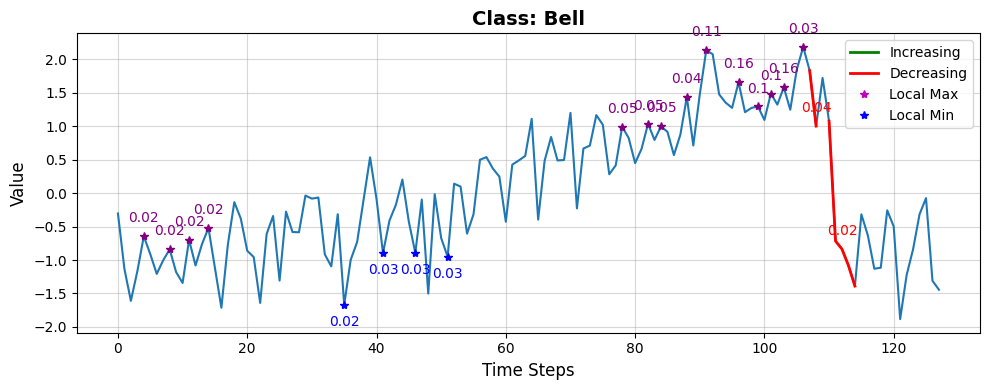

INFO:lomatce.explainer:Starting time series local explanation


Predection probability : tensor([1.2510e-02, 9.8719e-01, 3.0285e-04])
Cylinder:                      0.0125
Bell:                      0.9872
Funnel:                      0.0003


INFO:lomatce.explainer:Perturbed instances shap for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 10761 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 12700 samples)
Optimal number of clusters for Decreasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 38574 samples)
Optimal number of clusters for LocalMax_ch1: 3
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 39718 samples)
Optimal number of clusters for LocalMin_ch1: 3


INFO:lomatce.explainer:Final data shape: (1001, 44) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 44


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.88
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.99
INFO:lomatce.explainer:Model Type: Ridge


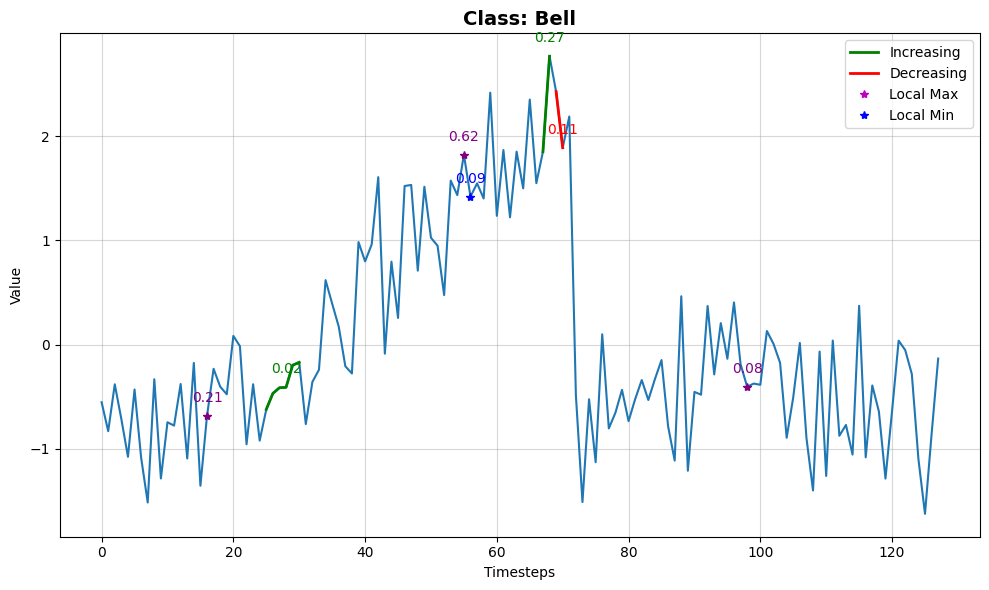

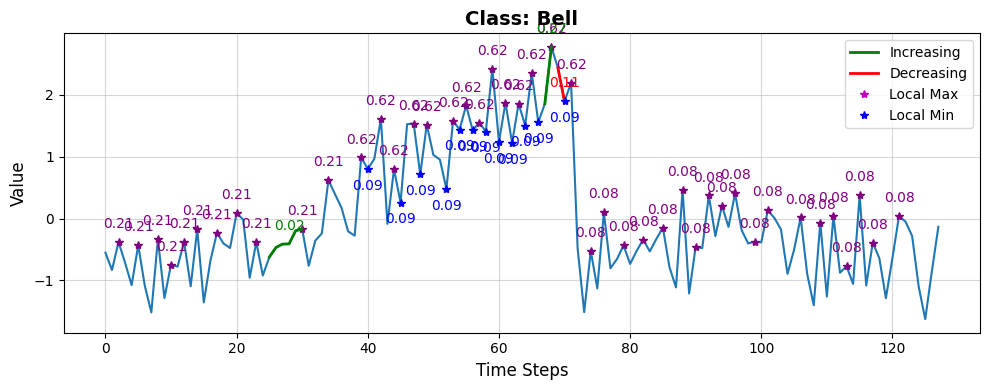

INFO:lomatce.explainer:Starting time series local explanation


Predection probability : tensor([2.5592e-02, 9.7439e-01, 1.5558e-05])
Cylinder:                      0.0256
Bell:                      0.9744
Funnel:                      0.0000


INFO:lomatce.explainer:Perturbed instances shap for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 16116 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 12536 samples)
Optimal number of clusters for Decreasing_ch1: 18
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 35994 samples)
Optimal number of clusters for LocalMax_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 36913 samples)
Optimal number of clusters for LocalMin_ch1: 18


INFO:lomatce.explainer:Final data shape: (1001, 74) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 74


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.8
INFO:lomatce.explainer:Local Prediction (Linear Model): 1.0
INFO:lomatce.explainer:Model Type: Ridge


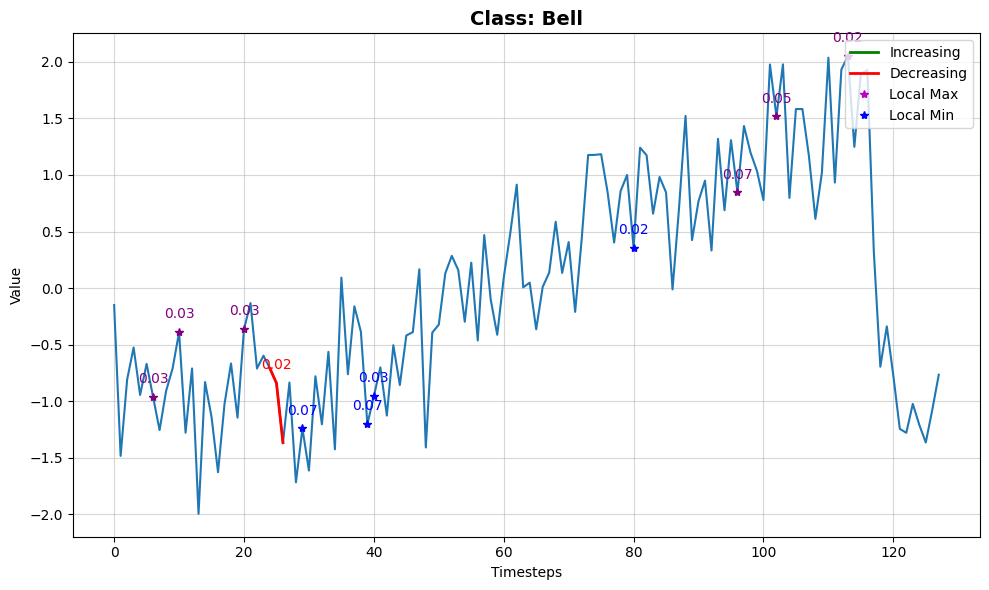

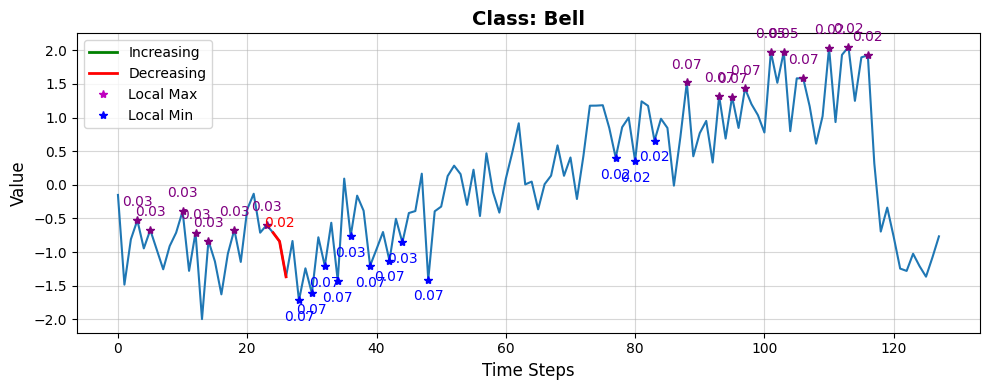

INFO:lomatce.explainer:Starting time series local explanation


Predection probability : tensor([2.9756e-03, 9.9660e-01, 4.2389e-04])
Cylinder:                      0.0030
Bell:                      0.9966
Funnel:                      0.0004

📈 Global Faithfulness (Avg Local Fidelity): 0.8335

=== Running SP-LOMATCE for class Funnel ===


INFO:lomatce.explainer:Perturbed instances shap for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 16231 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 14302 samples)
Optimal number of clusters for Decreasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 38124 samples)
Optimal number of clusters for LocalMax_ch1: 3
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 38070 samples)
Optimal number of clusters for LocalMin_ch1: 18


INFO:lomatce.explainer:Final data shape: (1001, 59) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 59


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.94
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.94
INFO:lomatce.explainer:Model Type: Ridge


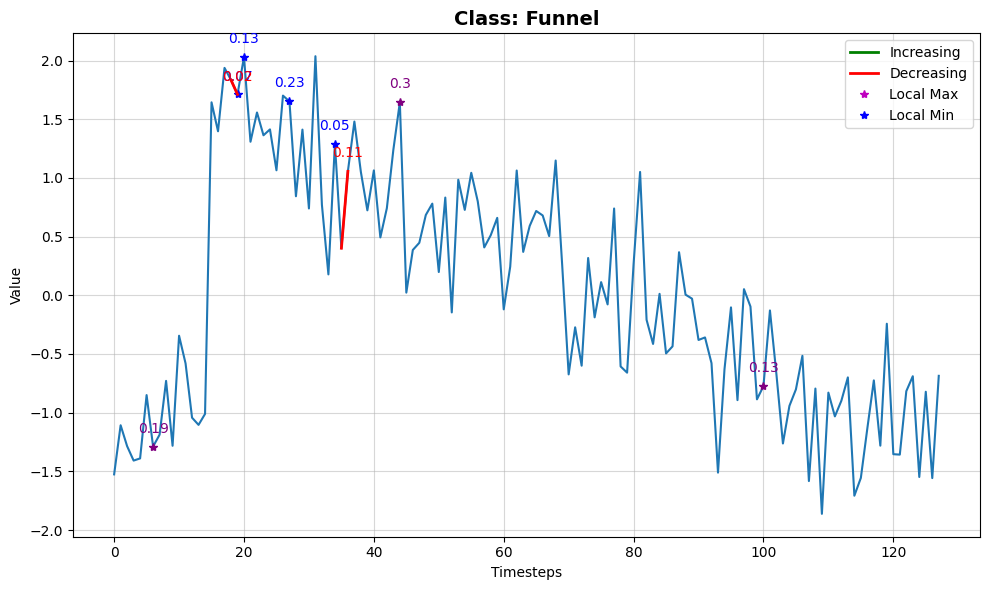

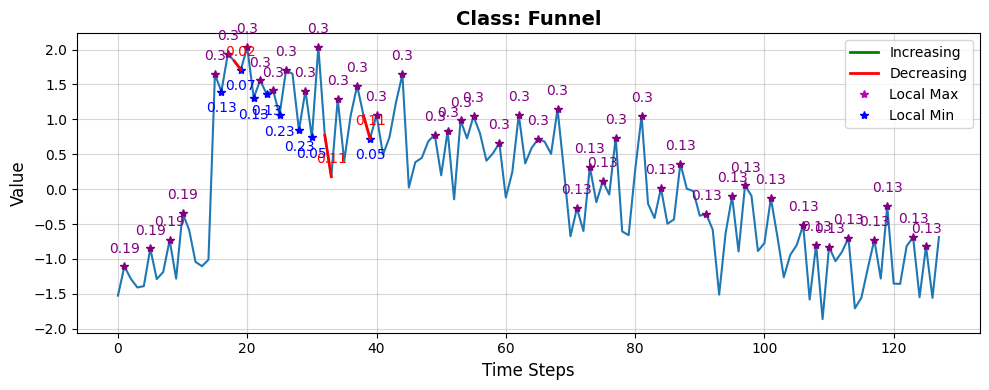

INFO:lomatce.explainer:Starting time series local explanation


Predection probability : tensor([7.1797e-02, 7.5417e-05, 9.2813e-01])
Cylinder:                      0.0718
Bell:                      0.0001
Funnel:                      0.9281


INFO:lomatce.explainer:Perturbed instances shap for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 13727 samples)
Optimal number of clusters for Increasing_ch1: 18
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 14080 samples)
Optimal number of clusters for Decreasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 37022 samples)
Optimal number of clusters for LocalMax_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 38016 samples)
Optimal number of clusters for LocalMin_ch1: 3


INFO:lomatce.explainer:Final data shape: (1001, 59) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 59


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.99
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.93
INFO:lomatce.explainer:Model Type: Ridge


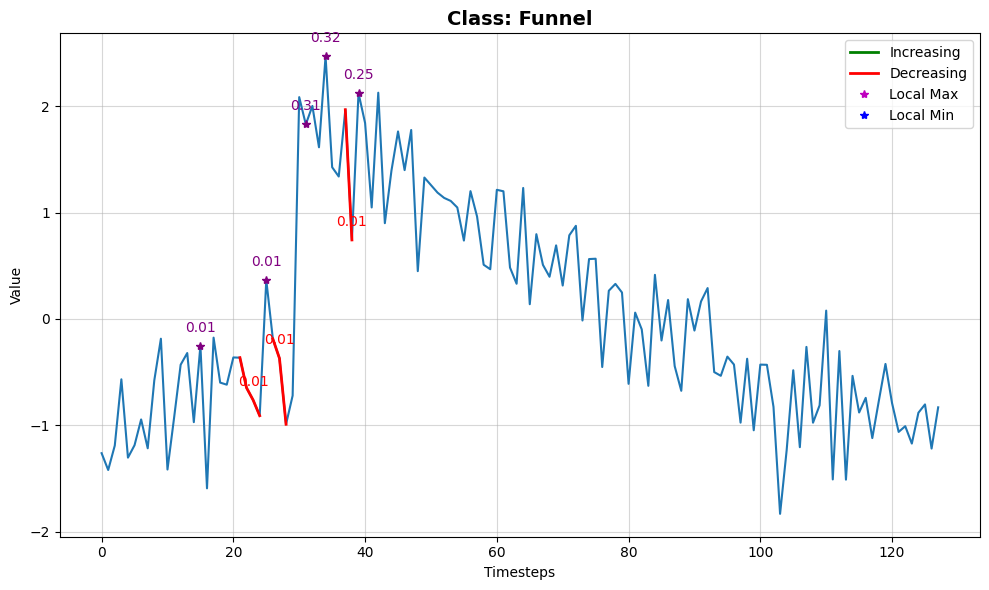

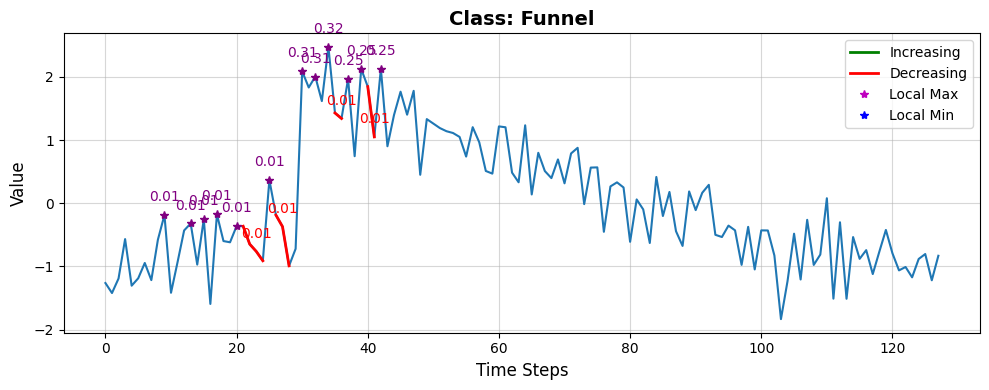

INFO:lomatce.explainer:Starting time series local explanation


Predection probability : tensor([6.9620e-02, 1.3029e-04, 9.3025e-01])
Cylinder:                      0.0696
Bell:                      0.0001
Funnel:                      0.9302


INFO:lomatce.explainer:Perturbed instances shap for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 13346 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 15284 samples)
Optimal number of clusters for Decreasing_ch1: 17
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 36213 samples)
Optimal number of clusters for LocalMax_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 36111 samples)
Optimal number of clusters for LocalMin_ch1: 16


INFO:lomatce.explainer:Final data shape: (1001, 71) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 71


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.97
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.95
INFO:lomatce.explainer:Model Type: Ridge


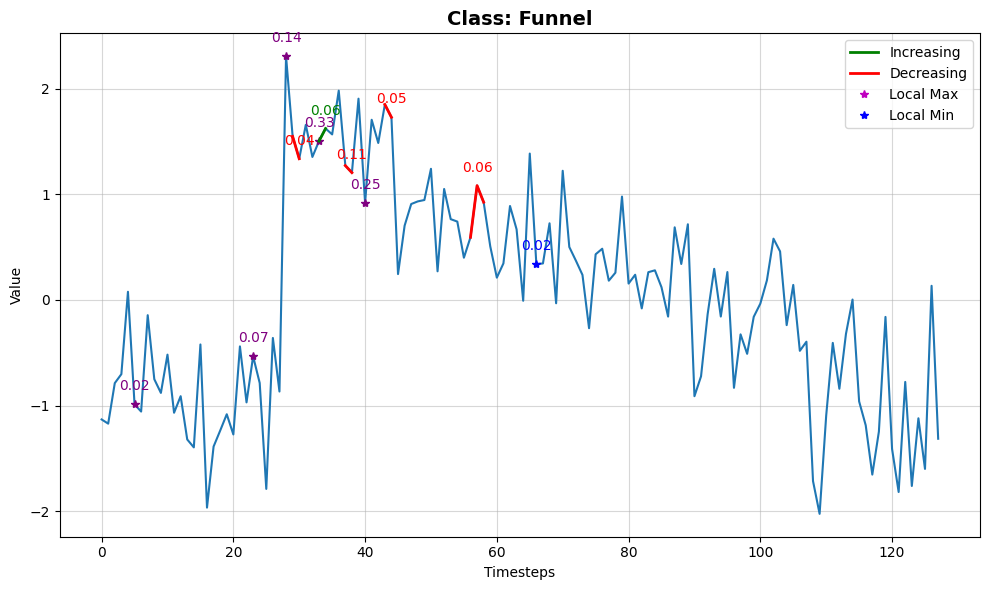

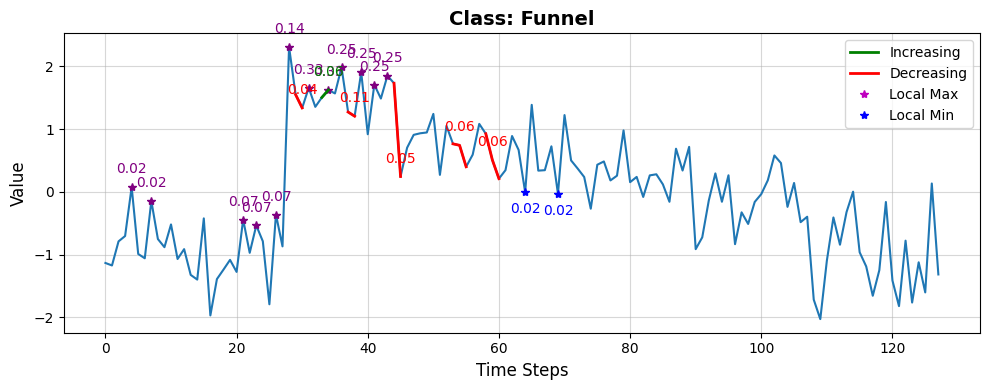

INFO:lomatce.explainer:Starting time series local explanation


Predection probability : tensor([5.4783e-02, 4.2525e-05, 9.4517e-01])
Cylinder:                      0.0548
Bell:                      0.0000
Funnel:                      0.9452


INFO:lomatce.explainer:Perturbed instances shap for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 13573 samples)
Optimal number of clusters for Increasing_ch1: 18
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 16208 samples)
Optimal number of clusters for Decreasing_ch1: 17
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 37880 samples)
Optimal number of clusters for LocalMax_ch1: 18
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 36973 samples)
Optimal number of clusters for LocalMin_ch1: 18


INFO:lomatce.explainer:Final data shape: (1001, 71) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 71


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.93
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.99
INFO:lomatce.explainer:Model Type: Ridge


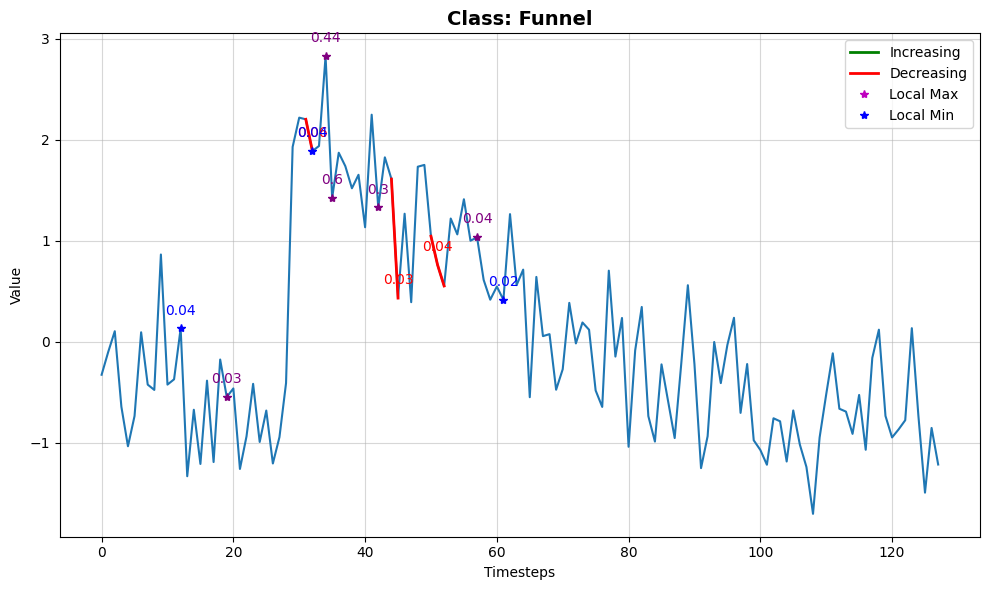

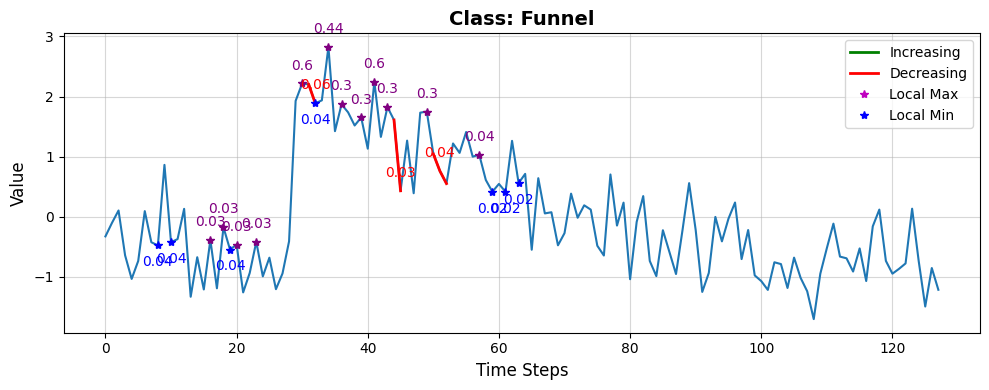

INFO:lomatce.explainer:Starting time series local explanation


Predection probability : tensor([7.4331e-03, 1.7665e-05, 9.9255e-01])
Cylinder:                      0.0074
Bell:                      0.0000
Funnel:                      0.9925


INFO:lomatce.explainer:Perturbed instances shap for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 16858 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 12556 samples)
Optimal number of clusters for Decreasing_ch1: 18
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 34878 samples)
Optimal number of clusters for LocalMax_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 35994 samples)
Optimal number of clusters for LocalMin_ch1: 19


INFO:lomatce.explainer:Final data shape: (1001, 75) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 75


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.74
INFO:lomatce.explainer:Local Prediction (Linear Model): 1.01
INFO:lomatce.explainer:Model Type: Ridge


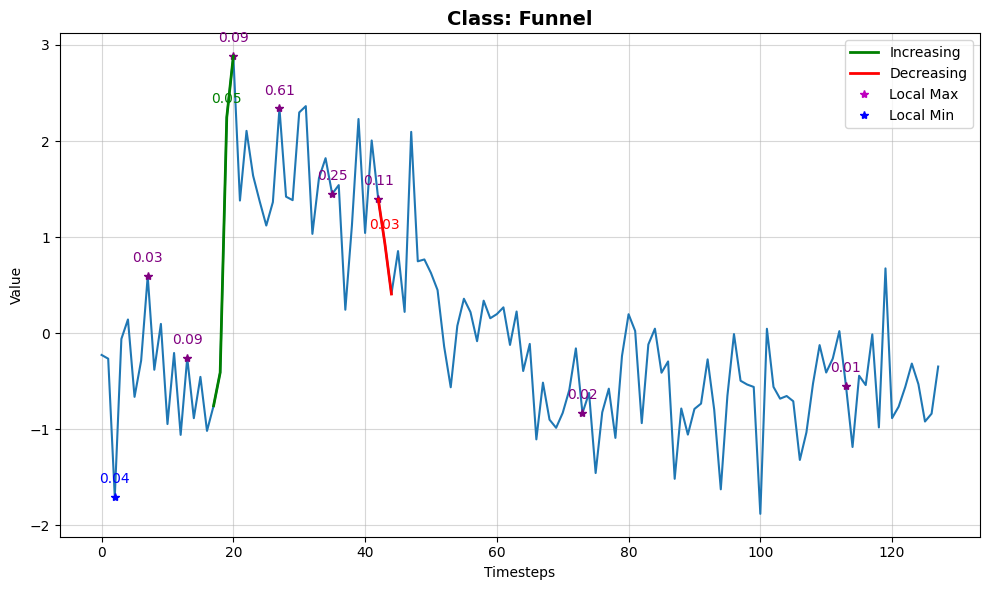

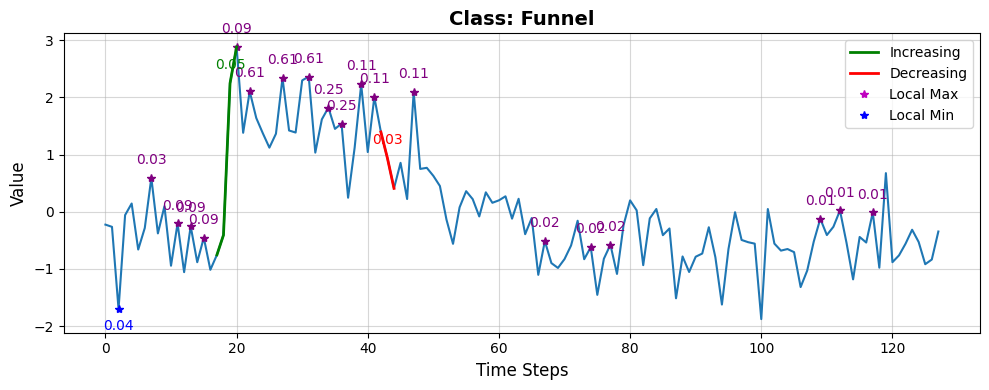

INFO:lomatce.explainer:Starting time series local explanation


Predection probability : tensor([3.8989e-04, 8.8336e-07, 9.9961e-01])
Cylinder:                      0.0004
Bell:                      0.0000
Funnel:                      0.9996


INFO:lomatce.explainer:Perturbed instances shap for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 14303 samples)
Optimal number of clusters for Increasing_ch1: 18
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 17796 samples)
Optimal number of clusters for Decreasing_ch1: 17
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 35049 samples)
Optimal number of clusters for LocalMax_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 35244 samples)
Optimal number of clusters for LocalMin_ch1: 19


INFO:lomatce.explainer:Final data shape: (1001, 73) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 73


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.66
INFO:lomatce.explainer:Local Prediction (Linear Model): 1.01
INFO:lomatce.explainer:Model Type: Ridge


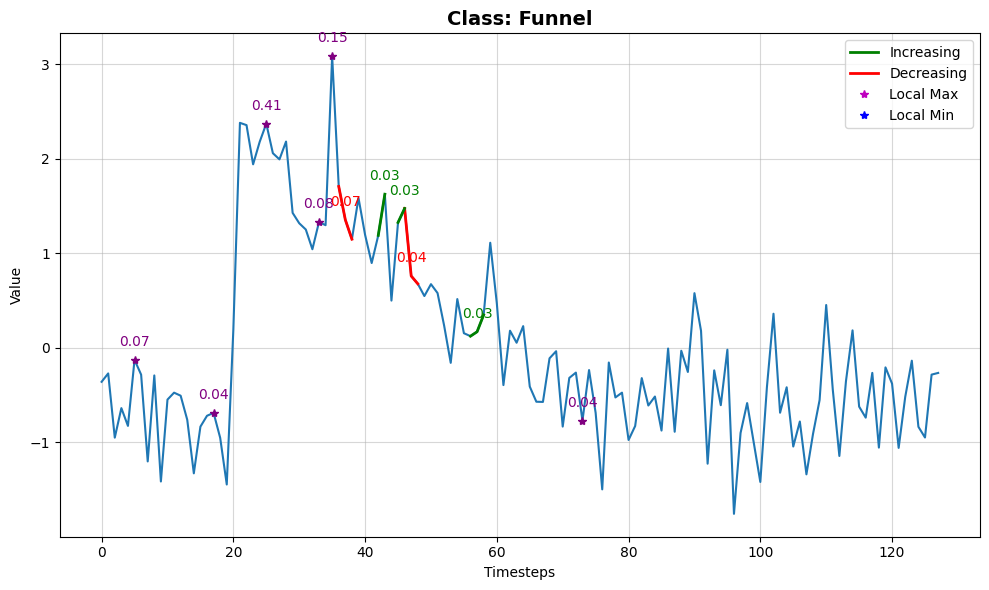

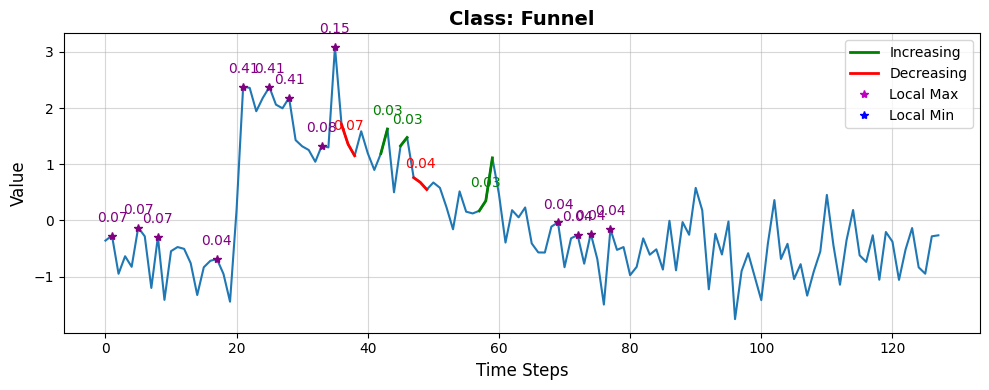

INFO:lomatce.explainer:Starting time series local explanation


Predection probability : tensor([3.2504e-04, 5.2160e-07, 9.9967e-01])
Cylinder:                      0.0003
Bell:                      0.0000
Funnel:                      0.9997


INFO:lomatce.explainer:Perturbed instances shap for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 17656 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 14197 samples)
Optimal number of clusters for Decreasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 35861 samples)
Optimal number of clusters for LocalMax_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 36956 samples)
Optimal number of clusters for LocalMin_ch1: 18


INFO:lomatce.explainer:Final data shape: (1001, 75) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 75


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.96
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.98
INFO:lomatce.explainer:Model Type: Ridge


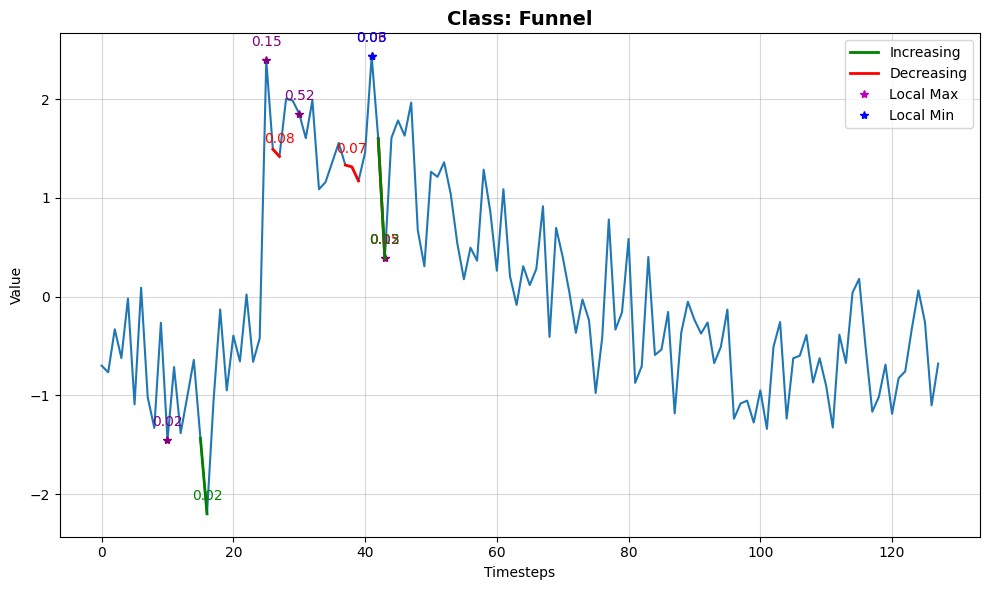

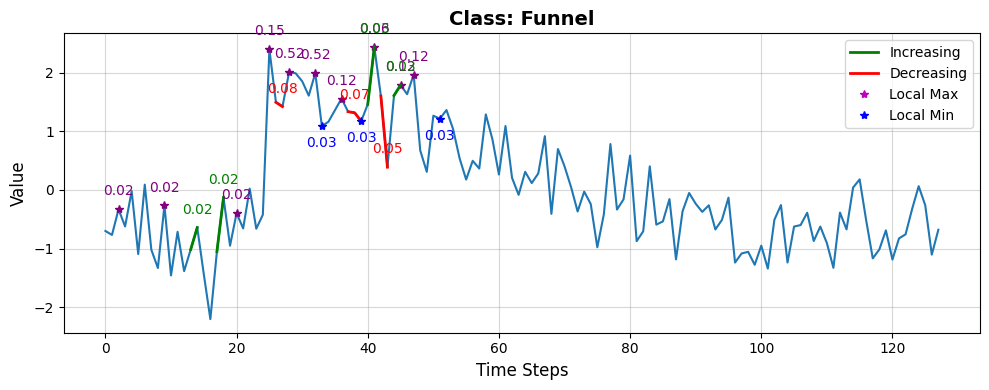

INFO:lomatce.explainer:Starting time series local explanation


Predection probability : tensor([1.5617e-02, 1.3219e-05, 9.8437e-01])
Cylinder:                      0.0156
Bell:                      0.0000
Funnel:                      0.9844


INFO:lomatce.explainer:Perturbed instances shap for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 11884 samples)
Optimal number of clusters for Increasing_ch1: 18
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 17132 samples)
Optimal number of clusters for Decreasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 35606 samples)
Optimal number of clusters for LocalMax_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 34813 samples)
Optimal number of clusters for LocalMin_ch1: 18


INFO:lomatce.explainer:Final data shape: (1001, 74) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 74


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.84
INFO:lomatce.explainer:Local Prediction (Linear Model): 1.01
INFO:lomatce.explainer:Model Type: Ridge


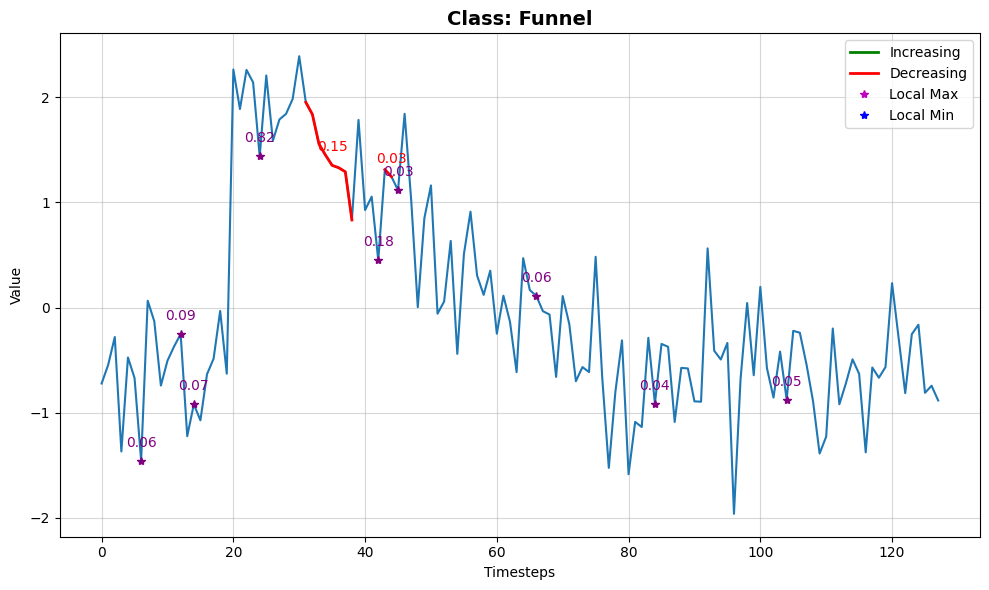

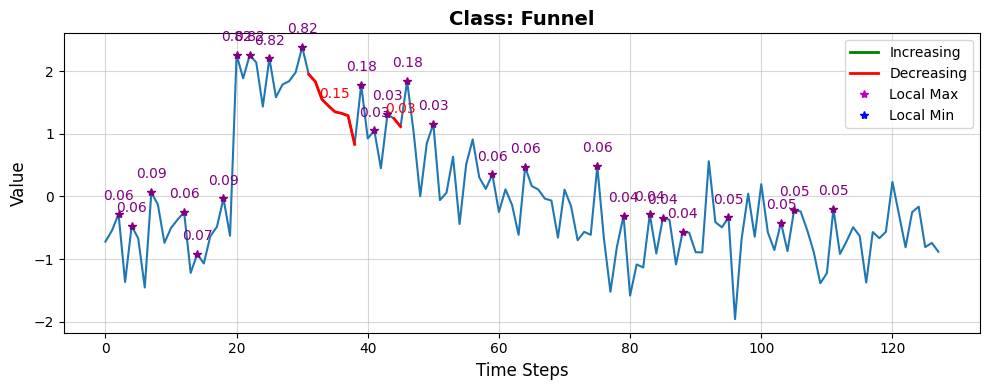

INFO:lomatce.explainer:Starting time series local explanation


Predection probability : tensor([7.4041e-04, 4.9364e-07, 9.9926e-01])
Cylinder:                      0.0007
Bell:                      0.0000
Funnel:                      0.9993


INFO:lomatce.explainer:Perturbed instances shap for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 16823 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 10737 samples)
Optimal number of clusters for Decreasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 37054 samples)
Optimal number of clusters for LocalMax_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 37257 samples)
Optimal number of clusters for LocalMin_ch1: 19


INFO:lomatce.explainer:Final data shape: (1001, 76) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 76


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.76
INFO:lomatce.explainer:Local Prediction (Linear Model): 1.01
INFO:lomatce.explainer:Model Type: Ridge


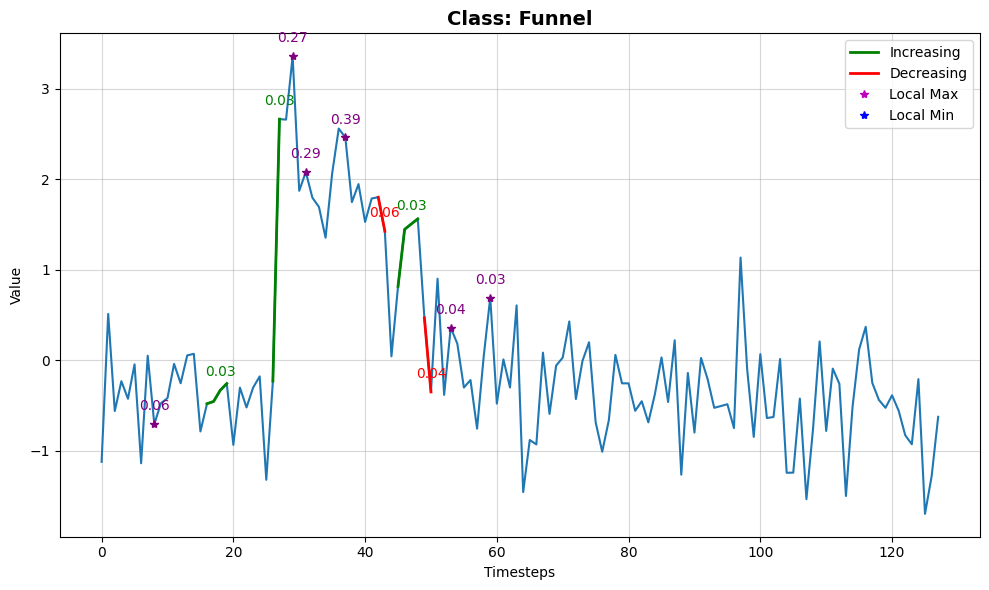

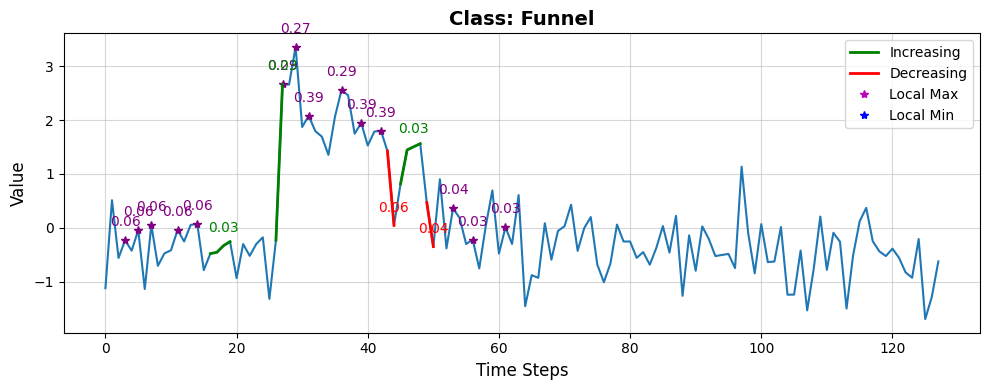

INFO:lomatce.explainer:Starting time series local explanation


Predection probability : tensor([3.5385e-05, 1.3824e-07, 9.9996e-01])
Cylinder:                      0.0000
Bell:                      0.0000
Funnel:                      1.0000


INFO:lomatce.explainer:Perturbed instances shap for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 15139 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 15304 samples)
Optimal number of clusters for Decreasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 35264 samples)
Optimal number of clusters for LocalMax_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 34167 samples)
Optimal number of clusters for LocalMin_ch1: 19


INFO:lomatce.explainer:Final data shape: (1001, 76) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 76


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.88
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.99
INFO:lomatce.explainer:Model Type: Ridge


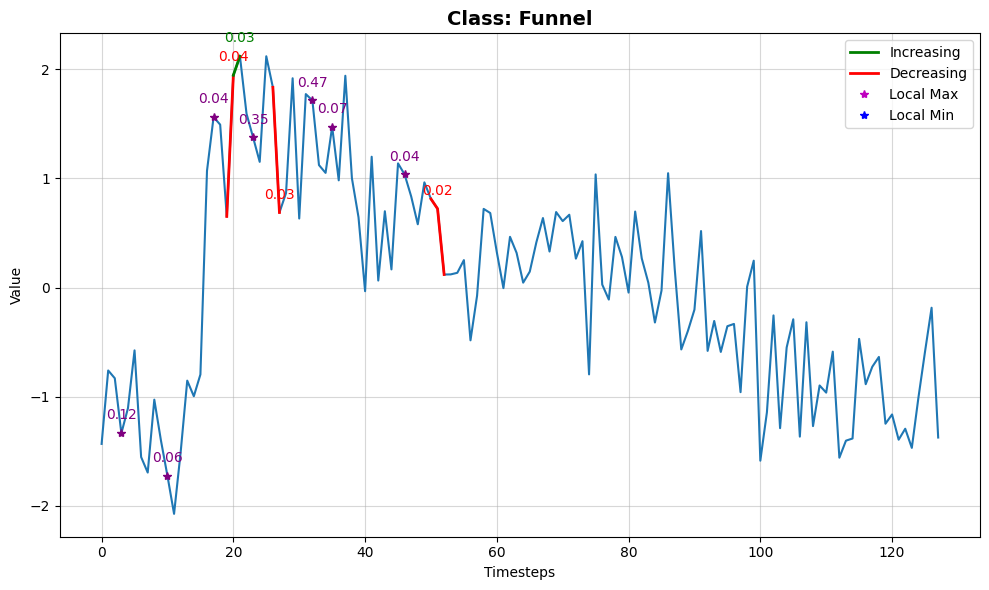

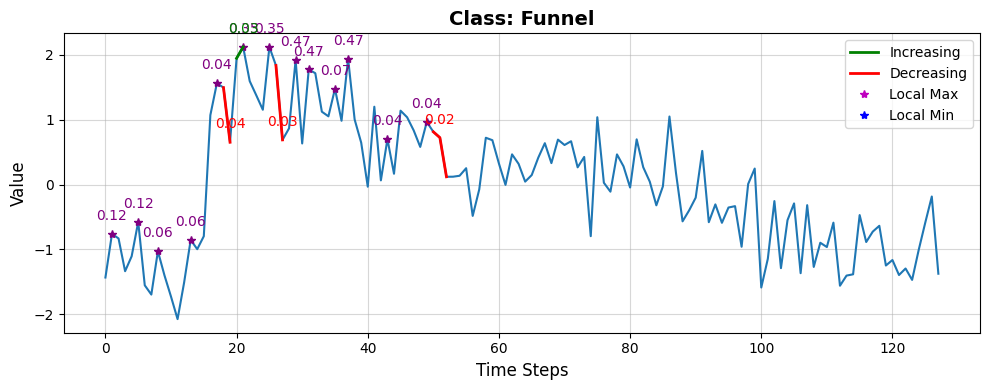

INFO:lomatce.explainer:Starting time series local explanation


Predection probability : tensor([1.3776e-02, 6.6310e-06, 9.8622e-01])
Cylinder:                      0.0138
Bell:                      0.0000
Funnel:                      0.9862


INFO:lomatce.explainer:Perturbed instances shap for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 14928 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 17818 samples)
Optimal number of clusters for Decreasing_ch1: 18
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 32568 samples)
Optimal number of clusters for LocalMax_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 32468 samples)
Optimal number of clusters for LocalMin_ch1: 18


INFO:lomatce.explainer:Final data shape: (1001, 74) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 74


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.98
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.75
INFO:lomatce.explainer:Model Type: Ridge


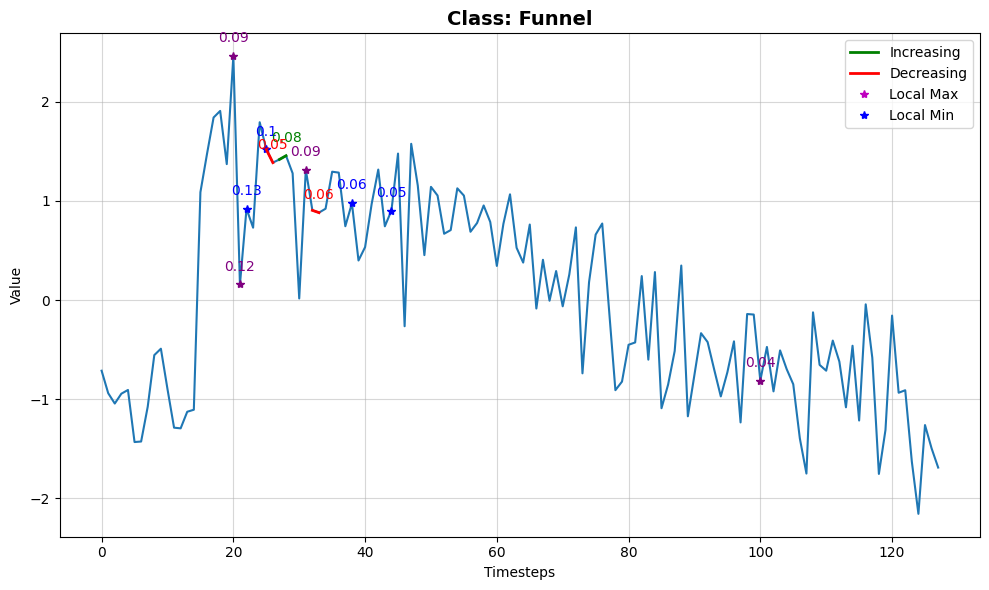

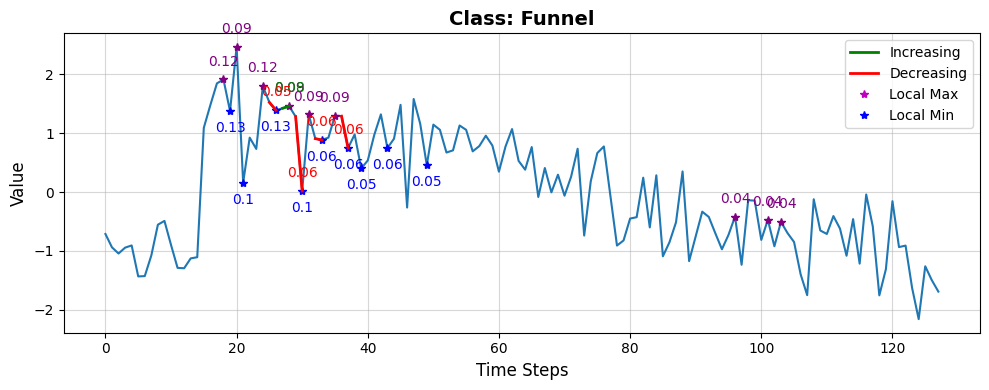

INFO:lomatce.explainer:Starting time series local explanation


Predection probability : tensor([2.6223e-01, 3.9140e-04, 7.3738e-01])
Cylinder:                      0.2622
Bell:                      0.0004
Funnel:                      0.7374


INFO:lomatce.explainer:Perturbed instances shap for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 13494 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 14993 samples)
Optimal number of clusters for Decreasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 35912 samples)
Optimal number of clusters for LocalMax_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 37090 samples)
Optimal number of clusters for LocalMin_ch1: 19


INFO:lomatce.explainer:Final data shape: (1001, 76) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 76


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.77
INFO:lomatce.explainer:Local Prediction (Linear Model): 1.0
INFO:lomatce.explainer:Model Type: Ridge


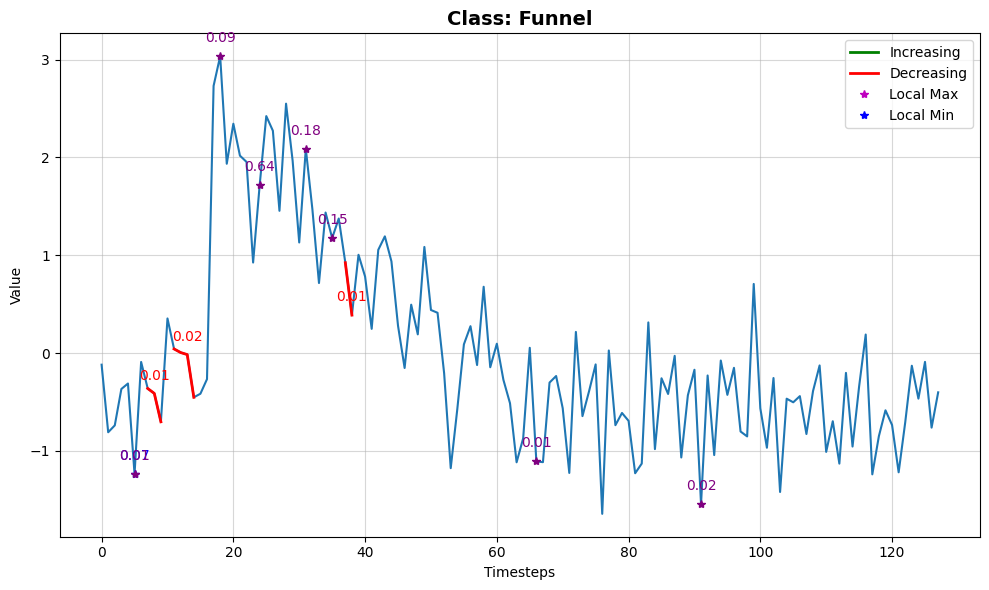

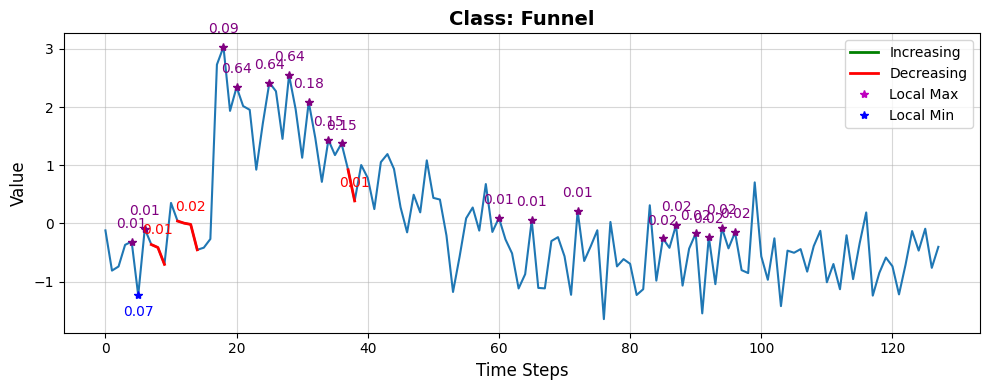

INFO:lomatce.explainer:Starting time series local explanation


Predection probability : tensor([1.3732e-04, 1.3910e-06, 9.9986e-01])
Cylinder:                      0.0001
Bell:                      0.0000
Funnel:                      0.9999


INFO:lomatce.explainer:Perturbed instances shap for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 10661 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 16260 samples)
Optimal number of clusters for Decreasing_ch1: 17
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 37797 samples)
Optimal number of clusters for LocalMax_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 37716 samples)
Optimal number of clusters for LocalMin_ch1: 18


INFO:lomatce.explainer:Final data shape: (1001, 73) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 73


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.93
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.99
INFO:lomatce.explainer:Model Type: Ridge


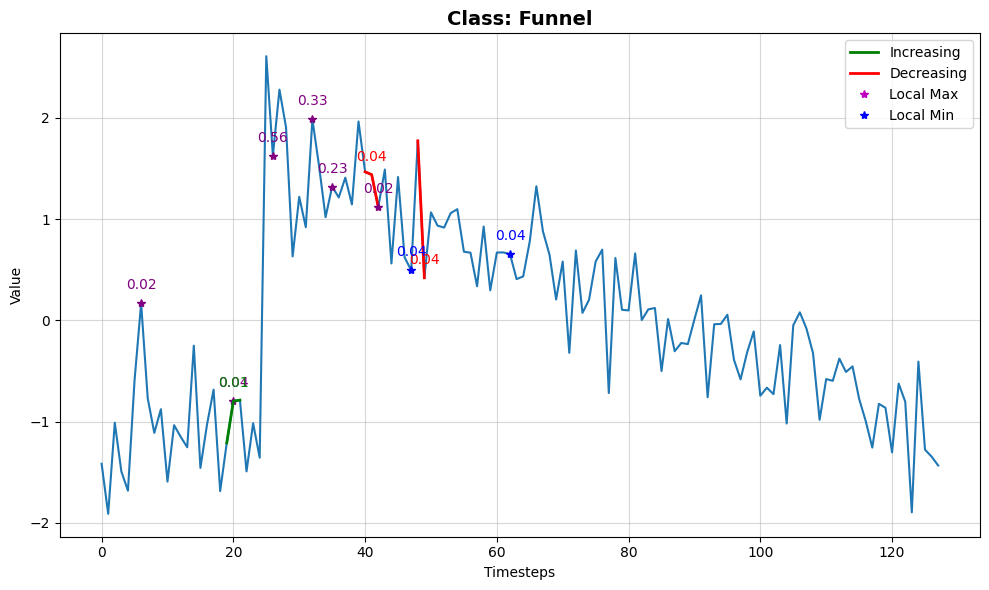

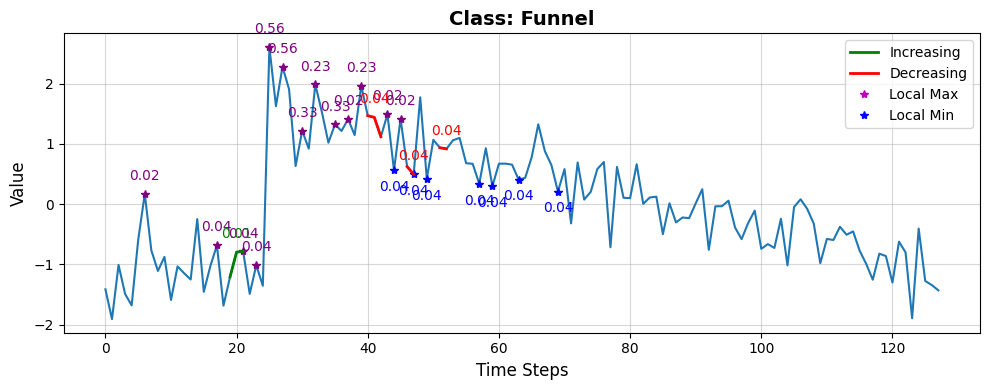

INFO:lomatce.explainer:Starting time series local explanation


Predection probability : tensor([1.5644e-02, 2.1118e-05, 9.8434e-01])
Cylinder:                      0.0156
Bell:                      0.0000
Funnel:                      0.9843


INFO:lomatce.explainer:Perturbed instances shap for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 14422 samples)
Optimal number of clusters for Increasing_ch1: 17
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 14232 samples)
Optimal number of clusters for Decreasing_ch1: 17
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 34459 samples)
Optimal number of clusters for LocalMax_ch1: 17
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 34600 samples)
Optimal number of clusters for LocalMin_ch1: 19


INFO:lomatce.explainer:Final data shape: (1001, 70) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 70


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.91
INFO:lomatce.explainer:Local Prediction (Linear Model): 1.0
INFO:lomatce.explainer:Model Type: Ridge


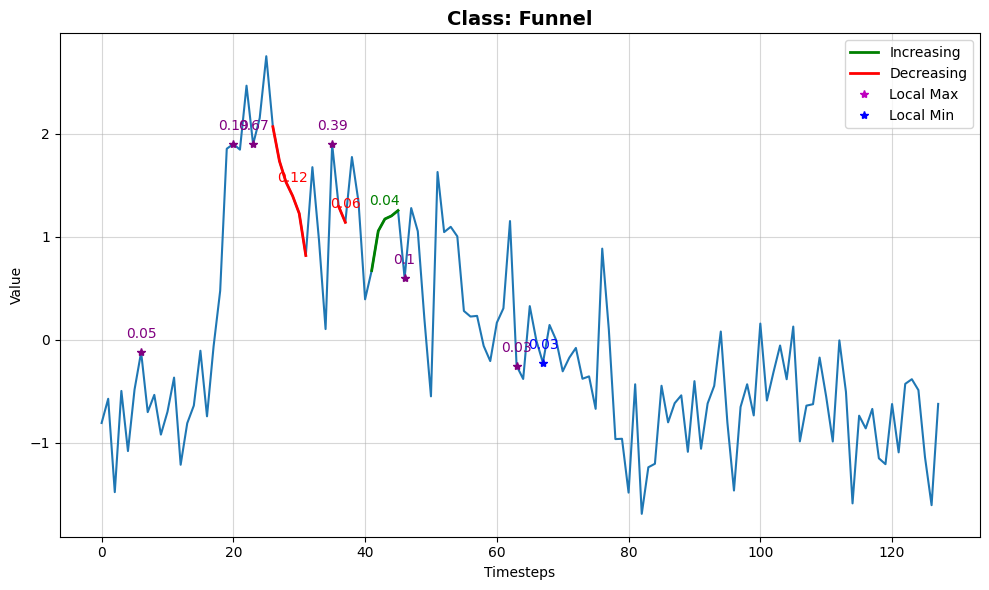

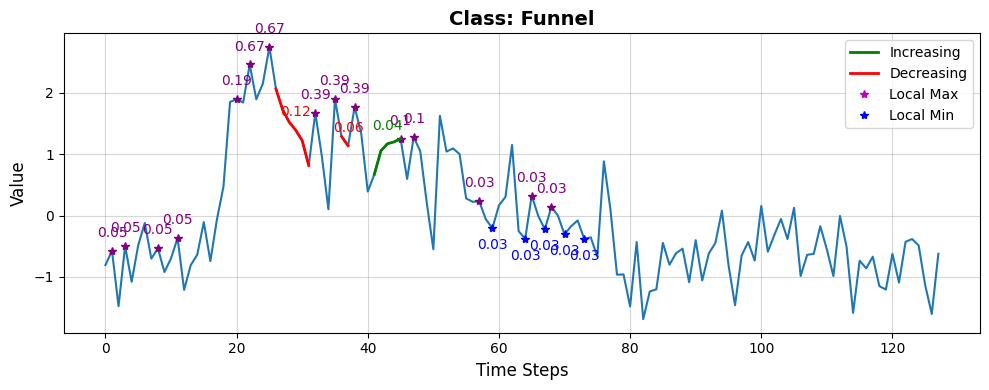

INFO:lomatce.explainer:Starting time series local explanation


Predection probability : tensor([3.7825e-03, 4.5977e-06, 9.9621e-01])
Cylinder:                      0.0038
Bell:                      0.0000
Funnel:                      0.9962


INFO:lomatce.explainer:Perturbed instances shap for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 15184 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 17042 samples)
Optimal number of clusters for Decreasing_ch1: 17
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 35173 samples)
Optimal number of clusters for LocalMax_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 35354 samples)
Optimal number of clusters for LocalMin_ch1: 17


INFO:lomatce.explainer:Final data shape: (1001, 72) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 72


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.75
INFO:lomatce.explainer:Local Prediction (Linear Model): 1.0
INFO:lomatce.explainer:Model Type: Ridge


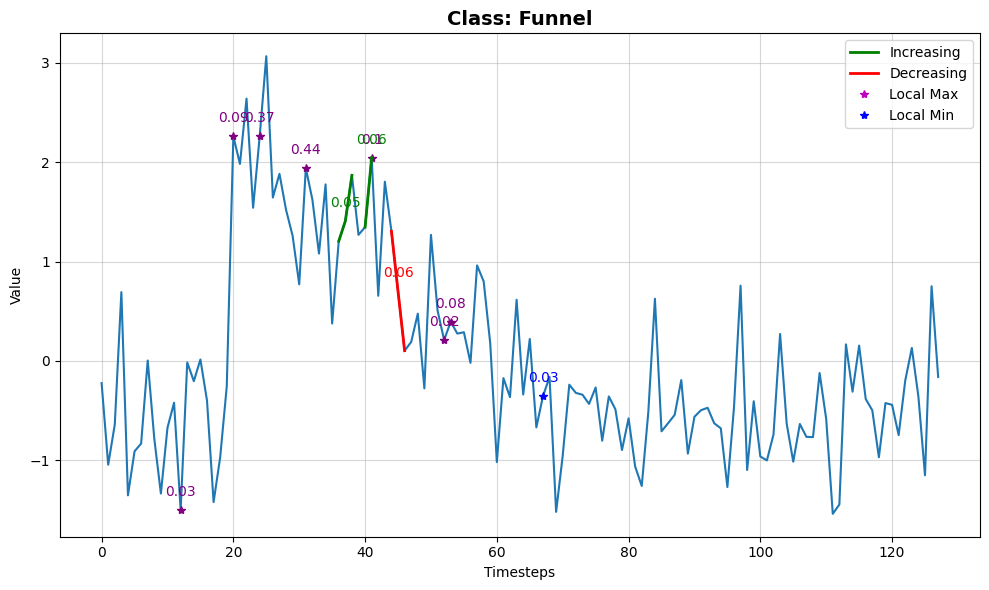

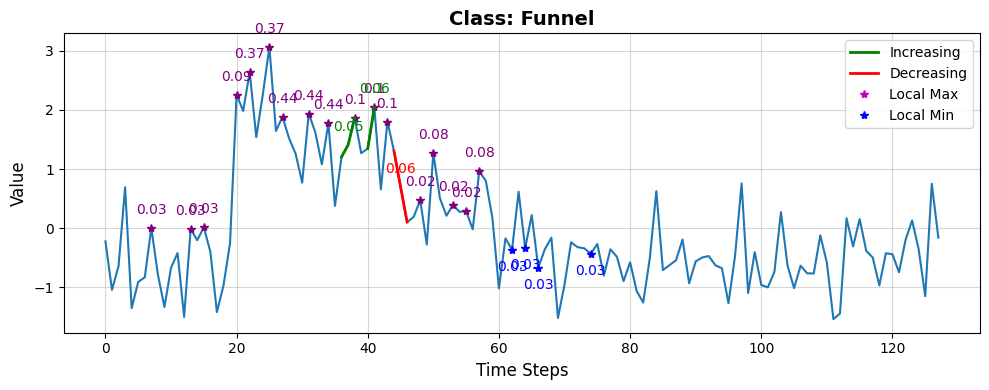

INFO:lomatce.explainer:Starting time series local explanation


Predection probability : tensor([5.6425e-04, 1.6708e-06, 9.9943e-01])
Cylinder:                      0.0006
Bell:                      0.0000
Funnel:                      0.9994


INFO:lomatce.explainer:Perturbed instances shap for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 13695 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 12566 samples)
Optimal number of clusters for Decreasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 36847 samples)
Optimal number of clusters for LocalMax_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 36786 samples)
Optimal number of clusters for LocalMin_ch1: 17


INFO:lomatce.explainer:Final data shape: (1001, 74) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 74


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.92
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.99
INFO:lomatce.explainer:Model Type: Ridge


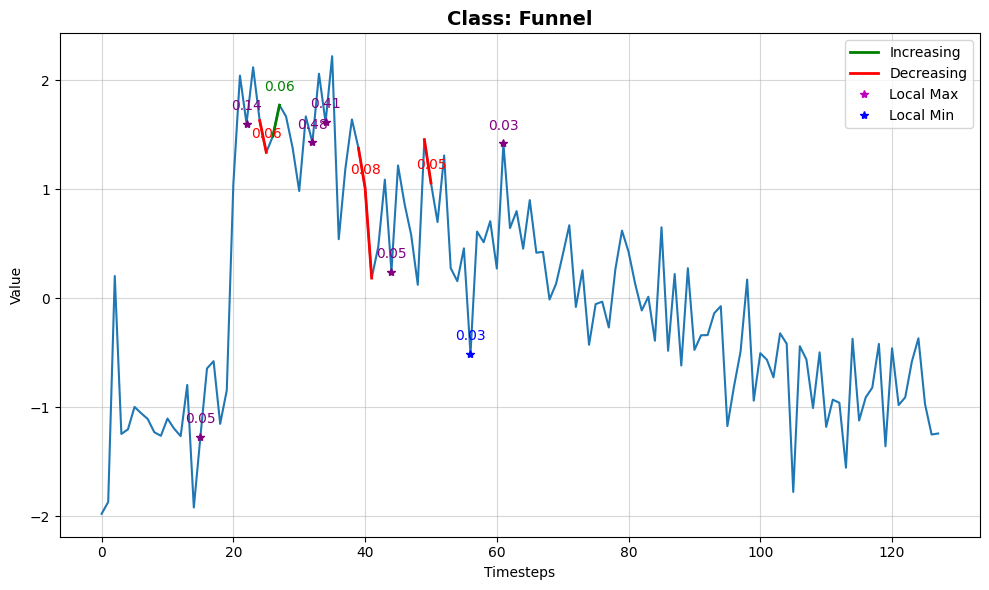

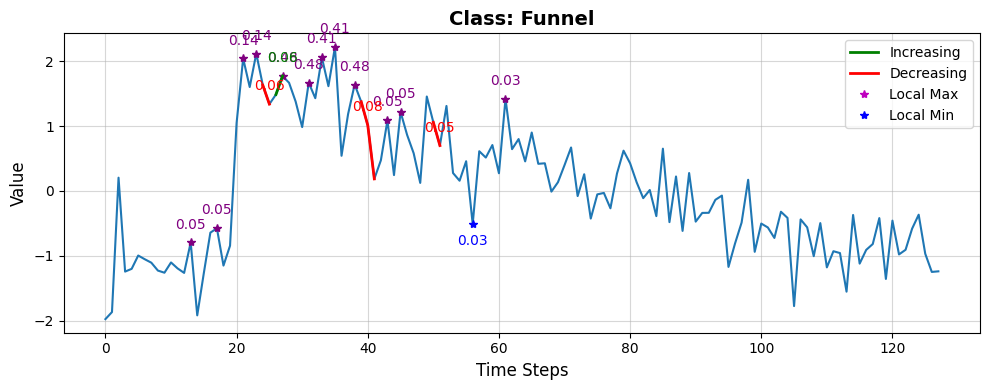

INFO:lomatce.explainer:Starting time series local explanation


Predection probability : tensor([1.6354e-02, 6.3617e-06, 9.8364e-01])
Cylinder:                      0.0164
Bell:                      0.0000
Funnel:                      0.9836


INFO:lomatce.explainer:Perturbed instances shap for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 14280 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 14125 samples)
Optimal number of clusters for Decreasing_ch1: 16
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 34973 samples)
Optimal number of clusters for LocalMax_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 36144 samples)
Optimal number of clusters for LocalMin_ch1: 3


INFO:lomatce.explainer:Final data shape: (1001, 57) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 57


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.92
INFO:lomatce.explainer:Local Prediction (Linear Model): 1.01
INFO:lomatce.explainer:Model Type: Ridge


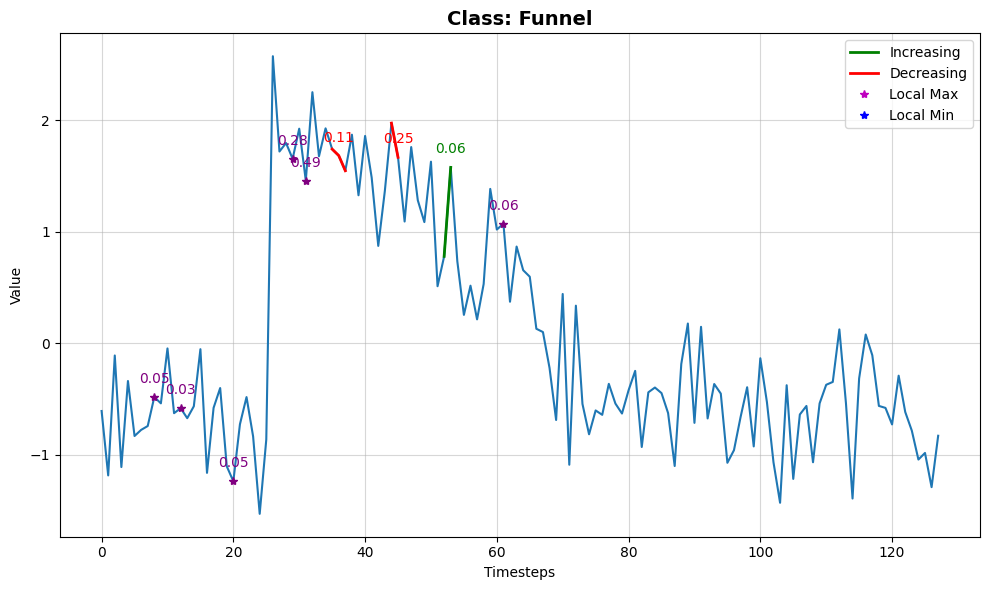

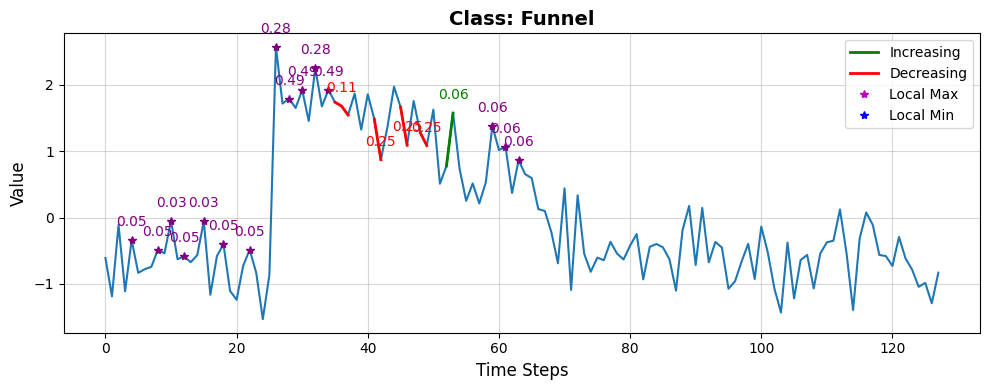

INFO:lomatce.explainer:Starting time series local explanation


Predection probability : tensor([8.3057e-03, 1.1762e-05, 9.9168e-01])
Cylinder:                      0.0083
Bell:                      0.0000
Funnel:                      0.9917


INFO:lomatce.explainer:Perturbed instances shap for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 17022 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 12383 samples)
Optimal number of clusters for Decreasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 37115 samples)
Optimal number of clusters for LocalMax_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 38053 samples)
Optimal number of clusters for LocalMin_ch1: 3


INFO:lomatce.explainer:Final data shape: (1001, 60) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 60


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.97
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.93
INFO:lomatce.explainer:Model Type: Ridge


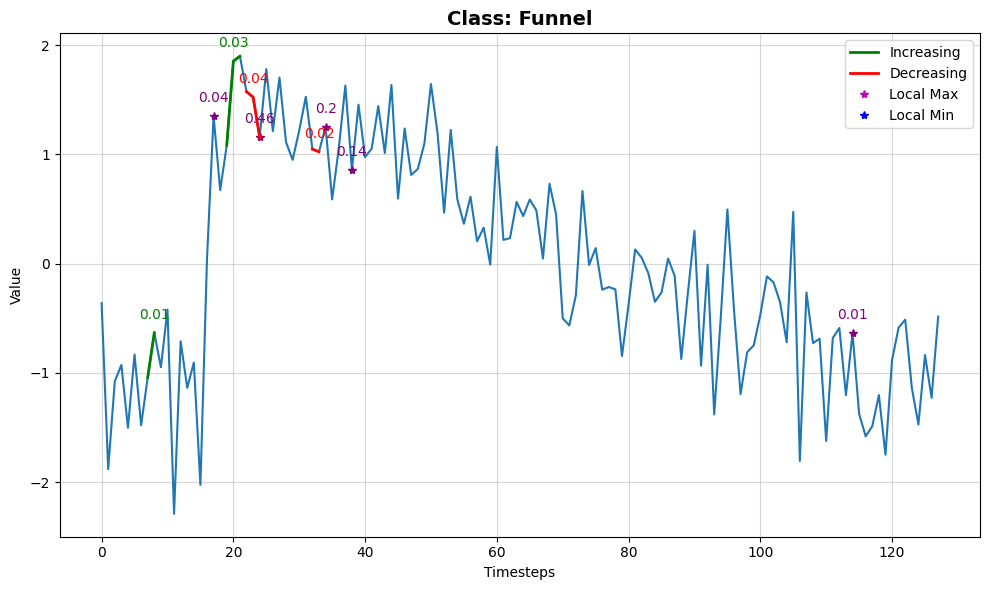

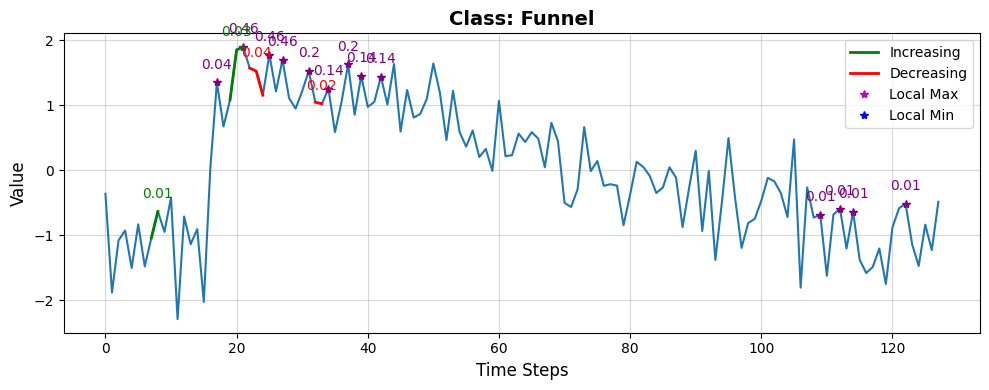

INFO:lomatce.explainer:Starting time series local explanation


Predection probability : tensor([7.5374e-02, 2.5336e-05, 9.2460e-01])
Cylinder:                      0.0754
Bell:                      0.0000
Funnel:                      0.9246


INFO:lomatce.explainer:Perturbed instances shap for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 11533 samples)
Optimal number of clusters for Increasing_ch1: 18
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 14369 samples)
Optimal number of clusters for Decreasing_ch1: 17
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 39368 samples)
Optimal number of clusters for LocalMax_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 39295 samples)
Optimal number of clusters for LocalMin_ch1: 19


INFO:lomatce.explainer:Final data shape: (1001, 73) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 73


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.89
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.99
INFO:lomatce.explainer:Model Type: Ridge


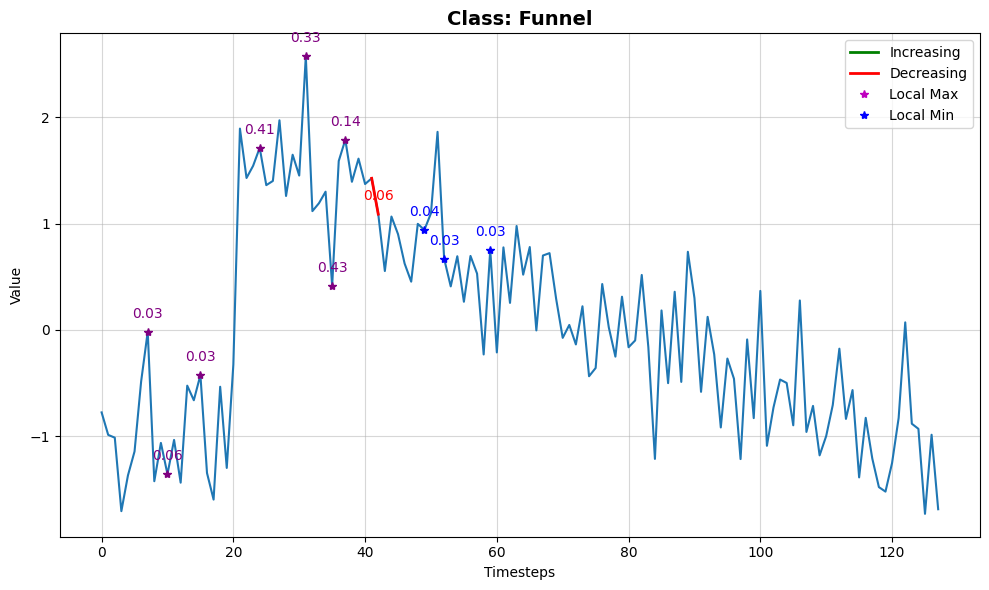

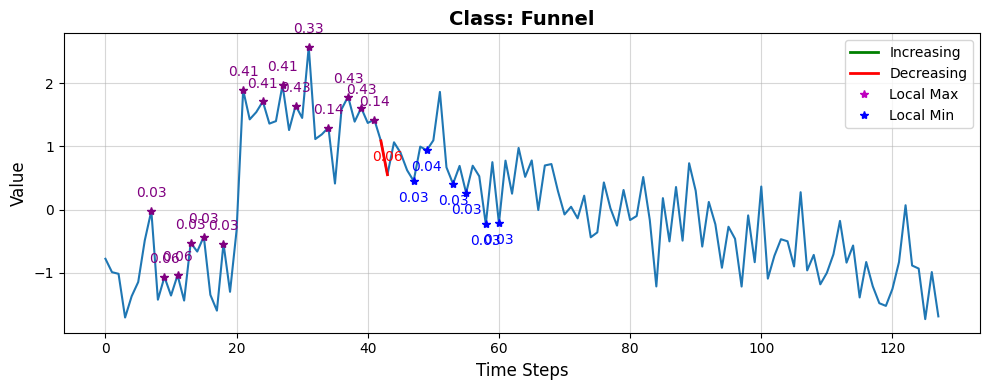

INFO:lomatce.explainer:Starting time series local explanation


Predection probability : tensor([1.2890e-02, 3.7007e-06, 9.8711e-01])
Cylinder:                      0.0129
Bell:                      0.0000
Funnel:                      0.9871


INFO:lomatce.explainer:Perturbed instances shap for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 15979 samples)
Optimal number of clusters for Increasing_ch1: 18
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 14314 samples)
Optimal number of clusters for Decreasing_ch1: 17
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 37944 samples)
Optimal number of clusters for LocalMax_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 37078 samples)
Optimal number of clusters for LocalMin_ch1: 3


INFO:lomatce.explainer:Final data shape: (1001, 57) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 57


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.92
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.99
INFO:lomatce.explainer:Model Type: Ridge


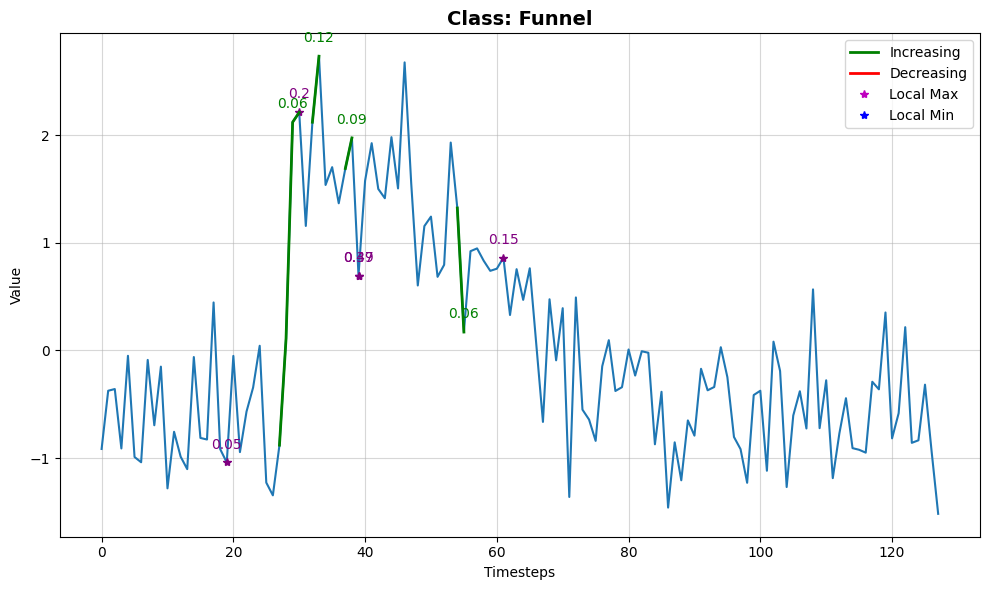

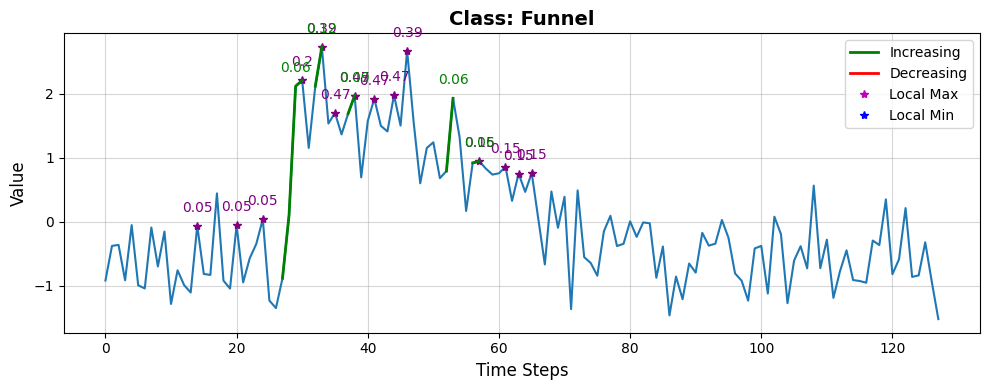

Predection probability : tensor([2.1208e-02, 4.6527e-05, 9.7875e-01])
Cylinder:                      0.0212
Bell:                      0.0000
Funnel:                      0.9787

📈 Global Faithfulness (Avg Local Fidelity): 0.8803

=== 📊 Final Visualization for All Classes ===



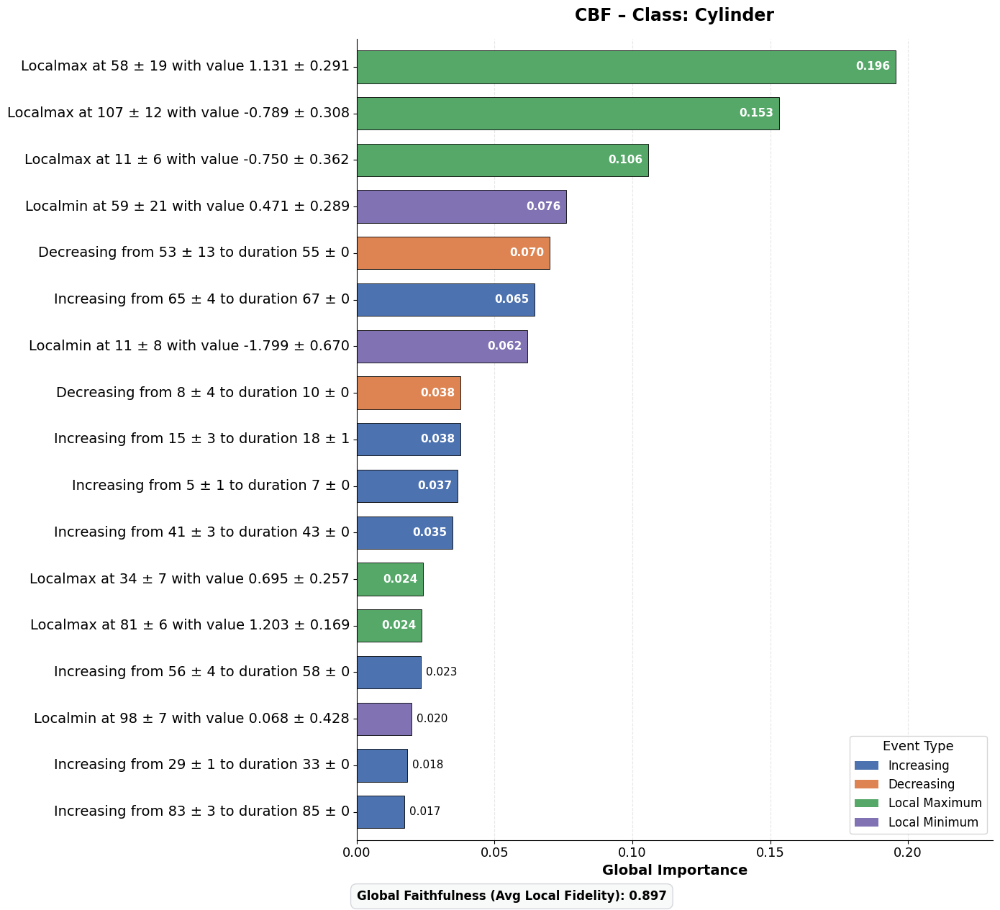

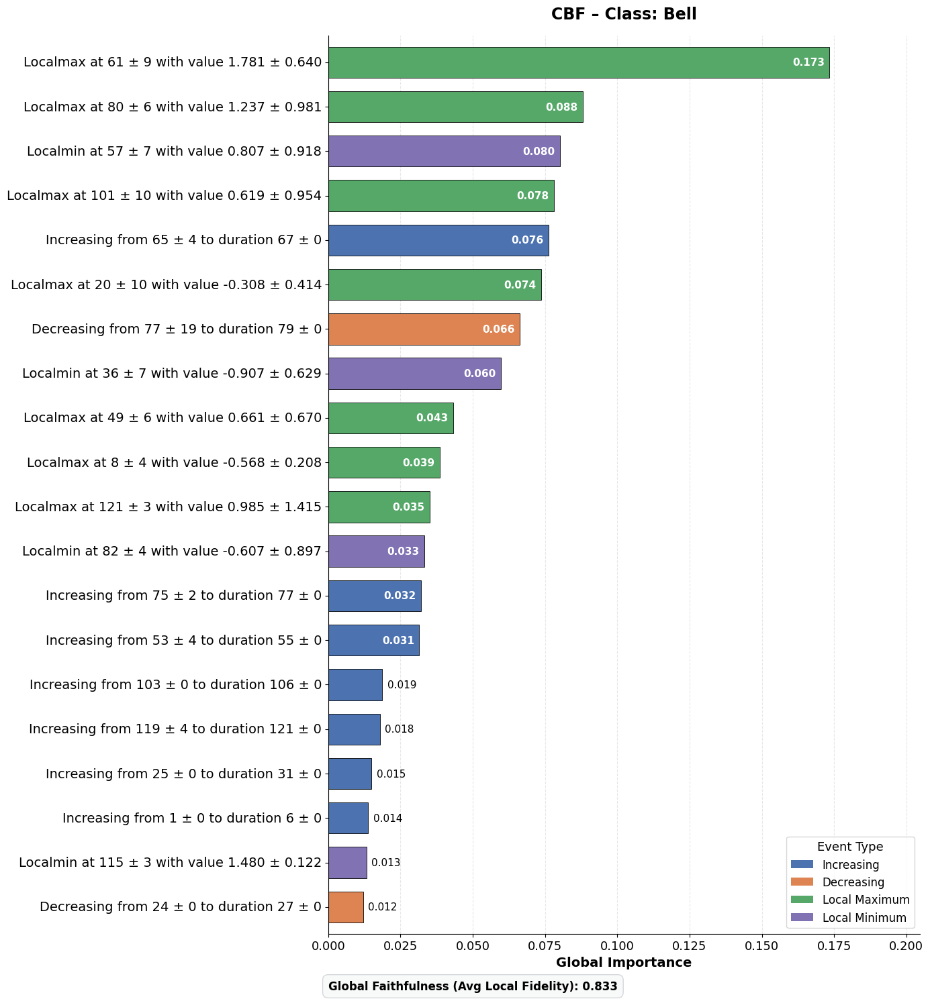

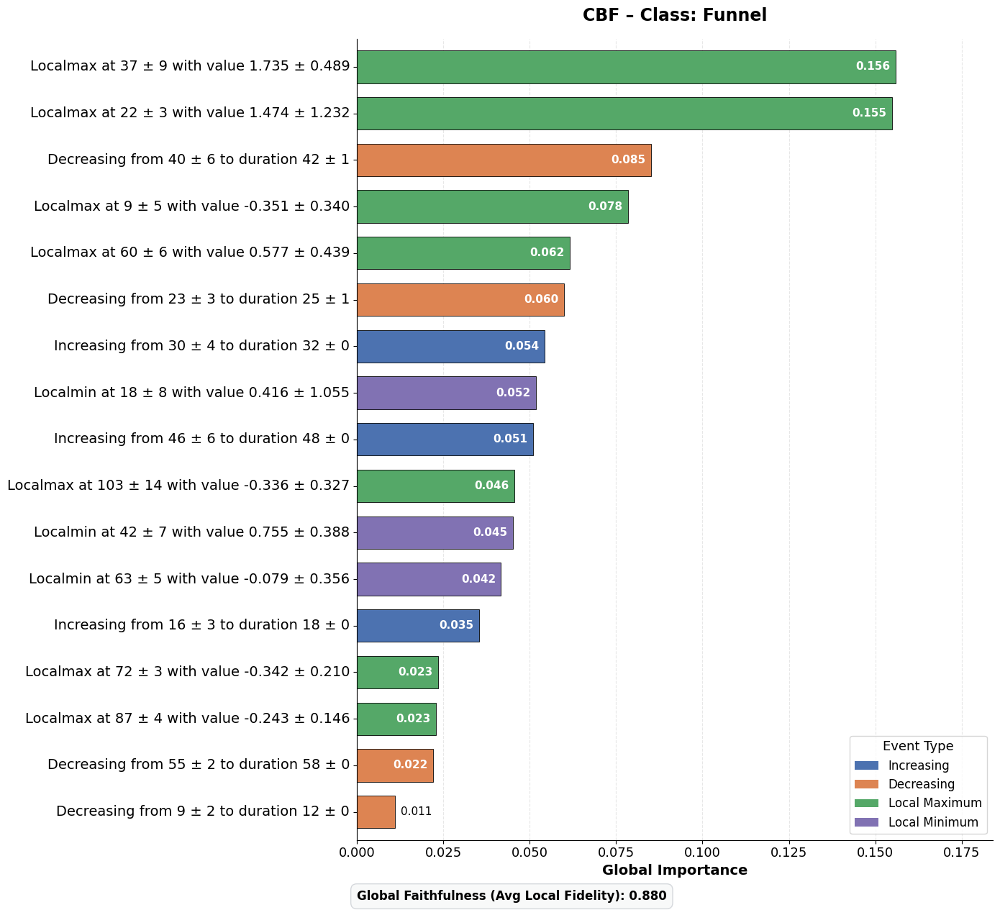

In [24]:
result_p95 = splomatce_explainer.run(X_test, test_preds, n_per_class=20, B=20, merge_percentile=95)